# Rank Bound Plot
This notebook plots all of the results from the rank bound analysis.

In [1]:
# from plot_code import *
import csv

# Code

In [2]:
import numpy as np
import ast
import matplotlib
import matplotlib.pyplot as plt
import os
import os.path
import matplotlib.ticker as ticker

num_checkpoints = 50
save_skip = 10
epochs_full = [i*save_skip for i in range(1,num_checkpoints+1)]
cmap = plt.get_cmap("tab10")
cmap2 = plt.get_cmap("tab20")
results_directory = "../results/"

def find_top_experiment(**kwargs):
    xids = find_matching_xids(**kwargs)
    experiments = import_csv('../experiments.csv')
    experiments = [row for row in experiments if row['xid'] in xids]
    
    top_params = experiments[0]
    top_acc = 0
    for experiment in experiments:
        try:
            acc = load_data(experiment['xid'], 0, 'test_accuracy')[-1]
        except:
            acc = 0
            print("Failed to load data for xid " + experiment['xid'])
        if acc > top_acc:
            top_params = experiment
            top_acc = acc
    try:
        train_acc = load_data(top_params['xid'], 0, 'train_accuracy')[-1]
    except:
        train_acc = 0
    return top_params, train_acc, top_acc

def plot_rank_bound(plot_name, xid, pid, save_directory, filetype, rank_max, bound_rank_max, plot_types, tol=0.001):
    if check_training_progress(xid, pid) == "early_stop": 
        print("early_stop xid", xid)
        return
    if not os.path.isdir(os.path.join(results_directory, str(xid), str(pid))): return

    layers = num_layers(xid, pid)
    print("xid:", xid)

    # FIRST PLOT ACTUAL RANK
    for layer in range(layers):
        ranks = compute_rank(xid, pid, tol)[layer]
        style = '-'
        label = 'layer ' + str(layer)

        ranks = ranks[:num_checkpoints] # truncate in case length exceeds max
        epochs = epochs_full[:len(ranks)] # truncate in case not finished training
        plt.errorbar(epochs, ranks, label=label, color=cmap(layer), linestyle=style)

    plt.xlim(1, num_checkpoints*save_skip)
    plt.ylim(1, rank_max)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel('Epoch', fontsize=15)
    plt.ylabel('Rank ', fontsize=15)
    plt.legend(loc='lower right', prop={'size':8})

    filename = "rank_bound_" + plot_name + "." + filetype
    plt.savefig(os.path.join(save_directory, filename))
    plt.show()

    # PLOT ACCURACY

    plot_accuracy(plot_name, '', [''], [xid], 0, '', '')

    # PLOT THE BOUNDS
    
    for plot_type in plot_types:
        for layer in range(layers):
            ranks = load_data(xid, pid, plot_type+"_"+str(layer))
            style = '-'
            label = 'layer ' + str(layer)

            ranks = ranks[:num_checkpoints] # truncate in case length exceeds max
            epochs = epochs_full[:len(ranks)] # truncate in case not finished training
            plt.errorbar(epochs, ranks, label=label, color=cmap(layer), linestyle=style)

        plt.xlim(1, num_checkpoints*save_skip)
        plt.ylim(0, 10)
        #plt.semilogy()
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)
        plt.xlabel('Epoch', fontsize=15)
        plt.ylabel(plot_type.replace('_',' '), fontsize=15)
        plt.legend(loc='lower right', prop={'size':8})

        filename = plot_type+"_" + plot_name + "." + filetype
        plt.savefig(os.path.join(save_directory, filename))
        plt.show()

def plot_norm_conv(plot_name, xid, pid, save_directory, filetype, rank_max):
    if check_training_progress(xid, pid) == "early_stop": 
        print("early_stop xid", xid)
        return
    if not os.path.isdir(os.path.join(results_directory, str(xid), str(pid))): return

    layers = num_layers(xid, pid)
    print("xid:", xid)
    
    # PLOT ACCURACY
    plot_accuracy(plot_name, '', [''], [xid], 0, '', '')
    
    for layer in range(layers):
        norms = load_data(xid, pid, "f_norm_"+str(layer))
        conv = []
        
        for i in range(1, len(norms)):
            conv.append(norms[i]/norms[i-1])

        style='-'
        label= 'layer ' + str(layer)
        
        conv = conv[:num_checkpoints] # truncate in case length exceeds max
        epochs = epochs_full[:len(conv)] # truncate in case not finished training
        plt.errorbar(epochs, conv, label=label, color=cmap2(layer), linestyle=style)
        
    plt.xlim(1, num_checkpoints*save_skip)
    # plt.ylim(0, 10)
    plt.semilogy()
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel('Epoch', fontsize=15)
    plt.legend(loc='lower right', prop={'size':8})

    filename = "norm_conv_" + plot_name + "." + filetype
    plt.tight_layout()
    plt.savefig(os.path.join(save_directory, filename))
    plt.show()
    
def plot_norm(plot_name, xid, pid, save_directory, filetype, rank_max):
    if check_training_progress(xid, pid) == "early_stop": 
        print("early_stop xid", xid)
        return
    if not os.path.isdir(os.path.join(results_directory, str(xid), str(pid))): return

    layers = num_layers(xid, pid)
    print("xid:", xid)
    
    # PLOT ACCURACY
    plot_accuracy(plot_name, '', [''], [xid], 0, '', '')
    
    count=0
    for layer in range(layers):
        count+=1
        norms = load_data(xid, pid, "f_norm_"+str(layer))

        style='-'
        label= 'layer ' + str(layer)
        
        norms = norms[:num_checkpoints] # truncate in case length exceeds max
        epochs = epochs_full[:len(norms)] # truncate in case not finished training
        if count%2==0:
            plt.errorbar(epochs, norms, label=label, color=cmap2(layer), linestyle=style)
        
    plt.xlim(1, num_checkpoints*save_skip)
    # plt.ylim(0, 10)
    plt.semilogy()
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel('Epoch', fontsize=15)
    plt.legend(loc='lower right', prop={'size':8})

    filename = "norm_" + plot_name + "." + filetype
    plt.tight_layout()
    plt.savefig(os.path.join(save_directory, filename))
    plt.show()

# Verifies whether the given experiment is finished training, prints a warning if not
def check_training_progress(xid, pid):
    vals = load_data(xid, pid, 'avg_rank')
    
    if not os.path.isdir(os.path.join(results_directory, str(xid), str(pid))):
        print("Warning: Experiment " + str(xid) + "/" + str(pid) + " does not " + 
              "exist or training has not commenced.")
        return
    if len(vals) < num_checkpoints and not os.path.isfile(os.path.join(results_directory, str(xid), str(pid), 'EARLY_STOP')):
        print("Warning: Experiment " + str(xid) + "/" + str(pid) + 
              " has not finished training. (Epoch " + str((len(vals)-1)*save_skip) + 
              " / " + str(num_checkpoints*save_skip) + ")")
    if len(vals) > num_checkpoints:
        print("Warning: Experiment " + str(xid) + "/" + str(pid) + 
              " has duplicate entries.")
    if os.path.isfile(os.path.join(results_directory, str(xid), str(pid), 'EARLY_STOP')):
        return "early_stop"


# Loads the data from .txt file in results directory
def load_data(xid, pid, plot_name):
    filepath = os.path.join(results_directory, str(xid), str(pid), plot_name + ".txt")
    if not os.path.isfile(filepath): return []
    
    f = open(filepath, "r")
    st = f.read().replace('nan', '0')
    vals = np.array(ast.literal_eval(st))
    
    return vals


# Returns the number of layers in the network
def num_layers(xid, pid):
    if not os.path.isdir(os.path.join(results_directory, str(xid), str(pid))): return 0
    
    num_layers = 0
    for filename in os.listdir(os.path.join(results_directory, str(xid), str(pid))):
        if "singvals_" in filename: num_layers+=1
    
    return num_layers


# Returns a 2D array of singular values, indexed by layer
def load_singvals(xid, pid):    
    singvals = []
    for layer in range(num_layers(xid, pid)):
        singvals.append(load_data(xid, pid, "singvals_"+str(layer)))
    
    return singvals


# Computes the rank from the singular values by layer
def compute_rank(xid, pid, tol):
    singvals = load_singvals(xid, pid)
    rank_by_layer = []
    
    for layer in range(len(singvals)):
        rank_by_layer.append([])
        layer_singvals = singvals[layer]
        
        for epoch in layer_singvals:
            rank = 0
            for singval in epoch:
                if singval > tol:
                    rank+=1
            rank_by_layer[layer].append(rank)
    
    return np.array(rank_by_layer)


# Computes the average rank across all layers
def compute_avg_rank(xid, pid, tol):
    rank_by_layer = compute_rank(xid, pid, tol)
    
    rank = [0]*len(rank_by_layer[0])
    for layer in rank_by_layer:
        element_num = 0
        for element in layer:
            rank[element_num] += element
            element_num += 1
    
    for layer in range(len(rank)):
        rank[layer] /= num_layers(xid, pid)
        
    return np.array(rank)

# Plot loss
def plot_loss(plot_name, parameter_name, parameters, xids, pid, save_directory, filetype):
    if len(parameters) != len(xids): raise ValueError("Parameters and xids must be of same length")
    
    for xid in xids: check_training_progress(xid, pid)
    
    for plot_type in ['train_loss', 'test_loss']:
        for i, xid in enumerate(xids):
            if not os.path.isdir(os.path.join(results_directory, str(xid), str(pid))): continue
            
            loss = load_data(xid, pid, plot_type)
            if plot_type == 'train_loss':
                style = '-'
                label = 'train; ' + parameter_name + ' ' + str(parameters[i])
            elif plot_type == 'test_loss':
                style = '--'
                label = 'test; ' + parameter_name + ' ' + str(parameters[i])
            
            loss = loss[:num_checkpoints] # truncate in case length exceeds max
            epochs = epochs_full[:len(loss)] # truncate in case not finished training
            plt.errorbar(epochs, loss, label=label, color=cmap(i), linestyle=style)
            
            plt.xlim(1,num_checkpoints*save_skip)
            plt.xticks(fontsize=12)
            plt.yticks(fontsize=12)
            plt.xlabel('Epoch', fontsize=15)
            plt.ylabel('Loss', fontsize=15)
            plt.legend(loc='upper right', prop={'size': 6})
            
    filename = "loss_" + plot_name + "_" + parameter_name.replace(" ", "_") + "." + filetype
    plt.savefig(os.path.join(save_directory, filename))
    plt.show()

# Plot complexity
def plot_complexity(plot_name, parameter_name, parameters, xids, pid, save_directory, filetype, tol=0.001, plot_rank=False):
    if len(parameters) != len(xids): raise ValueError("Parameters and xids must be of same length")
    
    for xid in xids: check_training_progress(xid, pid)
    
    fig = plt.figure()
    ax1 = fig.add_subplot(111)
    if plot_rank: ax2 = ax1.twinx()

    for i, xid in enumerate(xids):
        if not os.path.isdir(os.path.join(results_directory, str(xid), str(pid))): continue
        
        # Plot the Complexity
        complexity = load_data(xid, pid, "complexity")
        
        style = '-'
        label = 'complexity; ' + parameter_name + ' ' + str(parameters[i])
        
        complexity = complexity[:num_checkpoints] # truncate in case length exceeds max
        epochs = epochs_full[:len(complexity)] # truncate in case not finished training
        
        l1 = ax1.errorbar(epochs, complexity, label=label, color=cmap(i), linestyle=style)
        ax1.set_ylabel("Complexity", fontsize=15)
        ax1.semilogy()
        
        # Plot the Rank
        if plot_rank:
            ranks = compute_avg_rank(xid, pid, tol)
            style = '--'
            label = 'rank; ' + parameter_name + ' ' + str(parameters[i])
            ranks = ranks[:num_checkpoints] # truncate in case length exceeds max
            epochs = epochs_full[:len(ranks)] # truncate in case not finished training

            ax2.set_ylabel("Rank", fontsize=15)
            l2 = ax2.errorbar(epochs, ranks, label=label, color=cmap(i), linestyle=style)
        
        # Construct the Graph
        plt.xlim(1,num_checkpoints*save_skip)
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)
        plt.xlabel('Epoch', fontsize=15)
        
    if plot_rank:
        fig.legend(loc='upper right', prop={'size': 6})
    else:
        ax1.legend(loc='upper right', prop={'size': 6})
        
    filename = "comp_" + plot_name + "_" + parameter_name.replace(" ", "_") + "." + filetype
    plt.savefig(os.path.join(save_directory, filename))
    plt.savefig(os.path.join(save_directory, filename))


# Plot the normalized rank
def plot_rank_normalized(plot_name, parameter_name, parameters, xids, pid, save_directory, filetype, tol=0.001, stable_rank=False, semilog=False):
    if len(parameters) != len(xids): raise ValueError("Parameters and xids must be of same length")
    
    for xid in xids: check_training_progress(xid, pid)
    
    if stable_rank: plot_types = ['rank', 'stable_rank']
    else: plot_types = ['rank']
    
    for plot_type in plot_types:
        for i, xid in enumerate(xids):
            if not os.path.isdir(os.path.join(results_directory, str(xid), str(pid))): continue
            
            if plot_type == 'rank':
                ranks = compute_avg_rank(xid, pid, tol)
                style = '-'
                label = parameter_name + ' ' + str(parameters[i])
            elif plot_type == 'stable_rank':
                if os.path.isfile(os.path.join(results_directory, str(xid), str(pid), "avg_stable_rank.txt")):
                    ranks = load_data(xid, pid, 'avg_stable_rank') 
                else: # for old experiments where stable rank not explicitly recorded
                    ranks = compute_avg_stable_rank(xid, pid)
                style = '--'
                label = 'stable rank; ' + parameter_name + ' ' + str(parameters[i])
            
            ranks = ranks[:num_checkpoints]/ranks[0] # truncate in case length exceeds max
            epochs = epochs_full[:len(ranks)] # truncate in case not finished training
            plt.errorbar(epochs, ranks, label=label, color=cmap(i), linestyle=style)
            
            plt.xlim(1, num_checkpoints*save_skip)
            plt.ylim(0, 1)
            if semilog: plt.semilogy()
            plt.xticks(fontsize=12)
            plt.yticks(fontsize=12)
            plt.xlabel('Epoch', fontsize=15)
            plt.ylabel('Normalized Avg. Rank', fontsize=15)
            plt.legend(loc='lower right', prop={'size':8})
    
    filename = "rank_normalized_" + plot_name + "_" + parameter_name.replace(" ", "_") + "." + filetype
    plt.savefig(os.path.join(save_directory, filename))
    plt.show()


# 3D plot of the singular values across epochs
def plot_singvals_epoch(plot_name, xid, pid, layer, save_directory, filetype):
    check_training_progress(xid, pid)
    if not os.path.isdir(os.path.join(results_directory, str(xid), str(pid))): return

    singvals = load_singvals(xid, pid)[layer]

    fig = plt.figure(figsize=(5, 5)) 
    ax = fig.add_subplot(1, 1, 1, projection='3d')
    ax.view_init(25, 45)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Index")
    ax.set_zlabel("Singular Value")

    xpos, ypos, zpos, dx, dy, dz = [], [], [], [], [], []

    for i, epoch in enumerate(singvals):
        for j, singval in enumerate(epoch):
            xpos.append(i*save_skip)
            ypos.append(j)
            zpos.append(0)

            dx.append(0.5)
            dy.append(5)
            dz.append(singval)

    ax.bar3d(xpos, ypos, zpos, dx, dy, dz, lightsource=matplotlib.colors.LightSource(70, 0))

    filename = "singvals_epoch_" + plot_name + "_layer_" + str(layer) + "." + filetype
    plt.savefig(os.path.join(save_directory, filename))
    plt.show()


# 2D plot of the singular values at the end of training across various hyperparameters
def plot_singvals_param(plot_name, parameter_name, parameters, xids, pid, layer, save_directory, filetype, tol=None):
    if len(parameters) != len(xids): raise ValueError("Parameters and xids must be of same length")
    
    for xid in xids: check_training_progress(xid, pid)
    
    exists=False
    for i, xid in enumerate(xids):
        if not os.path.isdir(os.path.join(results_directory, str(xid), str(pid))): continue
        exists=True
        
        style = "-"
        label = parameter_name + ' ' + str(parameters[i])
        
        singvals = load_singvals(xid, pid)[layer][-1]
        plt.errorbar(range(len(singvals)), singvals, label=label, color=cmap(i), linestyle=style, fmt='.')
    
    if not exists: return
    
    if tol is not None:
        plt.errorbar(range(len(singvals)), [tol]*len(singvals), label='tol', color=cmap(len(xids)+1), linestyle='--')
    
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel('Index', fontsize=15)
    plt.ylabel('Singular Value', fontsize=15)
    plt.legend(loc='lower left', prop={'size':8})
    plt.semilogy()
    
    filename = "singvals_param_" + plot_name + "_layer_" + str(layer) + "." + filetype
    plt.tight_layout()
    plt.savefig(os.path.join(save_directory, filename))
    plt.show()


# 3D plot of the rank by layer over epochs
def plot_rank_by_layer(plot_name, xid, pid, save_directory, filetype, tol=0.001):
    check_training_progress(xid, pid)
    if not os.path.isdir(os.path.join(results_directory, str(xid), str(pid))): return

    fig = plt.figure(figsize=(10,10))
    
    ax1 = fig.add_subplot(1, 2, 1, projection='3d')
    ax1.view_init(30, 0)
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Layer")
    ax1.set_zlabel("Rank")
    
    ax2 = fig.add_subplot(1, 2, 2, projection='3d')
    ax2.view_init(30, 60)
    ax2.set_xlabel("Epoch")
    ax2.set_ylabel("Layer")
    ax2.set_zlabel("Rank")
    
    xpos, ypos, zpos, dx, dy, dz = [], [], [], [], [], []
    
    ranks = compute_rank(xid, pid, tol)
    
    for layer_num in range(len(ranks)):
        for epoch in range(len(ranks[layer_num])):
            xpos.append(epoch*save_skip)
            ypos.append(layer_num)
            zpos.append(0)
            
            dx.append(save_skip)
            dy.append(1)
            dz.append(ranks[layer_num, epoch])
            
    ax1.bar3d(xpos, ypos, zpos, dx, dy, dz, lightsource=matplotlib.colors.LightSource(45, 0))
    ax2.bar3d(xpos, ypos, zpos, dx, dy, dz, lightsource=matplotlib.colors.LightSource(45, 0))
    
    filename = "rank_by_layer_" + plot_name + "_depth_" + str(num_layers(xid, pid)) + "." + filetype
    plt.savefig(os.path.join(save_directory, filename))
    plt.show()





In [169]:
# Plot rank and stable rank
def plot_rank(plot_name, parameter_name, parameters, xids, pid, save_directory, filetype, tol=0.001, semilog=False, rank_max=500, rank_bound=None, rank_bound_label=None, legend_loc='lower right', plt_err=False):
    if not plt_err: xids = [xids]
    if len(parameters) != len(xids[0]): raise ValueError("Parameters and xids must be of same length")
    
    for xid in np.array(xids).flatten(): check_training_progress(xid, pid)
    ranks = np.zeros((len(xids[0]), len(xids), 50))

    for j, experiment in enumerate(xids):
        for i, xid in enumerate(experiment):
            try:
                if not os.path.isdir(os.path.join(results_directory, str(xid), str(pid))): continue
                padded_arr = np.zeros(50)
                for k, entry in enumerate(compute_avg_rank(xid, pid, tol)): padded_arr[k] = entry
                ranks[i, j] = padded_arr
            except Exception as e:
                print("Failed to plot experiment:", xid)
                print(e)
    
    ranks_mean = np.mean(ranks, axis=1)
    ranks_std = np.std(ranks, axis=1)
    
    for i in range(ranks_mean.shape[0]):
        style = '-'
        label = '$' + parameter_name + ' = ' + str(parameters[i]) + '$'
        epochs = epochs_full
        
        plt.errorbar(epochs, ranks_mean[i], label=label, color=cmap(i), linestyle=style)
        if plt_err:
            plt.fill_between(epochs, ranks_mean[i]-ranks_std[i], ranks_mean[i]+ranks_std[i], color=cmap(i), alpha=0.2)   
        
    plt.xlim(1, num_checkpoints*save_skip)
    plt.ylim(1, rank_max)
    if semilog: plt.semilogy()
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel('Epoch', fontsize=15)
    plt.ylabel('Average Rank', fontsize=15)
    plt.legend(loc=legend_loc, prop={'size':10})
    plt.grid(visible=True)
              
    """if rank_bound is not None:
        yticks = []
        for i, rb in enumerate(rank_bound):
            plt.axhline(rb, color=cmap(i+1), linestyle='--', label='Rank Bound, $\epsilon='+str(rank_bound_label[i])+'$')
            yticks.append(rb)
            
        plt.ylim(min(ranks)/2, rank_max)
        plt.semilogy()
        
        ax = plt.gca()
        yticks += [tick for tick in ax.get_yticks() if min(ranks)/2 <= tick <= rank_max]
        
        print(ax.get_yticks())
        print(yticks)
            
        ax.set_yticks(yticks)
        ax.set_yticklabels(['${:,.2e}$'.format(tick) for tick in yticks])
        plt.legend(loc=legend_loc, prop={'size':14})"""
        
    filename = "rank_" + plot_name + "_" + parameter_name.replace(" ", "_") + "." + filetype
    plt.tight_layout()
    plt.savefig(os.path.join(save_directory, filename))
    plt.show()

# Plot rank and stable rank
def plot_accuracy(plot_name, parameter_name, parameters, xids, pid, save_directory, filetype, legend_loc='lower right', plt_err=False):
    if not plt_err: xids = [xids]
    if len(parameters) != len(xids[0]): raise ValueError("Parameters and xids must be of same length")
    
    for xid in np.array(xids).flatten(): check_training_progress(xid, pid)
    
    for plot_type in ['train_accuracy', 'test_accuracy']:
        accs = np.zeros((len(xids[0]), len(xids), 50))
        for j, experiment in enumerate(xids):
            for i, xid in enumerate(experiment):
                try:
                    if not os.path.isdir(os.path.join(results_directory, str(xid), str(pid))): continue
                    padded_arr = np.zeros(50)
                    for k, entry in enumerate(load_data(xid, pid, plot_type)): padded_arr[k] = entry
                    accs[i, j] = padded_arr
                except Exception as e:
                    print("Failed to plot experiment:", xid)
                    print(e)

        accs_mean = np.mean(accs, axis=1)
        accs_std = np.std(accs, axis=1)

        for i in range(accs_mean.shape[0]):

            if plot_type == 'train_accuracy': 
                style = '-'
                label = '$' + parameter_name + ' = ' + str(parameters[i]) + '$'
            elif plot_type == 'test_accuracy': 
                style = '--'
                label = None
            
            epochs = epochs_full
            
            plt.errorbar(epochs, accs_mean[i], label=label, color=cmap(i), linestyle=style)
            if plt_err:
                plt.fill_between(epochs, accs_mean[i]-accs_std[i], accs_mean[i]+accs_std[i], color=cmap(i), alpha=0.2)

            # if plt_err:
            #     plt.errorbar(epochs, accs_mean[i], label=label, yerr=accs_std[i], color=cmap(i), linestyle=style)
            # else:
            #     plt.errorbar(epochs, accs_mean[i], label=label, color=cmap(i), linestyle=style)
        
    plt.xlim(1, num_checkpoints*save_skip)
    plt.ylim(0, 1.05)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel('Epoch', fontsize=15)
    plt.ylabel('Accuracy', fontsize=15)
    plt.legend(loc=legend_loc, prop={'size':10})
    plt.grid(visible=True)
        
    filename = "acc_" + plot_name + "_" + parameter_name.replace(" ", "_") + "." + filetype
    plt.tight_layout()
    plt.savefig(os.path.join(save_directory, filename))
    plt.show()

# Plots rank and accuracy
def plot_all(plot_name, parameter_name, parameters, xids, pid, save_directory, filetype, tol=0.001, stable_rank=False, rank_max=500, plot_singvals=False, rank_bound=None, rank_bound_label=None, plt_err=False):
    plot_rank(plot_name, parameter_name, parameters, xids, pid, save_directory, filetype, tol=tol, rank_max=rank_max, rank_bound=rank_bound, rank_bound_label=rank_bound_label, legend_loc='lower right', plt_err=plt_err)
    if plot_singvals: plot_singvals_param(plot_name, parameter_name, parameters, xids, pid, 3, save_directory, filetype, tol=tol)
    plot_accuracy(plot_name, parameter_name, parameters, xids, pid, save_directory, filetype, plt_err=plt_err)

In [44]:
# Plot contour
def plot_contour(plot_name, parameter_name_1, parameter_name_2, parameters_1, parameters_2, xids, pid, save_directory, filetype, tol=0.001):
    if len(parameters_1) != len(xids): raise ValueError("Parameters and xids must be of same length")
    if len(parameters_2) != len(xids): raise ValueError("Parameters and xids must be of same length")
    
    final_ranks = []
    for xid in xids: 
        check_training_progress(xid, pid)
        if not os.path.isdir(os.path.join(results_directory, str(xid), str(pid))): continue
        final_ranks.append(compute_avg_rank(xid, pid, tol)[-1])
    
    parameters_1 = [float(x) for x in parameters_1]
    parameters_2 = [float(x) for x in parameters_2]
    
    print("parameter_name_1", parameter_name_1, f"({len(parameters_1)})")
    print(parameters_1)
    print("parameter_name_2", parameter_name_2, f"({len(parameters_2)})")
    print(parameters_2)
    print("final ranks", f"({len(final_ranks)})")
    print(final_ranks)
    
    p1 = list(set(parameters_1))
    p1.sort()
    p2 = list(set(parameters_2))
    p2.sort()
    X, Y = np.meshgrid(p1, p2)
    Z = np.zeros(X.shape)
    
    for i in range(Z.shape[0]):
        for j in range(Z.shape[1]):
            for k in range(len(parameters_1)):
                if parameters_1[k] == X[i,j] and parameters_2[k] == Y[i,j]:
                    Z[i,j] = final_ranks[k]
                    break
                    
    plot = plt.contourf(X, Y, Z, levels=np.linspace(Z.min(), Z.max(), 100))
    plt.colorbar(plot)
    plt.xlabel("$" + parameter_name_1 + "$", fontsize=15)
    plt.ylabel("$" + parameter_name_2 + "$", fontsize=15)
    plt.title("Rank at End of Training")

    filename = "contour_" + plot_name + "." + filetype
    plt.tight_layout()
    plt.savefig(os.path.join(save_directory, filename))
    plt.show()

In [80]:
def import_csv(filepath):
    with open(filepath, newline='', encoding='utf-8-sig') as csvfile:
        reader = csv.DictReader(csvfile)
        rows = []
        for row in reader:
            rows.append(row)
    return rows

def find_matching_xids(**kwargs):
    rows = import_csv('../experiments.csv')
    xids = []
    for row in rows:
        match = True
        for param, value in kwargs.items():
            if str(row[param]).replace('.','',1).isdigit():
                row[param] = str(float(row[param]))
            if str(value).replace('.','',1).isdigit():
                value = str(float(value))
            
            if str(row[param]).lower() != str(value).lower():
                match = False
                break
        if match:
            xids.append(row['xid'])
    return xids

def find_free_params(xids):
    rows = import_csv('../experiments.csv')
    rows = [row for row in rows if row['xid'] in xids]
    EXCLUDE = ['TIME_NOW', 'xid', 'pid']
    free_params = []
    for row in rows:
        for param, value in row.items():
            if  rows[0][param].lower() != value.lower() and param not in free_params and param not in EXCLUDE:
                free_params.append(param)
    return free_params

def param_plot(plot_name,
               rank_max=500, 
               bound_rank_max=20, 
               tol=0.001, 
               plot_singvals=False, 
               rank_bound=False, 
               plot_types=None, 
               norm_conv=False,
               contour=False,
               norm=False,
               plt_err=False,
               **kwargs):
    
    experiments = import_csv('../experiments.csv')
    if plt_err:
        xids = [find_matching_xids(trial=i, **kwargs) for i in range(5)]
        free_params = find_free_params(xids[0])
        experiments = [row for row in experiments if row['xid'] in xids[0]]
    else:
        xids = find_matching_xids(**kwargs)
        free_params = find_free_params(xids)
        experiments = [row for row in experiments if row['xid'] in xids]
        
    print("xids:", xids)
    
    if len(free_params) > 1 and not contour: raise Exception("Too many free params:", free_params)
    if len(free_params) > 2 and contour: raise Exception("Too many free params:", free_params)
    if len(xids) == 0: raise Exception("No experiments match the criteria.")
    #if len(xids) > 1 and layer != -1: raise Exception("Too many free params:", free_params)
    
    plt.rcParams["figure.figsize"] = (4,3)
    param_map = {
        "lr" : "\mu",
        "weight_decay": "\lambda",
        "batch_size": "B",
    }
    
    if rank_bound:
        plot_rank_bound(plot_name=plot_name, 
                        xid=xids[0], 
                        pid=0, 
                        save_directory='./sweep_figs/', 
                        filetype='.pdf', 
                        rank_max=rank_max,
                        bound_rank_max=bound_rank_max,
                        tol=tol,
                        plot_types=plot_types)
    elif norm_conv:
        plot_norm_conv(plot_name=plot_name,
                        xid=xids[0], 
                        pid=0, 
                        save_directory='./sweep_figs/', 
                        filetype='.pdf', 
                        rank_max=rank_max)
    elif norm:
        plot_norm(plot_name=plot_name,
                        xid=xids[0], 
                        pid=0, 
                        save_directory='./sweep_figs/', 
                        filetype='.pdf', 
                        rank_max=rank_max)
    elif contour:
        plot_contour(plot_name=plot_name,
                     parameter_name_1=param_map[free_params[0]],
                     parameter_name_2=param_map[free_params[1]],
                     parameters_1=[experiments[i][free_params[0]] for i in range(len(xids))],
                     parameters_2=[experiments[i][free_params[1]] for i in range(len(xids))],
                     xids=xids,
                     pid=0,
                     save_directory='./sweep_figs/',
                     filetype='.pdf',
                     tol=tol)
    else:
        num_params = len(xids[0]) if plt_err else len(xids)
        plot_all(plot_name=plot_name,
                 parameter_name=param_map[free_params[0]],
                 parameters=[experiments[i][free_params[0]] for i in range(num_params)],
                 xids=xids,
                 pid=0,
                 save_directory='./sweep_figs/',
                 filetype='.pdf',
                 tol=tol,
                 rank_max=rank_max,
                 plot_singvals=plot_singvals,
                 plt_err=plt_err)

# NeurIPS Experiments (8/2/23)

## Grid (Leaky ReLU, Error Bars, Fig 1)

xids: [['7486', '7487', '7488', '7489'], ['7498', '7499', '7500', '7501'], ['7510', '7511', '7512', '7513'], ['7522', '7523', '7524', '7525'], ['7534', '7535', '7536', '7537']]


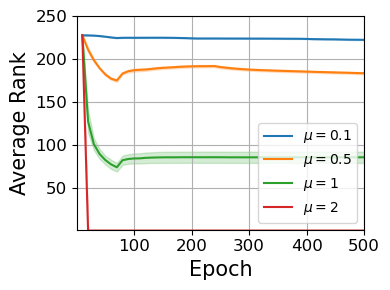

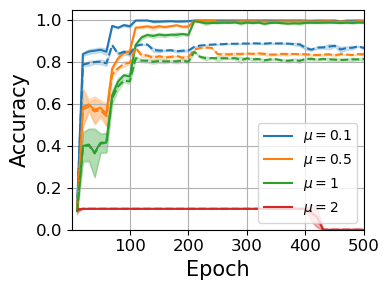

In [170]:
param_plot(
        plot_name='',
        net='resnet',
        dataset_name='CIFAR10',
        loss='CE', 
        #lr=0.5,
        weight_decay=5e-4,
        batch_size=4,
        activation='leaky_relu',
        
        plt_err=True,
        tol=0.001,
        rank_max=250)

xids: [['7490', '7491', '7492', '7493'], ['7502', '7503', '7504', '7505'], ['7514', '7515', '7516', '7517'], ['7526', '7527', '7528', '7529'], ['7538', '7539', '7540', '7541']]


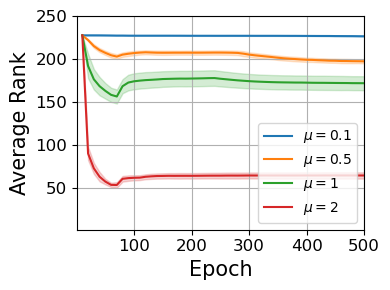

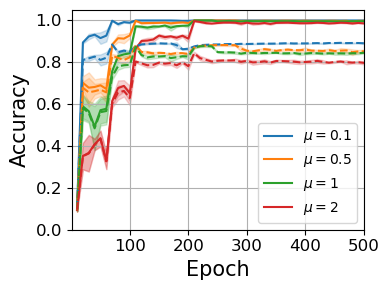

In [179]:
param_plot(
        plot_name='',
        net='resnet',
        dataset_name='CIFAR10',
        loss='CE', 
        #lr=0.5,
        weight_decay=5e-4,
        batch_size=8,
        activation='leaky_relu',
        
        plt_err=True,
        tol=0.001,
        rank_max=250)

xids: [['7494', '7495', '7496', '7497'], ['7506', '7507', '7508', '7509'], ['7518', '7519', '7520', '7521'], ['7530', '7531', '7532', '7533'], ['7542', '7543', '7544', '7545']]


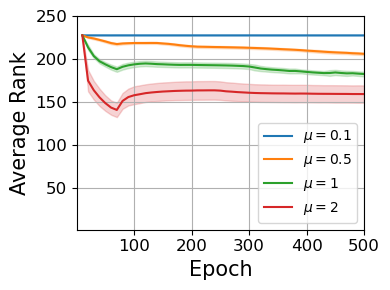

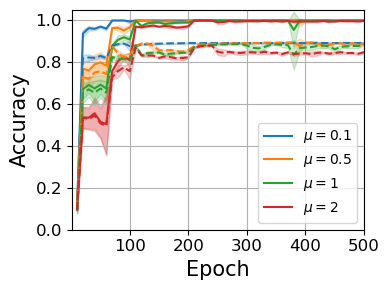

In [180]:
param_plot(
        plot_name='',
        net='resnet',
        dataset_name='CIFAR10',
        loss='CE', 
        #lr=0.5,
        weight_decay=5e-4,
        batch_size=16,
        activation='leaky_relu',
        
        plt_err=True,
        tol=0.001,
        rank_max=250)

## Grid (Lambda and Mu, Leaky ReLU)

xids: ['7582', '7584', '7586', '7588']


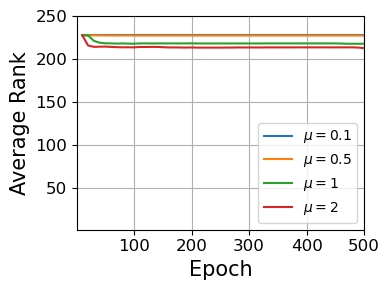

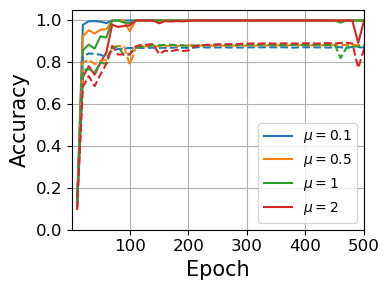

In [9]:
param_plot(
        plot_name='',
        net='resnet',
        dataset_name='CIFAR10',
        loss='CE', 
        #lr=0.5,
        weight_decay=1e-4,
        batch_size=16,
        activation='leaky_relu',
        
        tol=0.001,
        rank_max=250)

xids: ['7583', '7585', '7587', '7589']


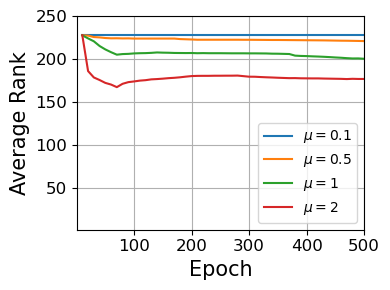

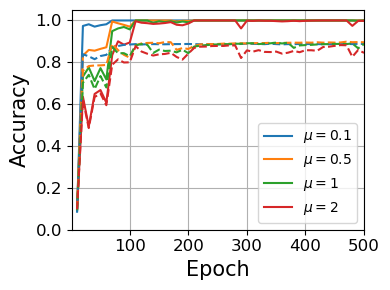

In [10]:
param_plot(
        plot_name='',
        net='resnet',
        dataset_name='CIFAR10',
        loss='CE', 
        #lr=0.5,
        weight_decay=3e-4,
        batch_size=16,
        activation='leaky_relu',
        
        tol=0.001,
        rank_max=250)

xids: ['7494', '7495', '7496', '7497']


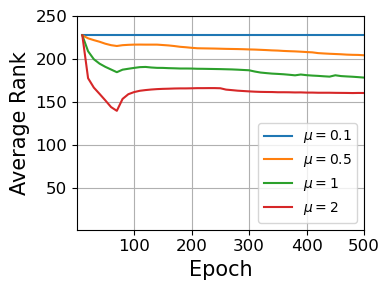

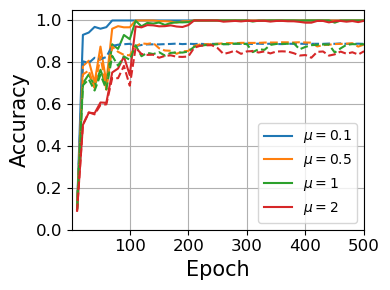

In [11]:
param_plot(
        plot_name='',
        net='resnet',
        dataset_name='CIFAR10',
        loss='CE', 
        #lr=0.5,
        weight_decay=5e-4,
        batch_size=16,
        activation='leaky_relu',
        
        trial=0,
        tol=0.001,
        rank_max=250)

xids: ['7590', '7593', '7596', '7599']


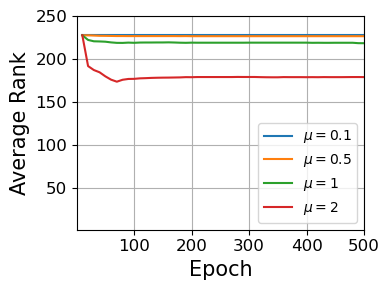

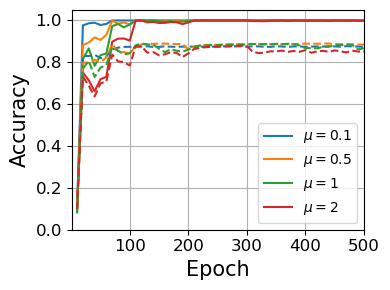

In [12]:
param_plot(
        plot_name='',
        net='resnet',
        dataset_name='CIFAR10',
        loss='CE', 
        #lr=0.5,
        weight_decay=1e-4,
        batch_size=8,
        activation='leaky_relu',
        
        tol=0.001,
        rank_max=250)

xids: ['7591', '7594', '7597', '7600']


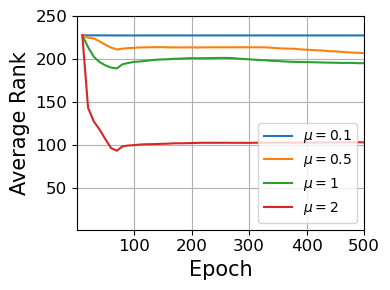

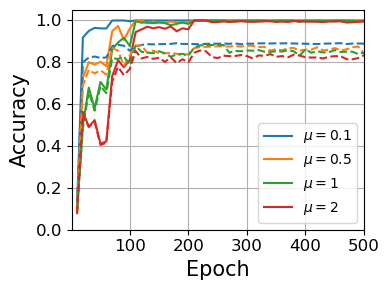

In [13]:
param_plot(
        plot_name='',
        net='resnet',
        dataset_name='CIFAR10',
        loss='CE', 
        #lr=0.5,
        weight_decay=3e-4,
        batch_size=8,
        activation='leaky_relu',
        
        tol=0.001,
        rank_max=250)

xids: ['7490', '7491', '7492', '7493']


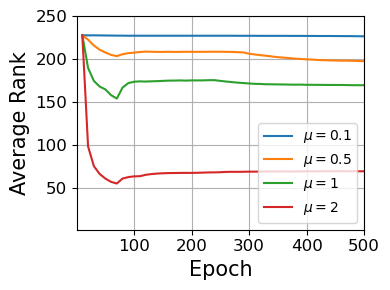

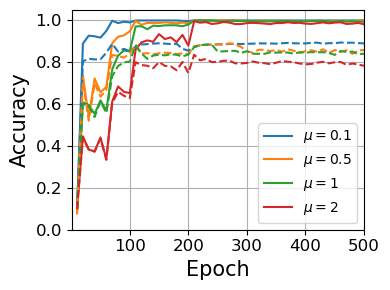

In [14]:
param_plot(
        plot_name='',
        net='resnet',
        dataset_name='CIFAR10',
        loss='CE', 
        #lr=0.5,
        weight_decay=5e-4,
        batch_size=8,
        activation='leaky_relu',
        
        trial=0,
        tol=0.001,
        rank_max=250)

## Contour Plots (Lambda and Mu, Leaky ReLU)

xids: ['7494', '7495', '7496', '7497', '7582', '7583', '7584', '7585', '7586', '7587', '7588', '7589']
parameter_name_1 \mu (12)
[0.1, 0.5, 1.0, 2.0, 0.1, 0.1, 0.5, 0.5, 1.0, 1.0, 2.0, 2.0]
parameter_name_2 \lambda (12)
[0.0005, 0.0005, 0.0005, 0.0005, 0.0001, 0.0003, 0.0001, 0.0003, 0.0001, 0.0003, 0.0001, 0.0003]
final ranks (12)
[227.47058823529412, 204.23529411764707, 178.23529411764707, 160.2941176470588, 227.47058823529412, 227.47058823529412, 227.23529411764707, 220.76470588235293, 217.64705882352942, 200.1764705882353, 212.52941176470588, 176.64705882352942]


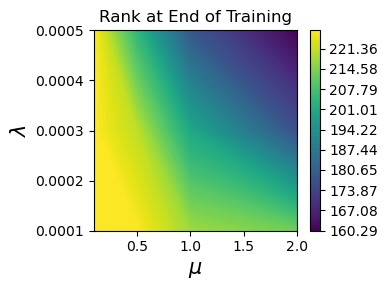

In [45]:
param_plot(
        plot_name='',
        net='resnet',
        dataset_name='CIFAR10',
        loss='CE', 
        # lr=0.5,
        # weight_decay=5e-4,
        batch_size=16,
        activation='leaky_relu',
        
        trial=0,
        contour=True,
        tol=0.001,
        rank_max=250)

xids: ['7490', '7491', '7492', '7493', '7590', '7591', '7593', '7594', '7596', '7597', '7599', '7600']
parameter_name_1 \mu (12)
[0.1, 0.5, 1.0, 2.0, 0.1, 0.1, 0.5, 0.5, 1.0, 1.0, 2.0, 2.0]
parameter_name_2 \lambda (12)
[0.0005, 0.0005, 0.0005, 0.0005, 0.0001, 0.0003, 0.0001, 0.0003, 0.0001, 0.0003, 0.0001, 0.0003]
final ranks (12)
[226.35294117647058, 197.41176470588235, 169.35294117647058, 69.05882352941177, 227.47058823529412, 227.35294117647058, 226.47058823529412, 206.88235294117646, 218.2941176470588, 195.05882352941177, 178.8235294117647, 102.76470588235294]


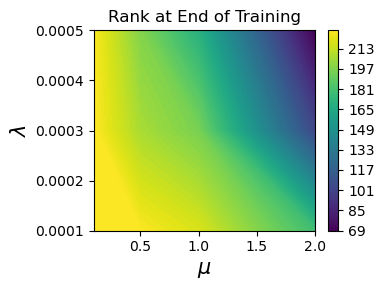

In [46]:
param_plot(
        plot_name='',
        net='resnet',
        dataset_name='CIFAR10',
        loss='CE', 
        # lr=0.5,
        # weight_decay=5e-4,
        batch_size=8,
        activation='leaky_relu',
        
        trial=0,
        contour=True,
        tol=0.001,
        rank_max=250)

xids: ['3266', '3267', '3268', '3269', '3270', '3271', '3296', '3297', '3298', '3299', '3300', '3301', '3326', '3327', '3328', '3329', '3330', '3331', '3356', '3357', '3358', '3359', '3360', '3361', '3386', '3387', '3388', '3389', '3390', '3391', '3416', '3417', '3418', '3419', '3420', '3421']
parameter_name_1 \lambda (36)
[0.0, 0.0001, 0.0002, 0.0004, 0.0008, 0.006, 0.0, 0.0001, 0.0002, 0.0004, 0.0008, 0.006, 0.0, 0.0001, 0.0002, 0.0004, 0.0008, 0.006, 0.0, 0.0001, 0.0002, 0.0004, 0.0008, 0.006, 0.0, 0.0001, 0.0002, 0.0004, 0.0008, 0.006, 0.0, 0.0001, 0.0002, 0.0004, 0.0008, 0.006]
parameter_name_2 B (36)
[4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 128.0, 128.0, 128.0, 128.0, 128.0, 128.0]
final ranks (36)
[227.47058823529412, 212.47058823529412, 201.2941176470588, 170.8235294117647, 93.41176470588235, 0.0, 227.47058823529412, 222.8235294117647, 217.0, 192.47058

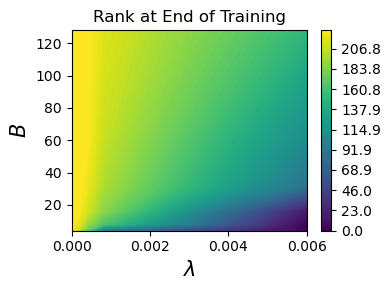

In [47]:
param_plot(
        plot_name='',
        net='resnet',
        dataset_name='CIFAR10',
        loss='CE', 
        lr=0.5,
        # weight_decay=5e-4,
        # batch_size=8,
        activation='relu',
        width=500,
    
        contour=True,
        tol=0.001,
        rank_max=250)

xids: ['3253', '3259', '3265', '3271', '3283', '3301', '3307', '3313', '3319', '3325', '3331', '3337', '3343', '3349', '3355', '3361', '3367', '3373', '3379', '3385', '3391', '3397', '3403', '3409', '3415', '3421', '3798', '3801', '3804', '3807', '3810', '3813']
parameter_name_1 \mu (32)
[0.001, 0.01, 0.1, 0.5, 0.001, 0.5, 1.0, 0.001, 0.01, 0.1, 0.5, 1.0, 0.001, 0.01, 0.1, 0.5, 1.0, 0.001, 0.01, 0.1, 0.5, 1.0, 0.001, 0.01, 0.1, 0.5, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005]
parameter_name_2 B (32)
[4.0, 4.0, 4.0, 4.0, 8.0, 8.0, 8.0, 16.0, 16.0, 16.0, 16.0, 16.0, 32.0, 32.0, 32.0, 32.0, 32.0, 64.0, 64.0, 64.0, 64.0, 64.0, 128.0, 128.0, 128.0, 128.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0]
final ranks (32)
[227.47058823529412, 186.7058823529412, 58.94117647058823, 0.0, 227.47058823529412, 0.0, 0.0, 227.47058823529412, 206.8235294117647, 153.41176470588235, 14.235294117647058, 0.0, 227.47058823529412, 212.11764705882354, 165.94117647058823, 86.23529411764706, 0.0, 227.47058823529412, 227.47058

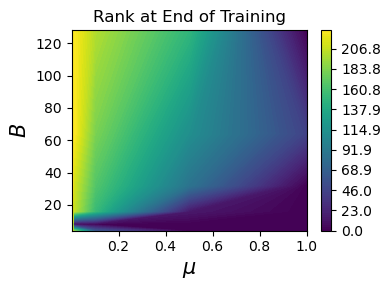

In [48]:
param_plot(
        plot_name='',
        net='resnet',
        dataset_name='CIFAR10',
        loss='CE', 
        # lr=0.5,
        weight_decay=6e-3,
        # batch_size=8,
        activation='relu',
        width=500,
    
        contour=True,
        tol=0.001,
        rank_max=250)

# Ratio Experiments (4/21/23)

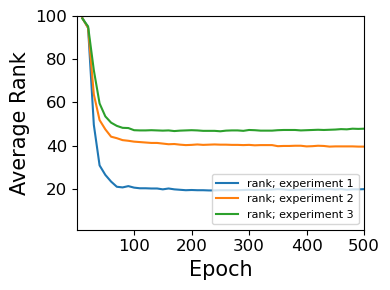

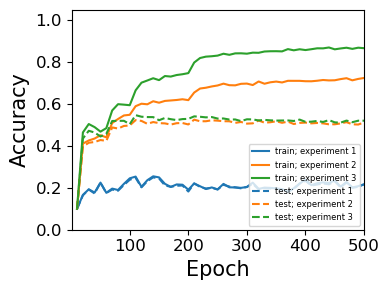

In [18]:
# net=mlp, bs=4, lr=0.1, wd=2.5e-4 (7450)
# net=mlp, bs=8, lr=0.1, wd=5e-4 (7379)
# net=mlp, bs=16, lr=0.1, wd=10e-4 (7451)

plot_all('ratio_1', 'experiment', ['1','2','3'], ['7450','7379','7451'], 0, './sweep_figs', 'pdf', tol=0.001, stable_rank=False, rank_max=100, plot_singvals=False)

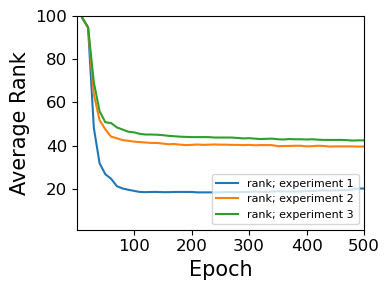

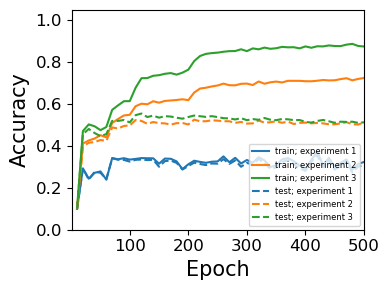

In [19]:
# net=mlp, bs=4, lr=0.05, wd=5e-4 (7455)
# net=mlp, bs=8, lr=0.1, wd=5e-4 (7379)
# net=mlp, bs=16, lr=0.2, wd=5e-4 (7456)

plot_all('ratio_2', 'experiment', ['1','2','3'], ['7455','7379','7456'], 0, './sweep_figs', 'pdf', tol=0.001, stable_rank=False, rank_max=100, plot_singvals=False)

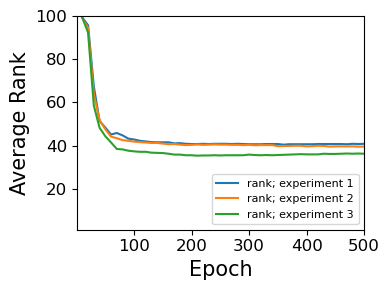

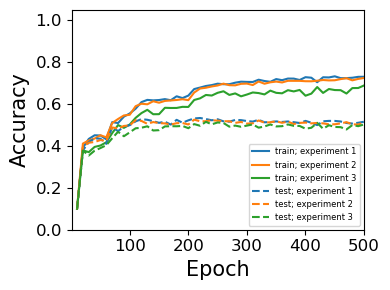

In [20]:
# net=mlp, bs=8, lr=0.05, wd=10e-4 (7453)
# net=mlp, bs=8, lr=0.1, wd=5e-4 (7379)
# net=mlp, bs=8, lr=0.2, wd=2.5e-4 (7454)

plot_all('ratio_3', 'experiment', ['1','2','3'], ['7453','7379','7454'], 0, './sweep_figs', 'pdf', tol=0.001, stable_rank=False, rank_max=100, plot_singvals=False)

# Dropout Experiments (3/16/23)

xids: ['7412', '7413', '7414', '7415', '7416', '7417', '7418']


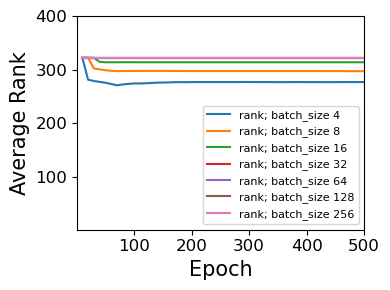

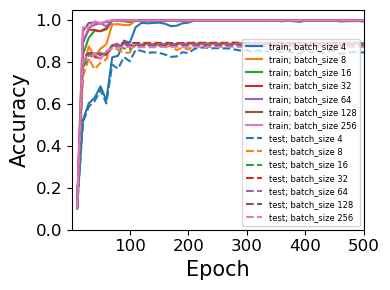

In [12]:
param_plot(
        plot_name='vgg_dropout',
        net='vgg_dropout',
        loss='CE', 
        lr=0.01,
        weight_decay=5e-4,
        depth=10,
        width=100,
        
        tol=0.001,
        rank_max=400)

# SVHN/MNIST Experiments (3/15/23)

xids: ['7481', '7482', '7483', '7484']


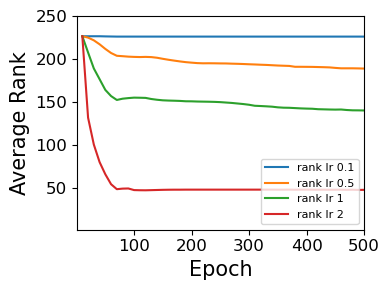

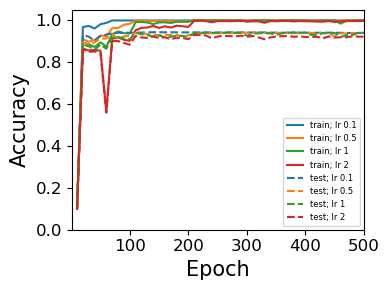

In [9]:
param_plot(
        plot_name='fashion_mnist',
        net='resnet',
        dataset_name='FashionMNIST',
        loss='CE', 
        #lr=0.5,
        weight_decay=5e-4,
        batch_size=16,
        depth=10,
        width=100,
        
        tol=0.001,
        rank_max=250)

xids: ['7420', '7421', '7422', '7423']


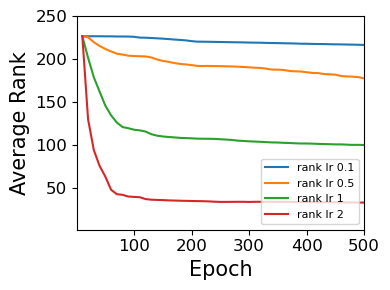

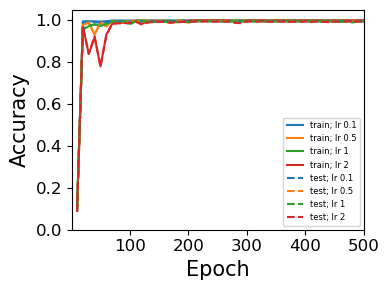

In [7]:
param_plot(
        plot_name='mnist',
        net='resnet',
        dataset_name='MNIST',
        loss='CE', 
        #lr=0.5,
        weight_decay=5e-4,
        batch_size=16,
        depth=10,
        width=100,
        
        tol=0.001,
        rank_max=250)

xids: ['7393', '7403', '7395', '7396']


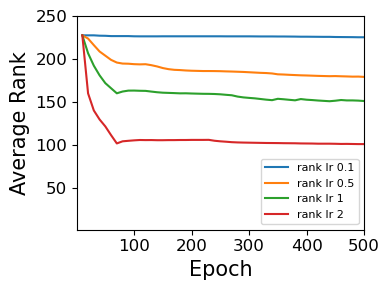

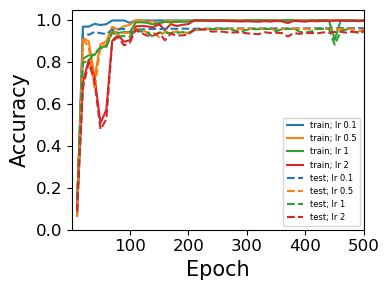

In [8]:
param_plot(
        plot_name='svhn',
        net='resnet',
        dataset_name='SVHN',
        loss='CE', 
        #lr=0.5,
        weight_decay=5e-4,
        batch_size=16,
        depth=10,
        width=100,
        
        tol=0.001,
        rank_max=250)

# Norm Convergance Experiments (3/14/23)

bs: 4
xids: ['7463']
xid: 7463


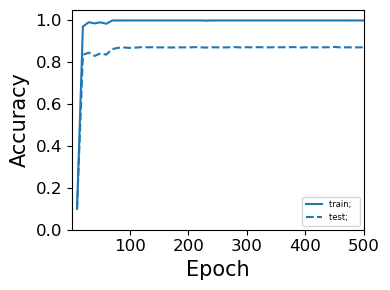

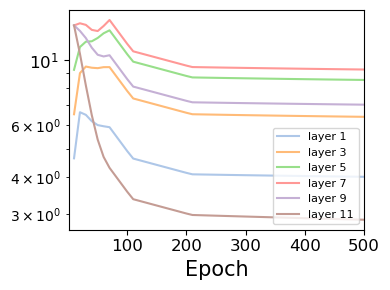

bs: 8
xids: ['7464']
xid: 7464


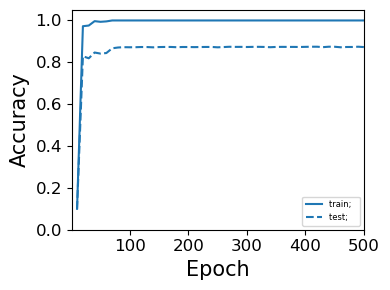

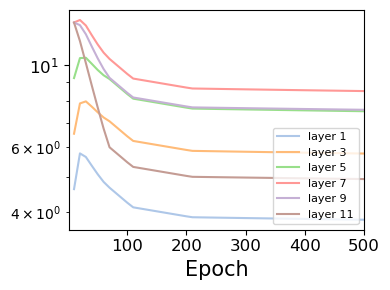

bs: 16
xids: ['7465']
xid: 7465


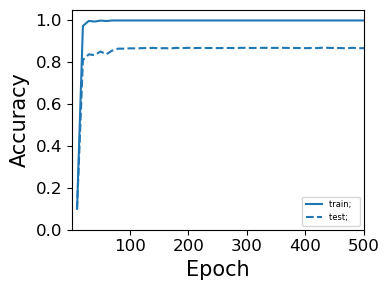

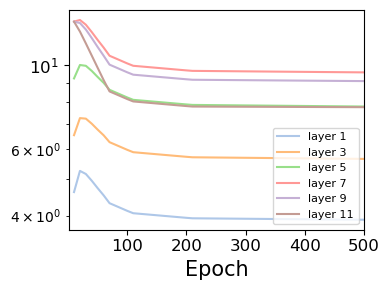

bs: 32
xids: ['7466']
xid: 7466


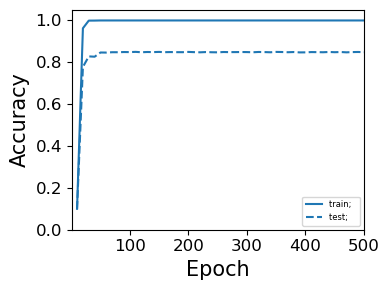

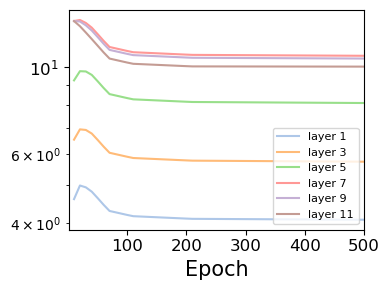

bs: 64
xids: ['7467']
xid: 7467


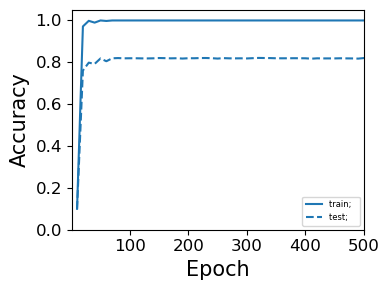

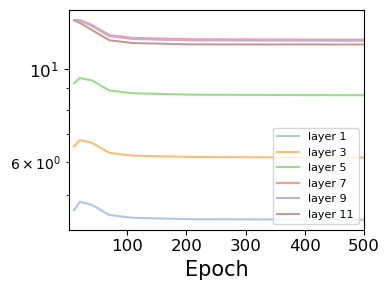

bs: 128
xids: ['7468']
xid: 7468


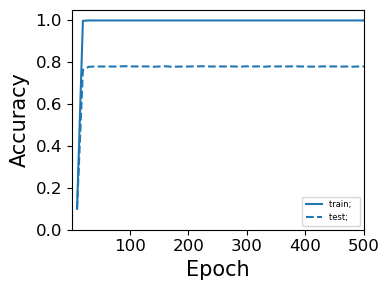

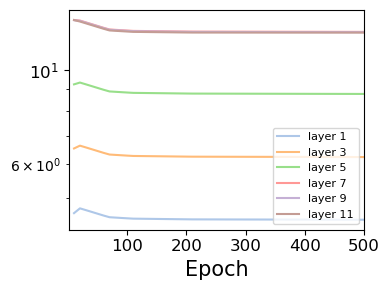

In [18]:
# vgg, bs=8, lr=5e-4 (figure 6b)
for bs in [4,8,16,32,64,128]:
    print("bs:", bs)
    param_plot(
        plot_name='vgg_norm_conv_'+str(bs),
        net='vgg',
        loss='CE', 
        lr=5e-3,
        weight_decay=5e-4,
        batch_size=bs,

        norm=True,
        tol=0.001,
        rank_max=125)

lr: 0.01
xids: ['7475']
xid: 7475


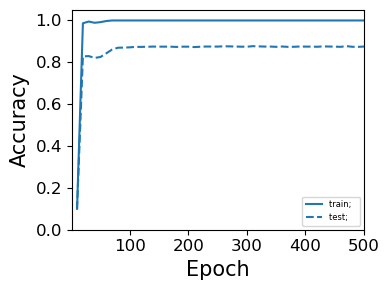

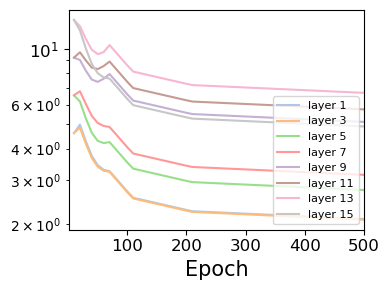

lr: 0.1
xids: ['7476']
xid: 7476


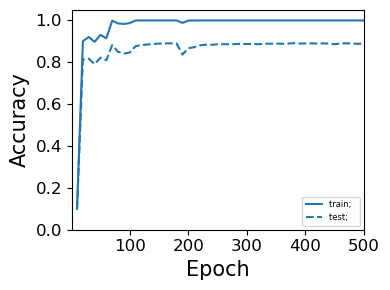

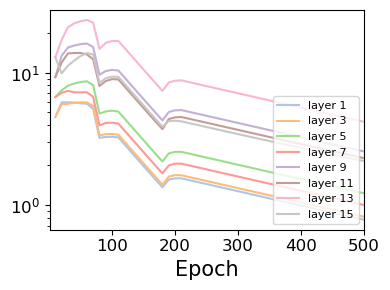

lr: 0.5
xids: ['7477']
xid: 7477


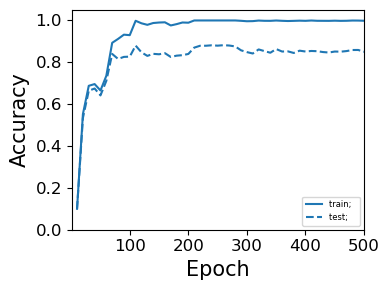

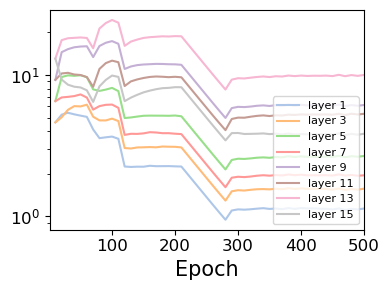

lr: 1.0
xids: ['7478']
xid: 7478


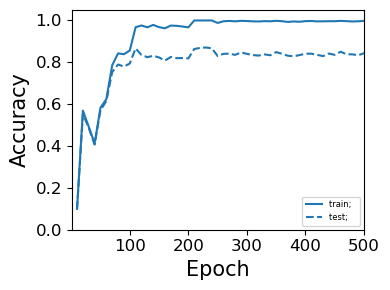

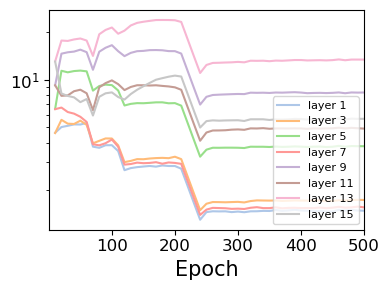

lr: 2.0
xids: ['7479']
xid: 7479


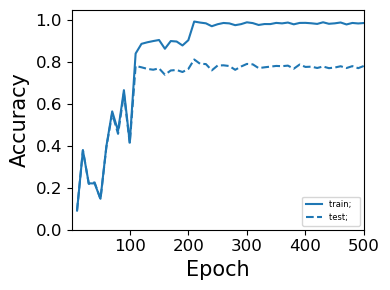

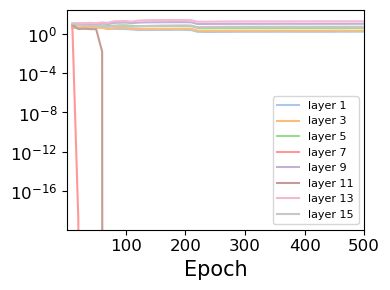

In [17]:
# resnet, bs=8, wd=5e-4 (figure 1b)
# XID: 7433

for lr in [0.01,0.1,0.5,1.0,2.0]:
    print("lr:", lr)
    param_plot(
        plot_name='resnet_norm_conv_'+str(lr),
        net='resnet',
        loss='CE', 
        lr=lr,
        weight_decay=5e-4,
        batch_size=8,

        norm=True,
        tol=0.001,
        rank_max=125)

batch_size: 4
xids: ['7378']
early_stop xid 7378
batch_size: 8
xids: ['7379']
xid: 7379


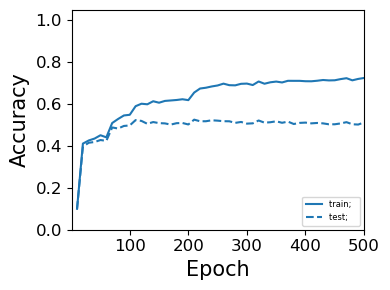

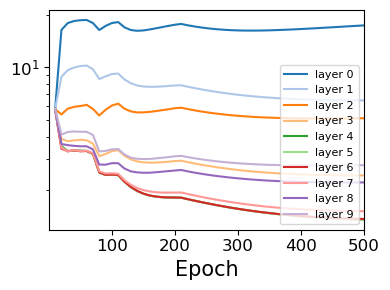

batch_size: 16
xids: ['7380']
xid: 7380


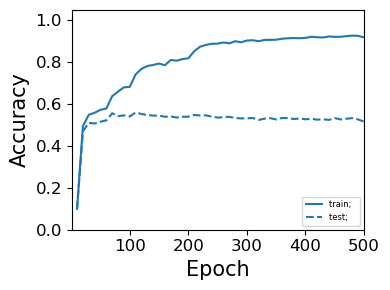

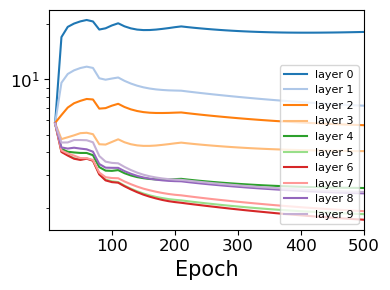

batch_size: 32
xids: ['7381']
xid: 7381


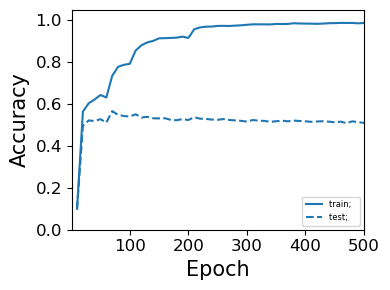

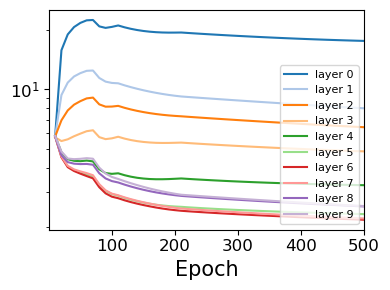

batch_size: 64
xids: ['7382']
xid: 7382


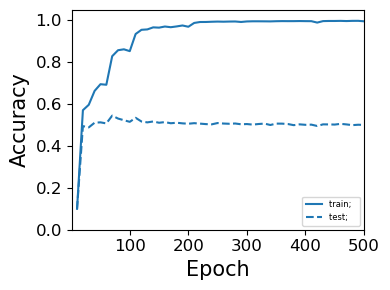

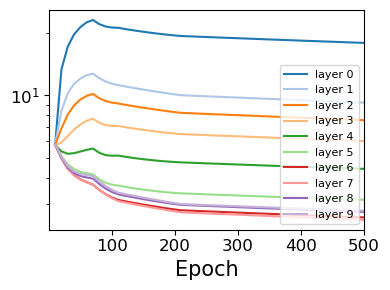

batch_size: 128
xids: ['7383']
xid: 7383


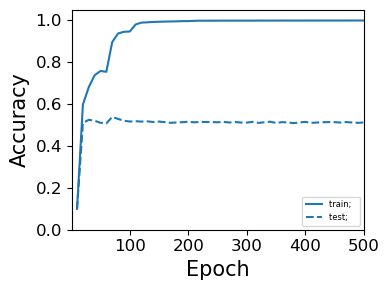

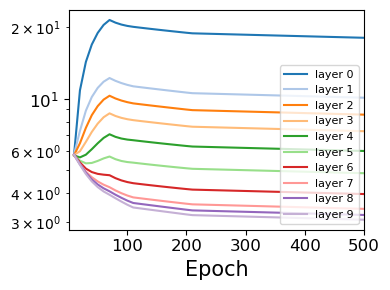

In [15]:
# lr=0.1, wd=5e-4 (figure 3b)
for bs in [4,8,16,32,64,128]:
    print("batch_size:", bs)
    param_plot(
            plot_name='mlp_norm_conv_'+str(bs),
            net='mlp',
            loss='CE', 
            lr=0.1,
            weight_decay=5e-4,
            batch_size=bs,
            depth=10,
            width=100,

            norm=True,
            tol=0.001,
            rank_max=125)

# Wide Experiments (3/13/23)

[1.e+00 1.e+01 1.e+02 1.e+03 1.e+04 1.e+05]
[4515, 2599, 1338, 100.0, 1000.0, 10000.0]


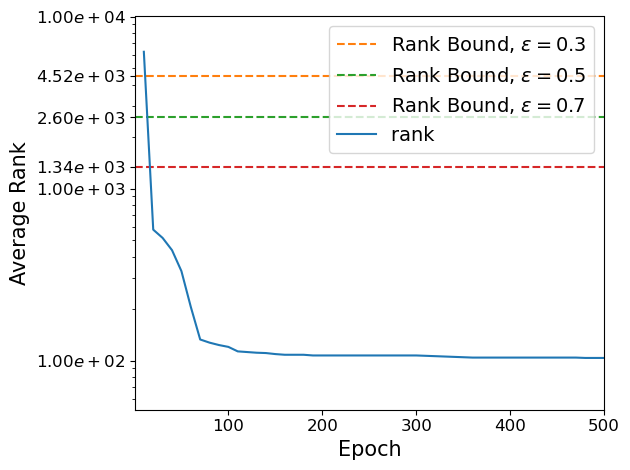

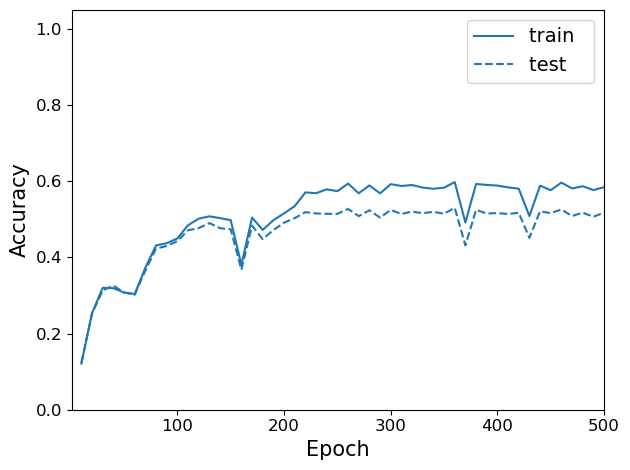

In [7]:
# lr=0.1, wd=8e-3, bs=6
plot_all('wide_01', '', [''], ['7373'], 0, './sweep_figs', 'pdf', tol=0.001, stable_rank=False, rank_max=10000, plot_singvals=False, 
         rank_bound=[4515,2599,1338], rank_bound_label=[0.3,0.5,0.7], legend_loc='upper right')

[1.e-01 1.e+00 1.e+01 1.e+02 1.e+03 1.e+04 1.e+05]
[4515, 2599, 1338, 10.0, 100.0, 1000.0, 10000.0]


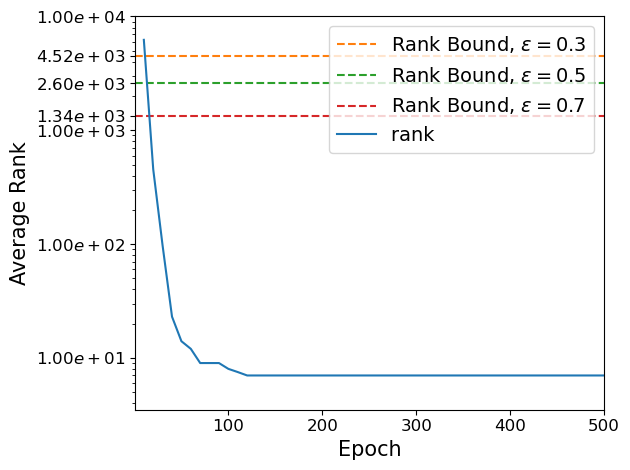

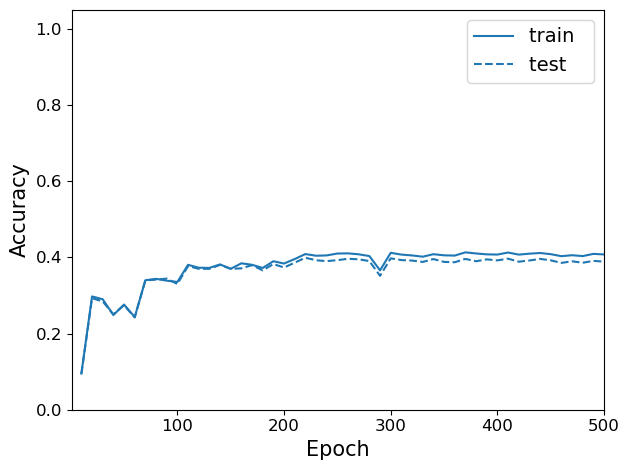

In [8]:
# lr=0.1, wd=8e-3, bs=4
plot_all('wide_02', '', [''], ['7372'], 0, './sweep_figs', 'pdf', tol=0.001, stable_rank=False, rank_max=10000, plot_singvals=False, 
         rank_bound=[4515,2599,1338], rank_bound_label=[0.3,0.5,0.7], legend_loc='upper right')

[1.e+01 1.e+02 1.e+03 1.e+04 1.e+05]
[4515, 2599, 1338, 1000.0, 10000.0]


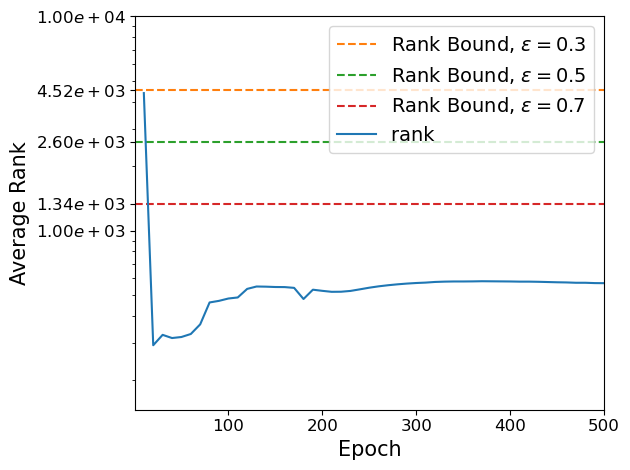

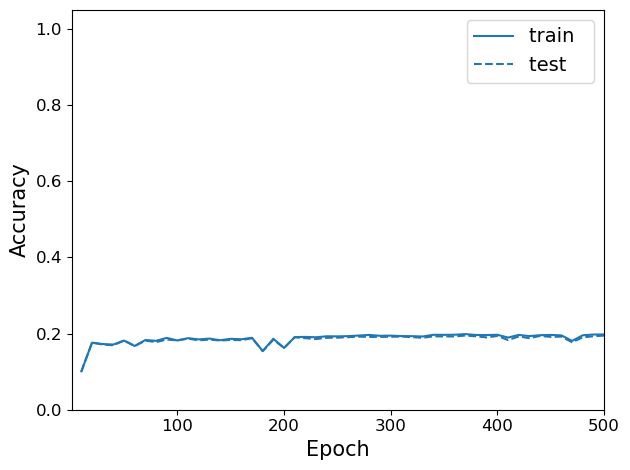

In [9]:
# lr=0.01, wd=8e-2, bs=6
plot_all('wide_03', '', [''], ['7361'], 0, './sweep_figs', 'pdf', tol=0.001, stable_rank=False, rank_max=10000, plot_singvals=False, 
         rank_bound=[4515,2599,1338], rank_bound_label=[0.3,0.5,0.7], legend_loc='upper right')

width: 10000
xids: ['7371', '7372', '7373']
Failed to plot experiment: 7371


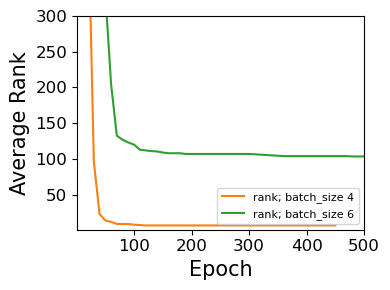

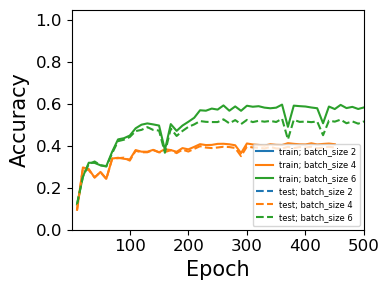

In [27]:
for width in [10000]:
    print("width:", width)
    param_plot(
        plot_name='width',
        net='mlp',
        loss='CE', 
        lr=0.1,
        weight_decay=8e-3,
        #batch_size=batch_size,
        depth=2,
        width=width,

        tol=0.001,
        rank_max=300)

width: 6000
xids: ['7359', '7360', '7361']


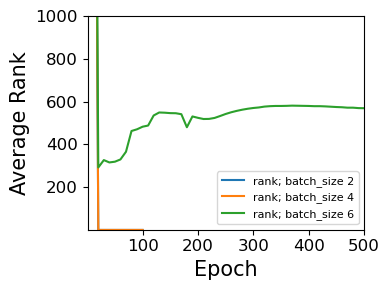

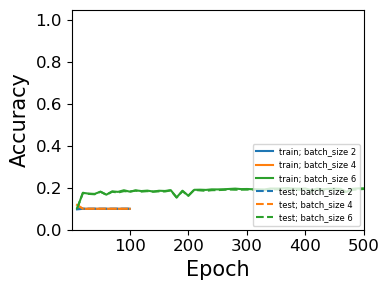

width: 10000
xids: ['7368', '7369', '7370']


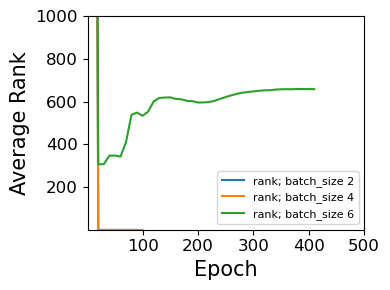

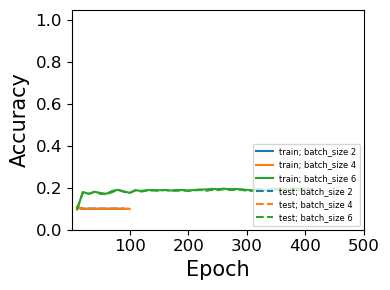

In [29]:
for width in [6000, 10000]:
    print("width:", width)
    param_plot(
        plot_name='wide',
        net='mlp',
        loss='CE', 
        lr=0.01,
        weight_decay=8e-2,
        #batch_size=batch_size,
        depth=2,
        width=width,

        tol=0.001,
        rank_max=1000)

# Experiments

## Rank Bound BC
Analyzes both bounds B and C.

bound_batch_size: 4
xid: 6916


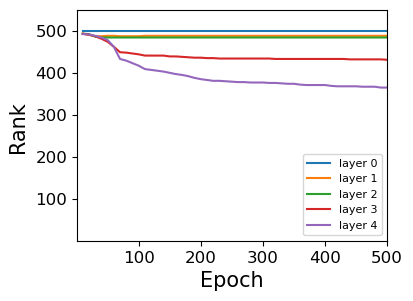

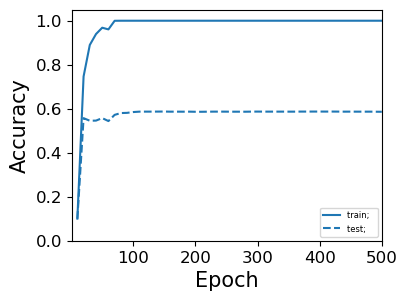

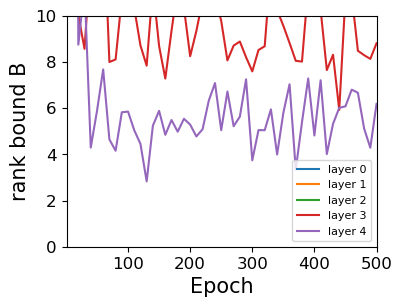

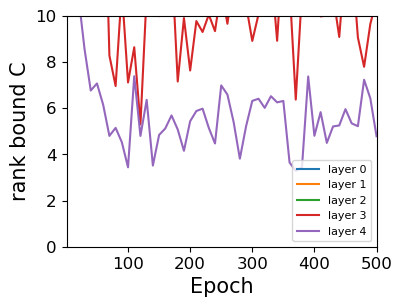


bound_batch_size: 8
xid: 6917


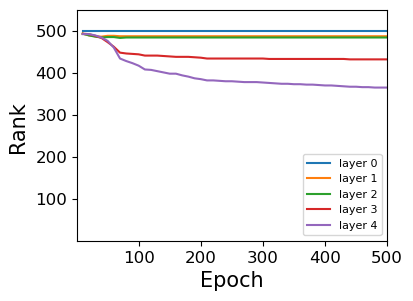

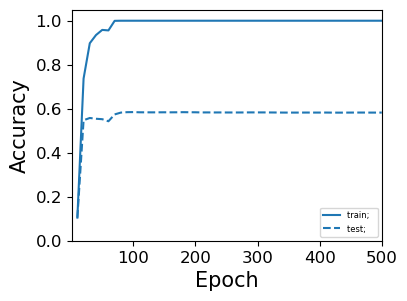

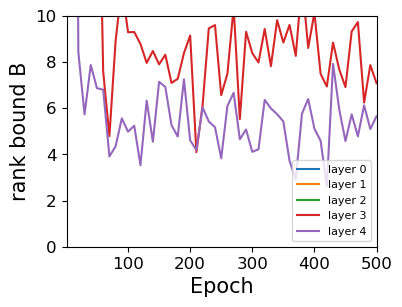

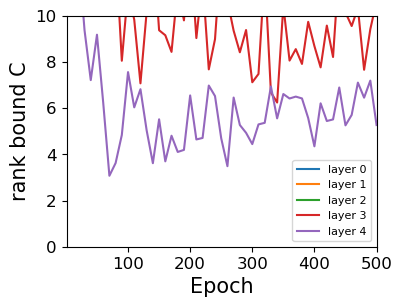


bound_batch_size: 16
xid: 6918


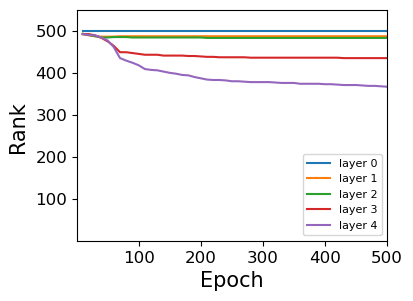

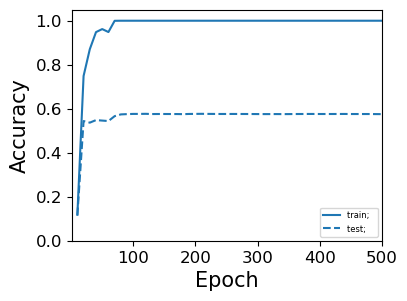

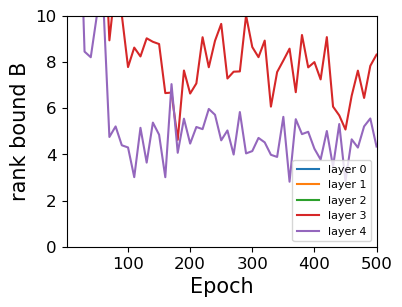

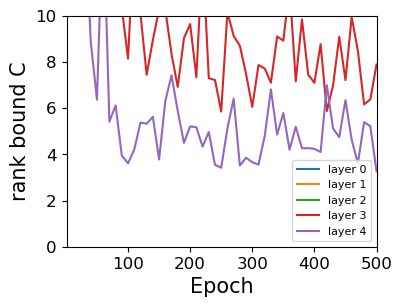


bound_batch_size: 32
xid: 6919


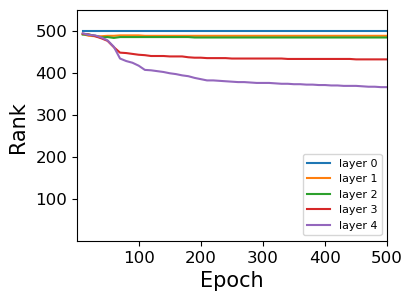

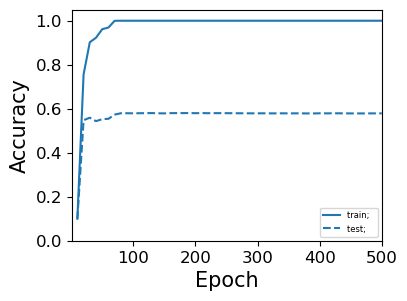

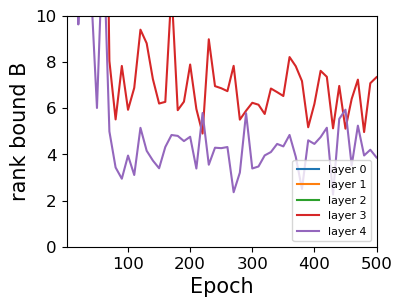

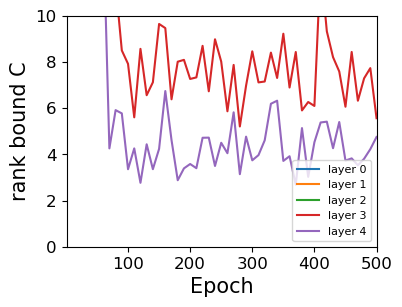


bound_batch_size: 64
xid: 6920


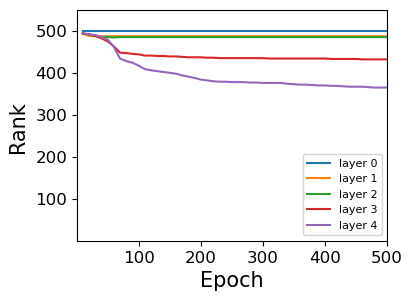

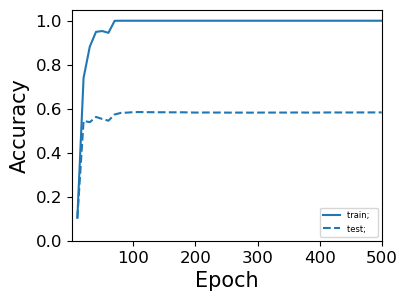

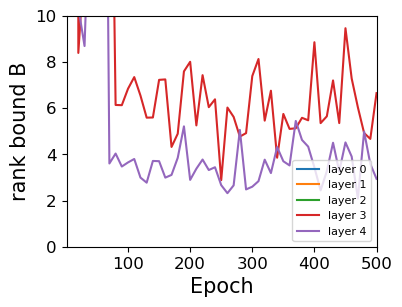

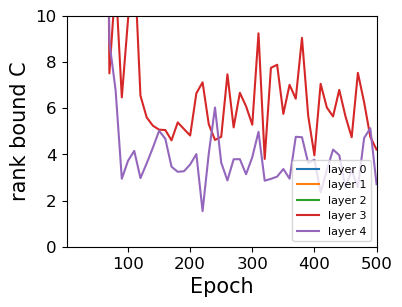


bound_batch_size: 128
xid: 6744


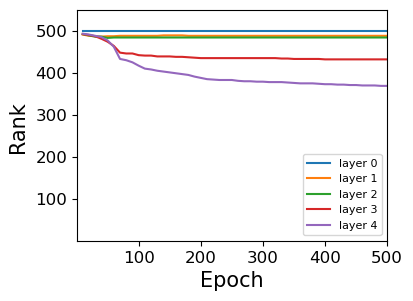

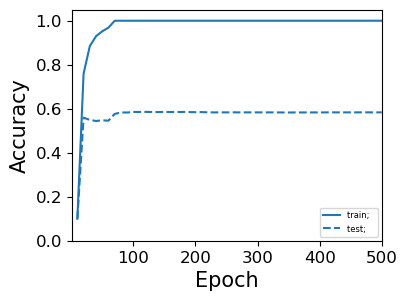

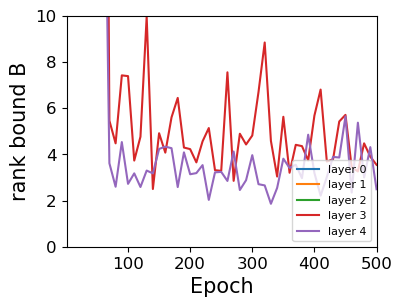

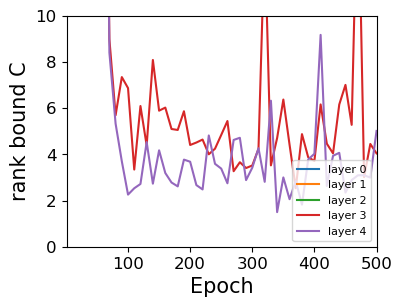


bound_batch_size: 256
xid: 7132


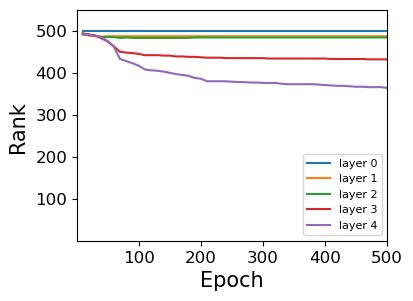

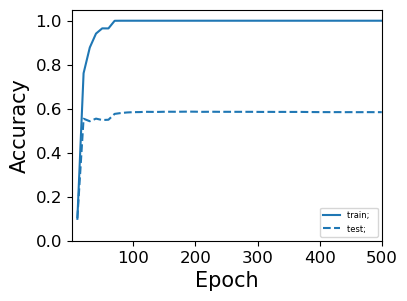

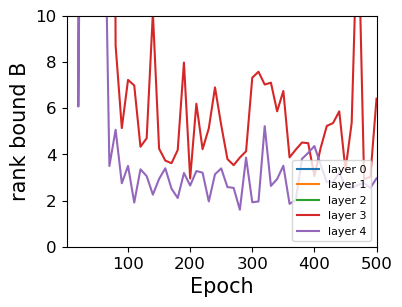

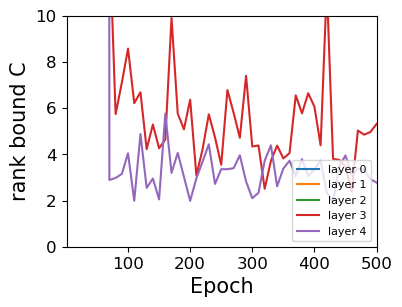

In [7]:
# Bound BC0, depth=5, width=500, weight decay on all layers
for bbs in [4,8,16,32,64,128,256]:
    print("bound_batch_size:", bbs)
    param_plot(
        net='mlp_wn',
        loss='CE', 
        batch_size=4,
        weight_decay=0.0002,
        lr=0.01,
        depth=5,

        rank_bound_version='BC0',
        bound_batch_size=bbs,

        rank_bound=True,
        tol=0.001,
        rank_max=550,
        plot_types=['rank_bound_B','rank_bound_C'])
    print()

wd: 0.0002
lr: 0.01
bs: 4
xid: 7132


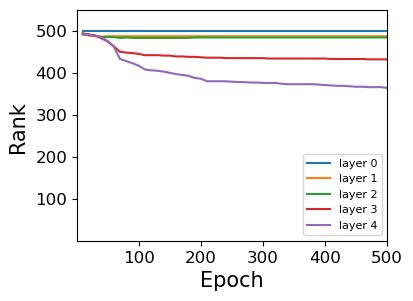

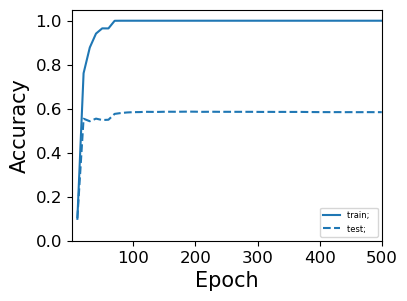

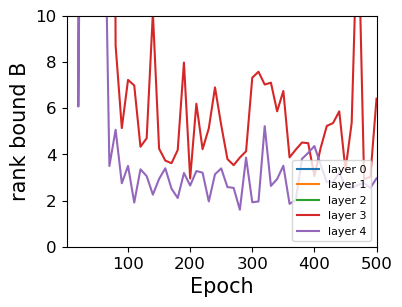

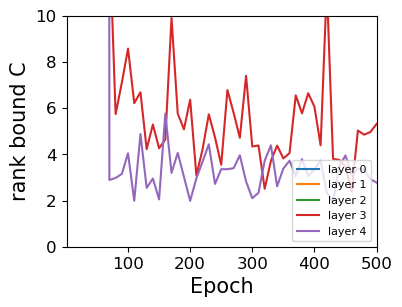


wd: 0.0002
lr: 0.01
bs: 8
xid: 7141


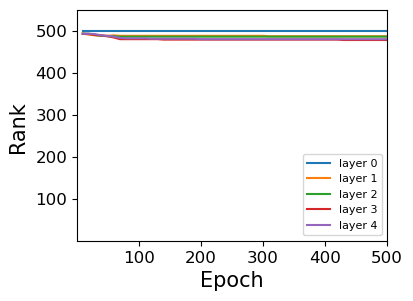

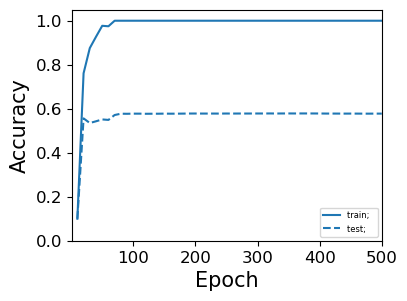

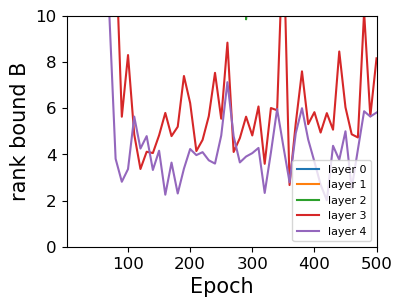

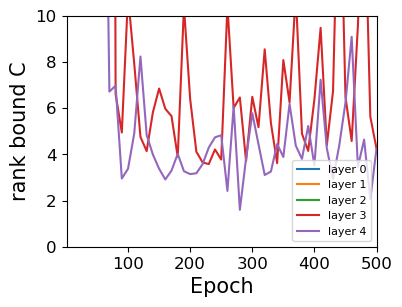


wd: 0.0002
lr: 0.01
bs: 16
xid: 7150


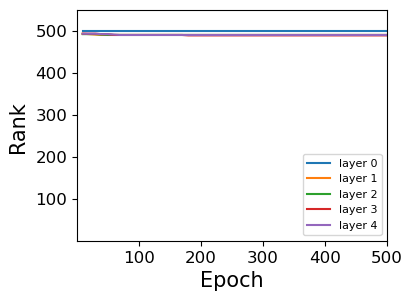

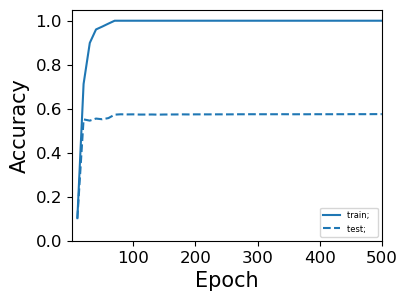

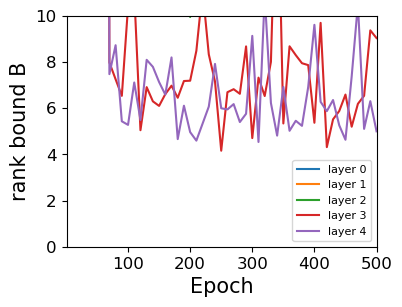

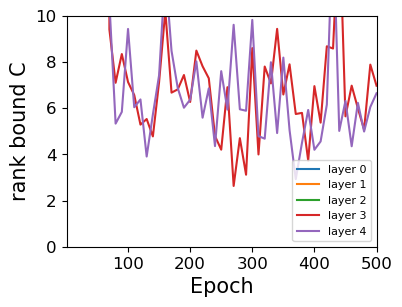


wd: 0.0002
lr: 0.01
bs: 32
xid: 7159


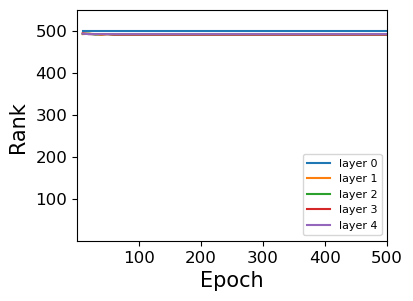

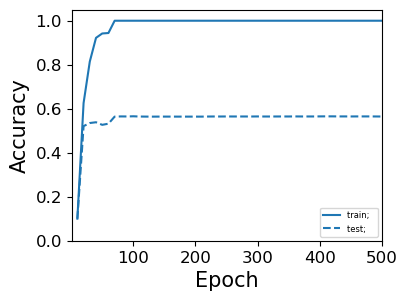

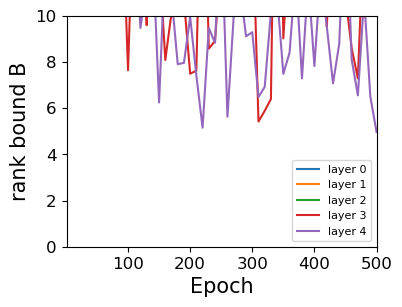

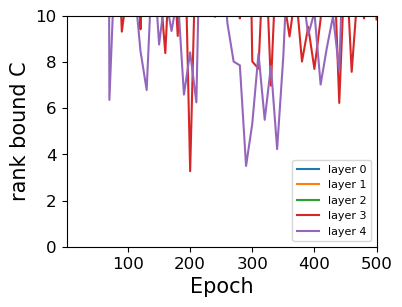


wd: 0.0002
lr: 0.1
bs: 4
xid: 7135


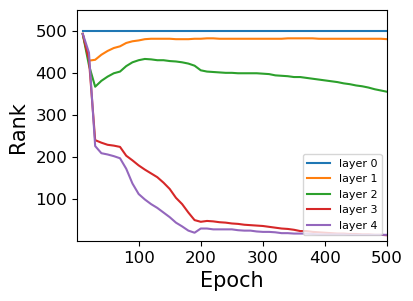

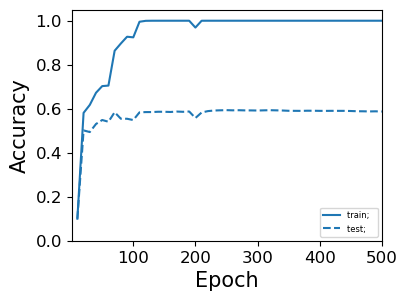

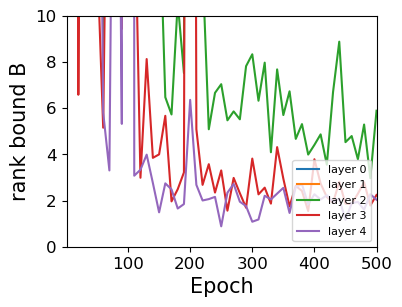

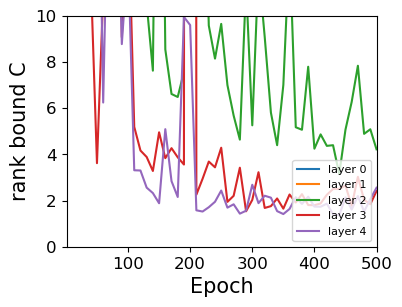


wd: 0.0002
lr: 0.1
bs: 8
xid: 7144


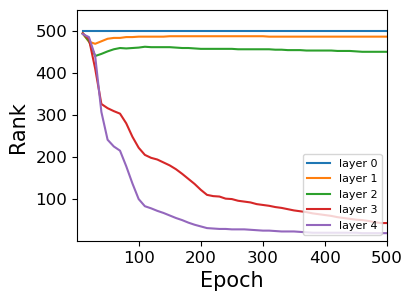

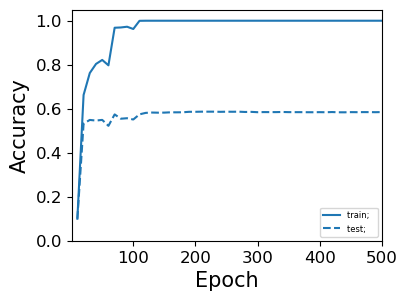

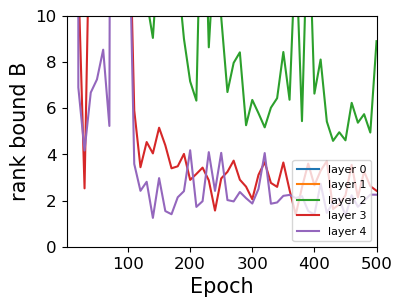

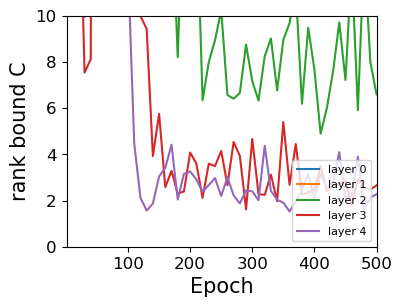


wd: 0.0002
lr: 0.1
bs: 16
xid: 7153


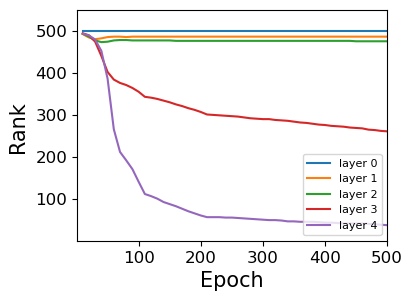

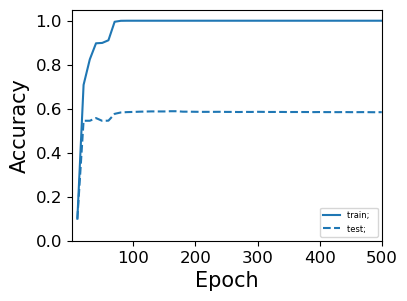

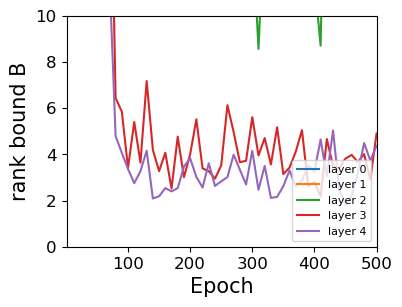

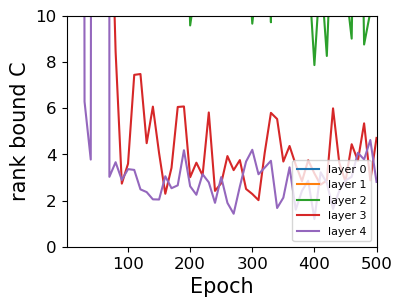


wd: 0.0002
lr: 0.1
bs: 32
xid: 7162


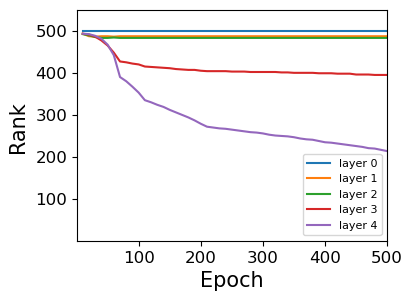

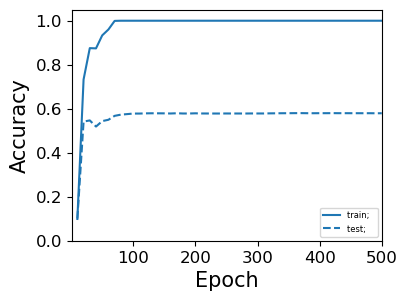

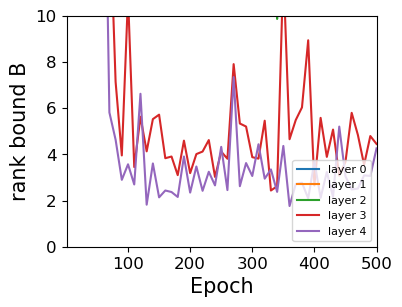

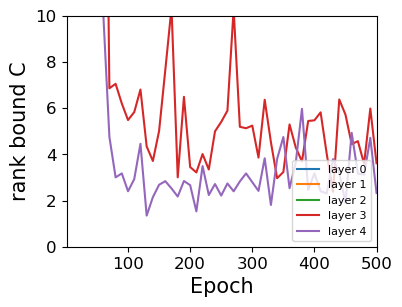


wd: 0.0002
lr: 0.5
bs: 4
early_stop xid 7138

wd: 0.0002
lr: 0.5
bs: 8
xid: 7147


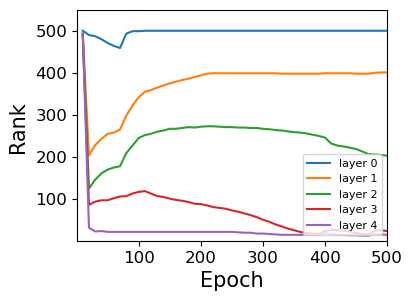

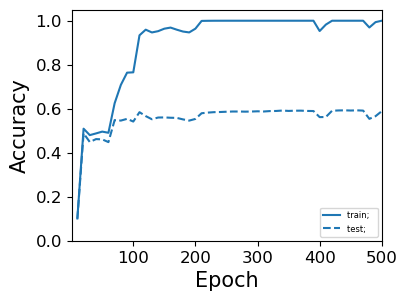

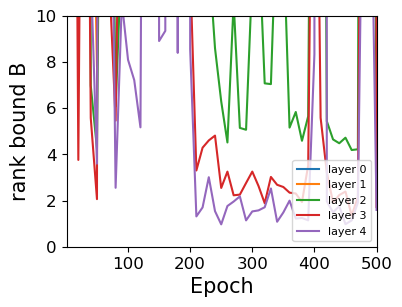

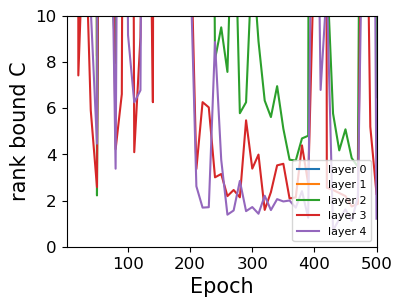


wd: 0.0002
lr: 0.5
bs: 16
xid: 7156


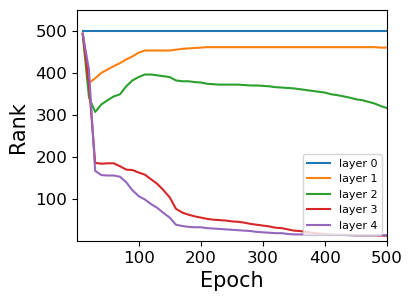

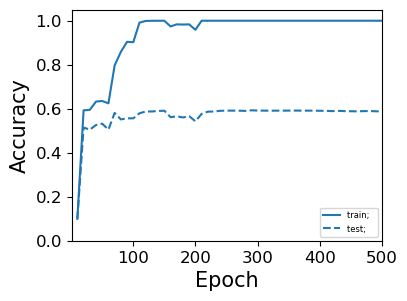

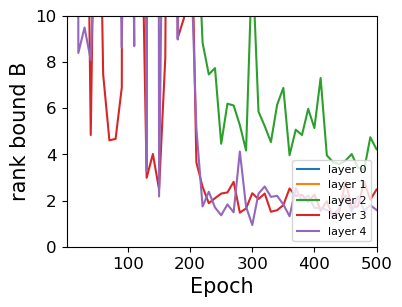

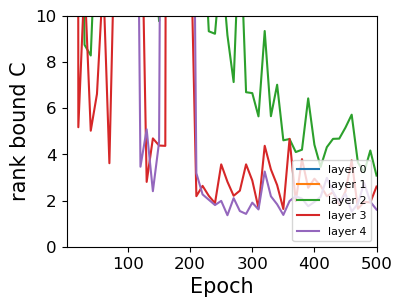


wd: 0.0002
lr: 0.5
bs: 32
xid: 7165


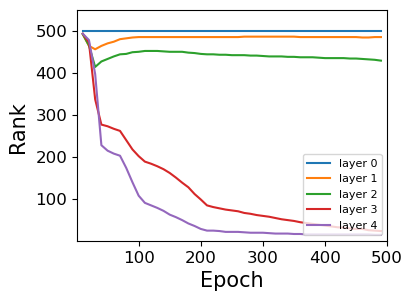

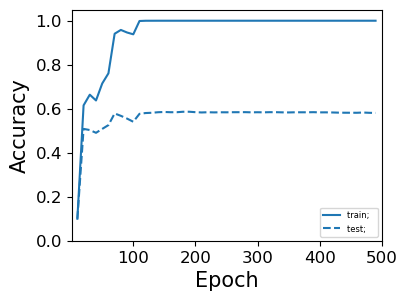

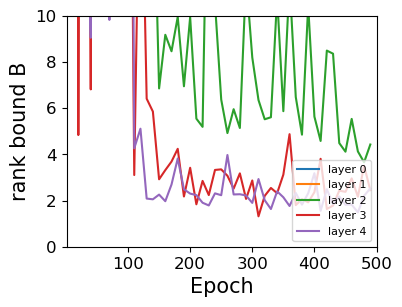

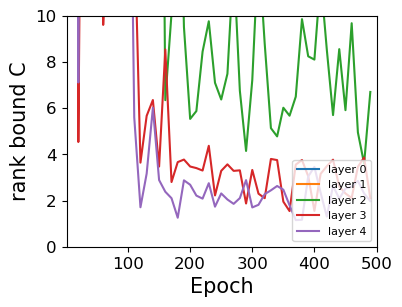


wd: 0.0004
lr: 0.01
bs: 4
xid: 7133


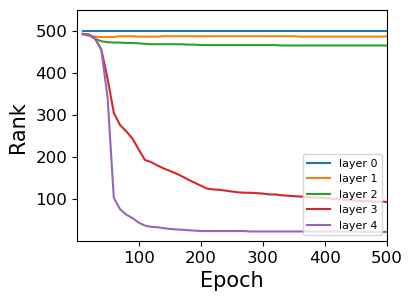

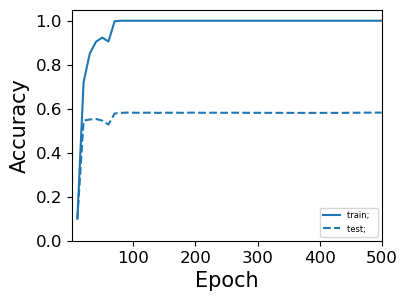

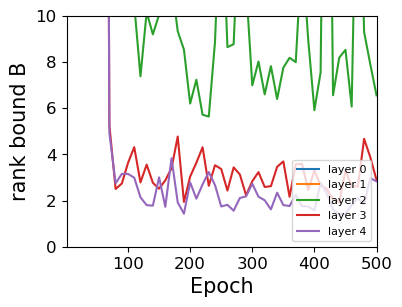

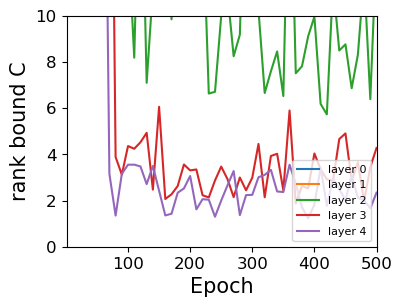


wd: 0.0004
lr: 0.01
bs: 8
xid: 7142


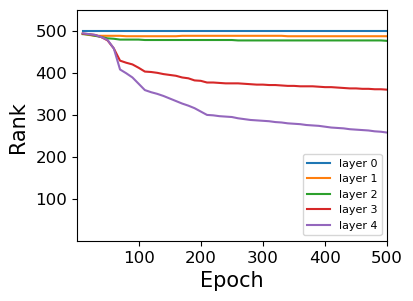

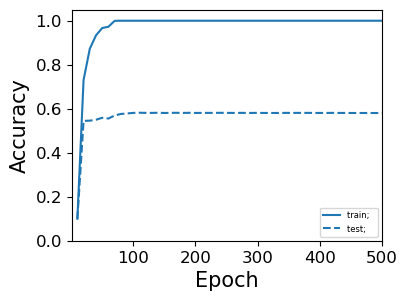

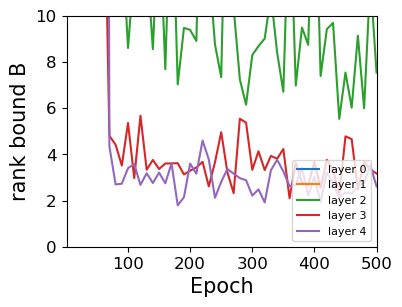

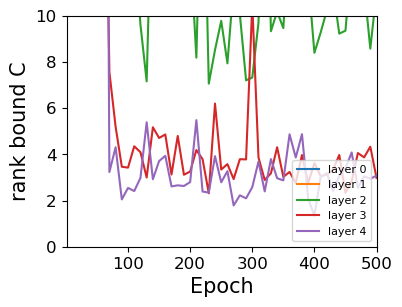


wd: 0.0004
lr: 0.01
bs: 16
xid: 7151


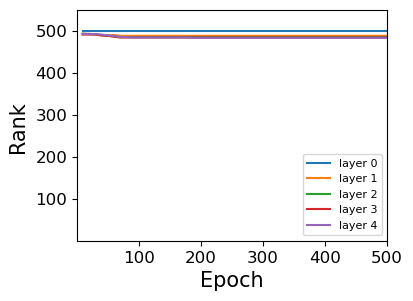

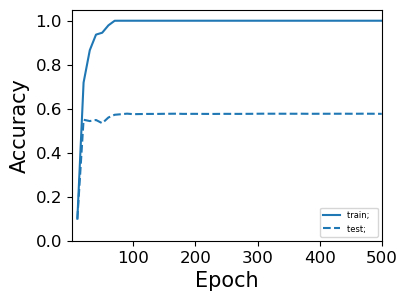

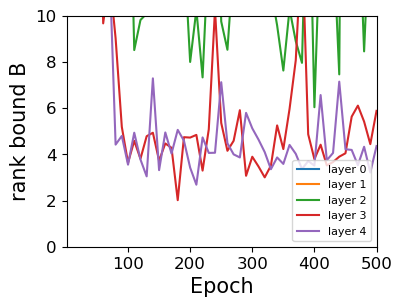

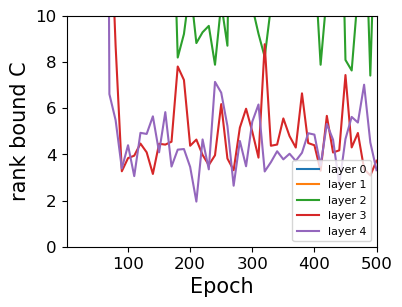


wd: 0.0004
lr: 0.01
bs: 32
xid: 7160


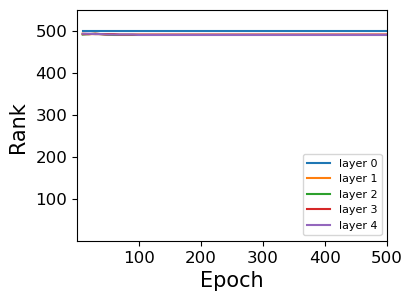

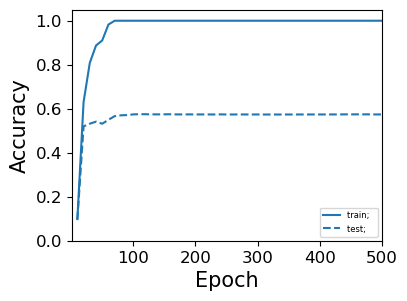

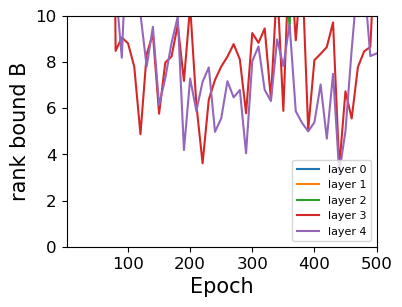

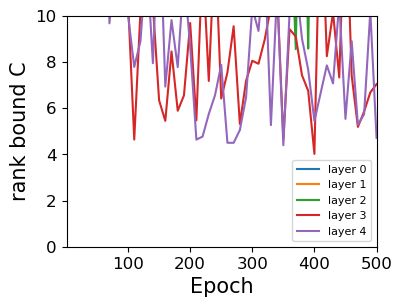


wd: 0.0004
lr: 0.1
bs: 4
xid: 7136


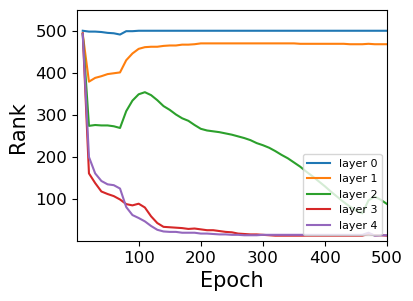

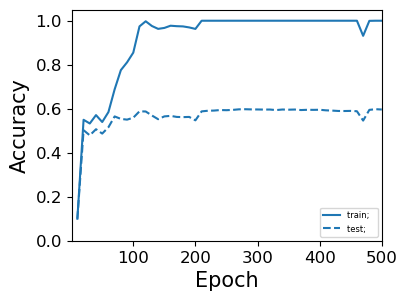

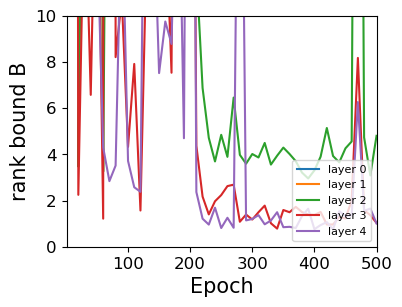

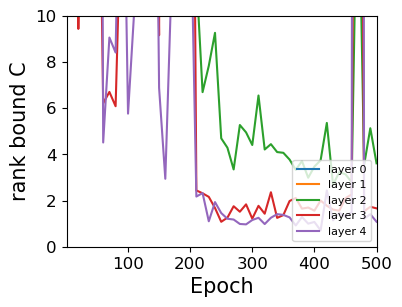


wd: 0.0004
lr: 0.1
bs: 8
xid: 7145


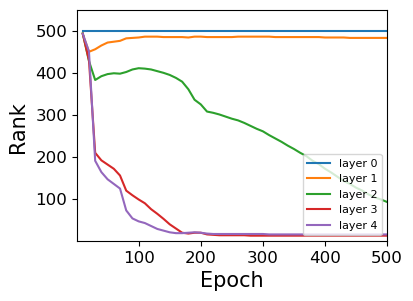

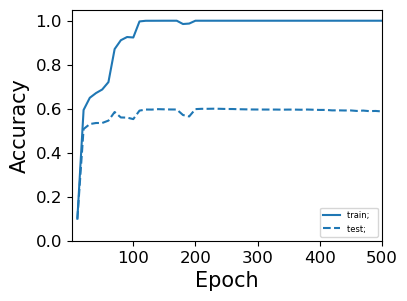

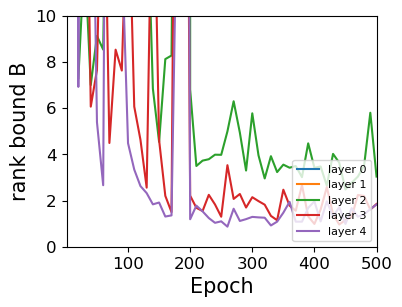

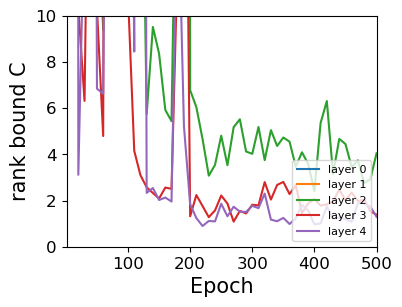


wd: 0.0004
lr: 0.1
bs: 16
xid: 7154


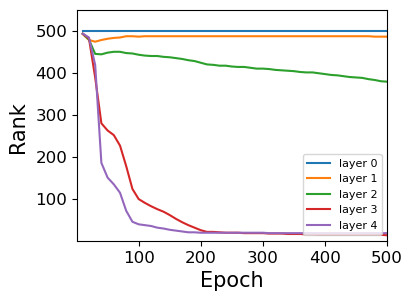

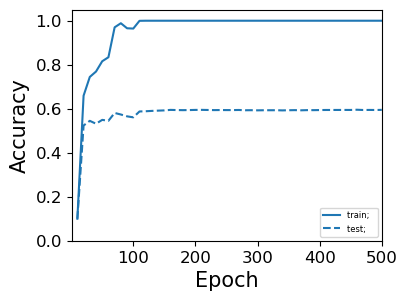

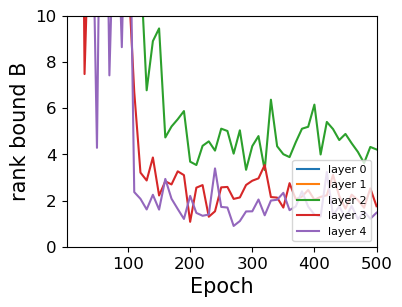

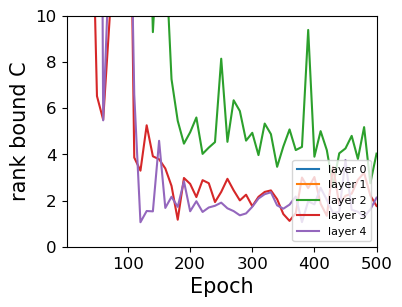


wd: 0.0004
lr: 0.1
bs: 32
xid: 7163


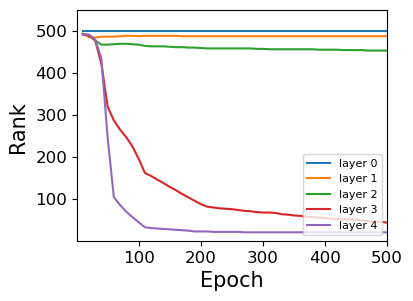

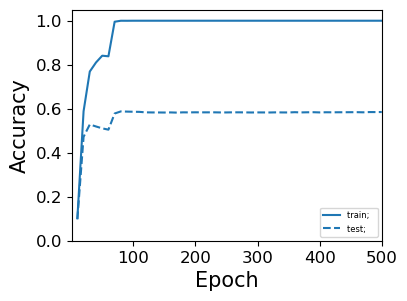

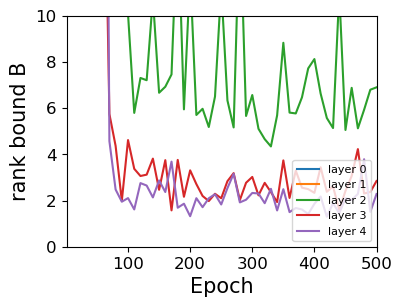

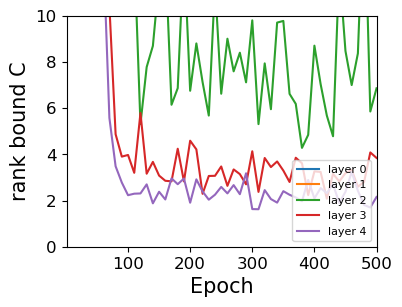


wd: 0.0004
lr: 0.5
bs: 4
early_stop xid 7139

wd: 0.0004
lr: 0.5
bs: 8
xid: 7148


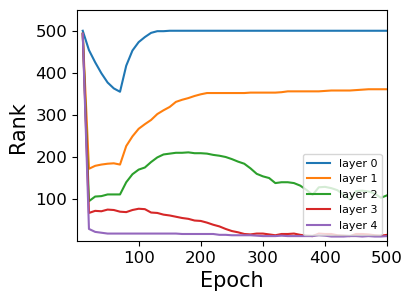

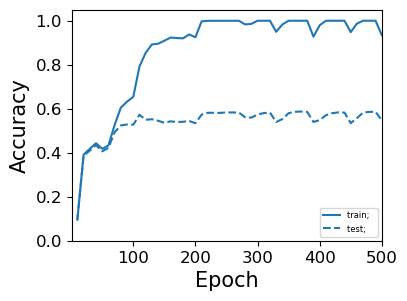

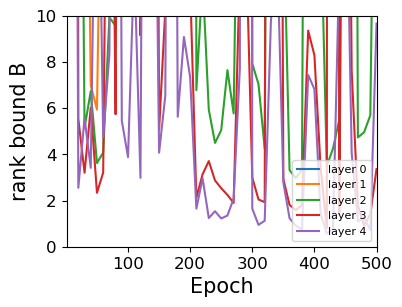

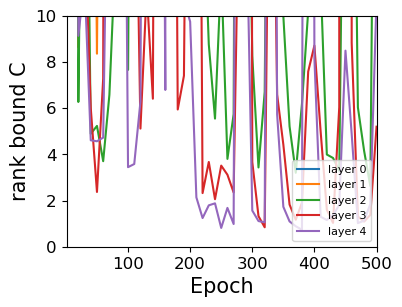


wd: 0.0004
lr: 0.5
bs: 16
xid: 7157


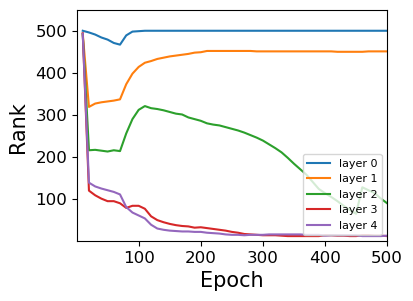

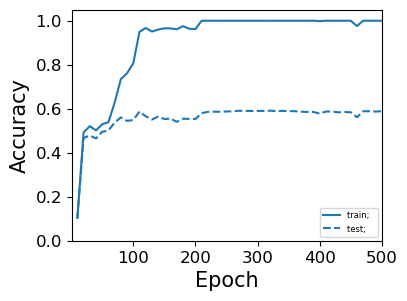

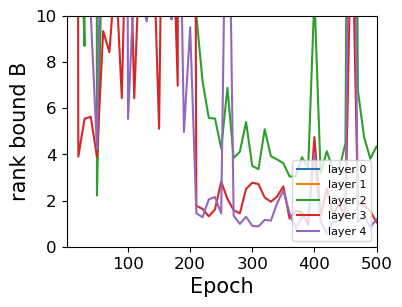

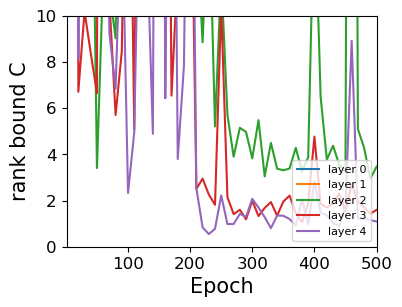


wd: 0.0004
lr: 0.5
bs: 32
xid: 7166


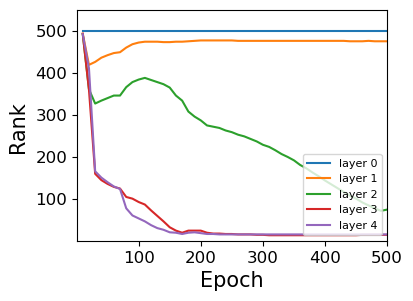

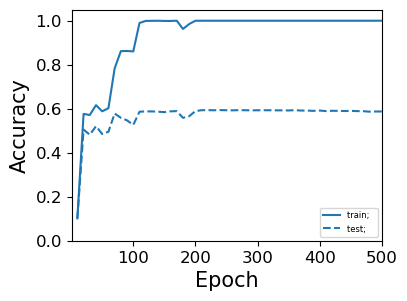

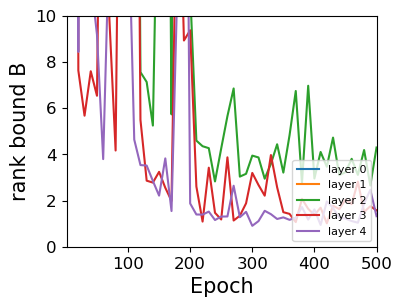

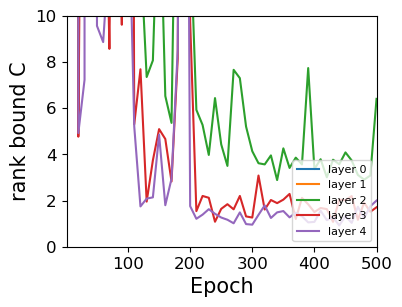


wd: 0.0008
lr: 0.01
bs: 4
xid: 7134


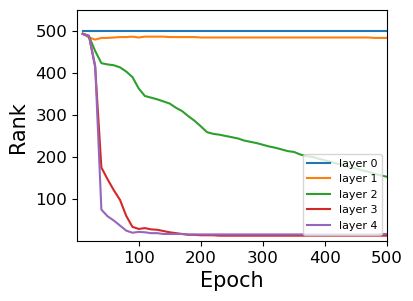

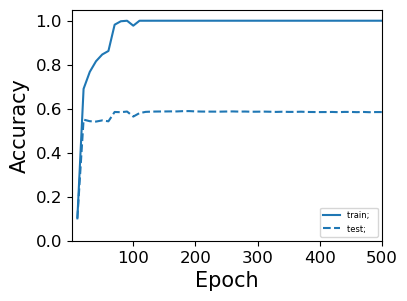

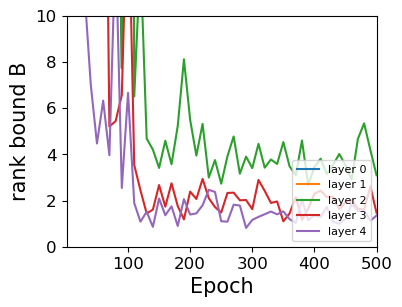

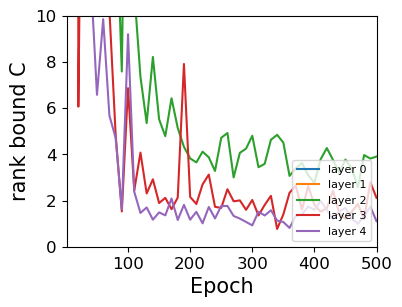


wd: 0.0008
lr: 0.01
bs: 8
xid: 7143


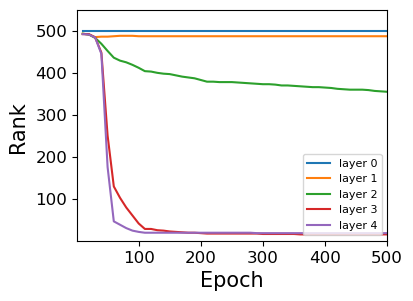

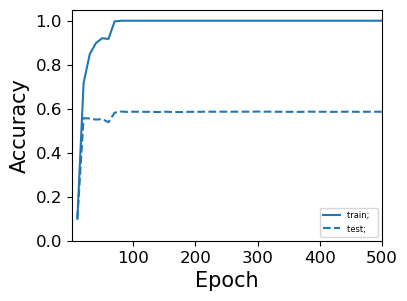

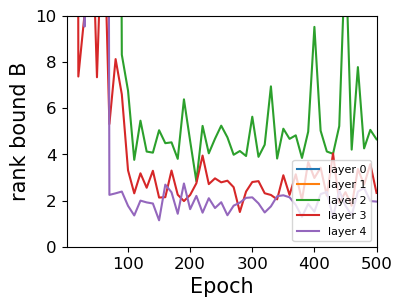

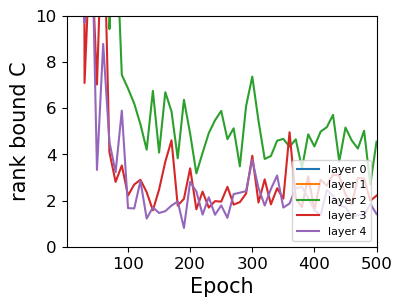


wd: 0.0008
lr: 0.01
bs: 16
xid: 7152


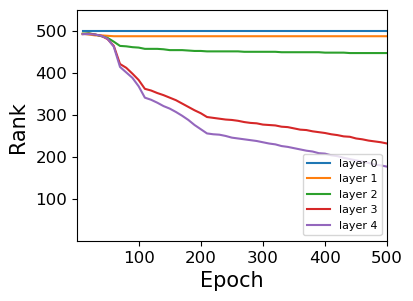

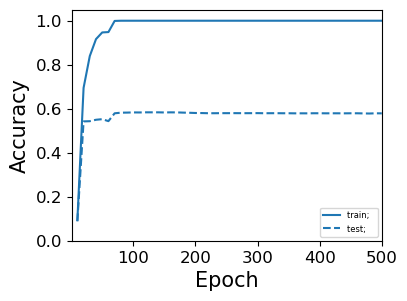

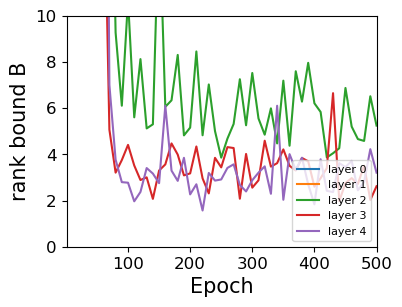

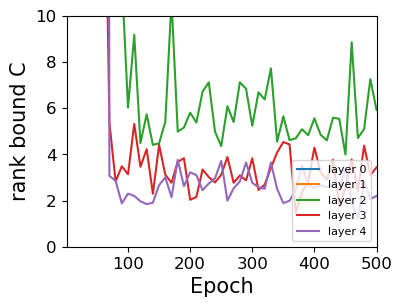


wd: 0.0008
lr: 0.01
bs: 32
xid: 7161


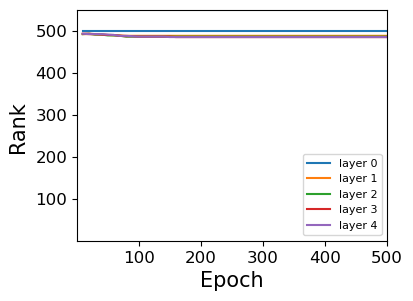

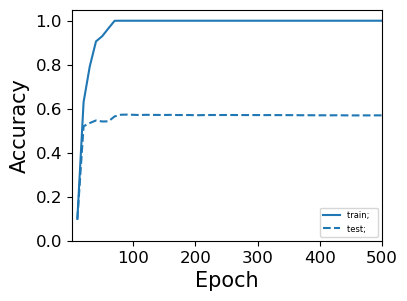

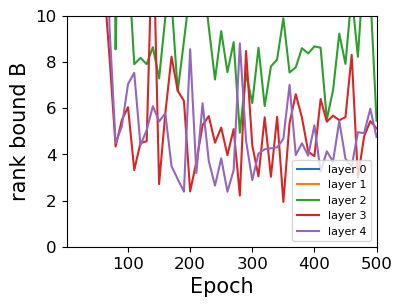

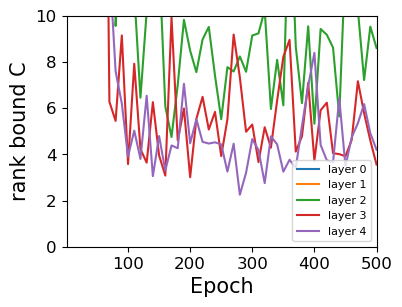


wd: 0.0008
lr: 0.1
bs: 4
xid: 7137


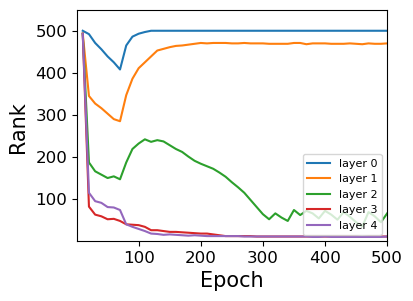

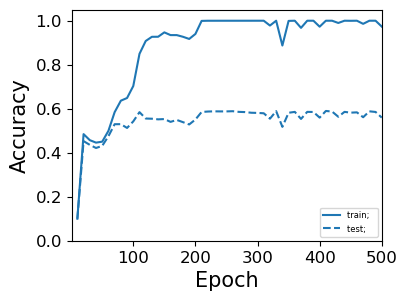

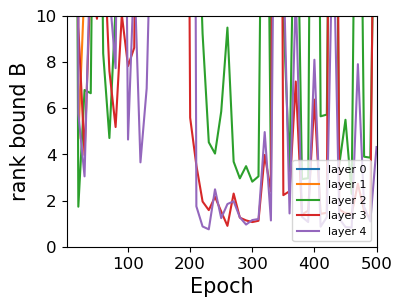

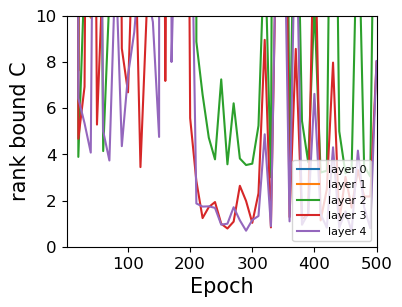


wd: 0.0008
lr: 0.1
bs: 8
xid: 7146


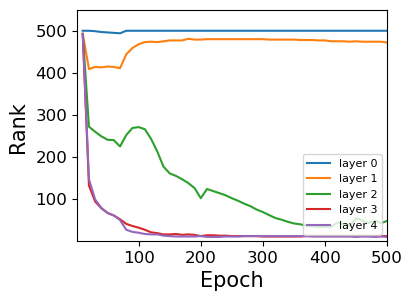

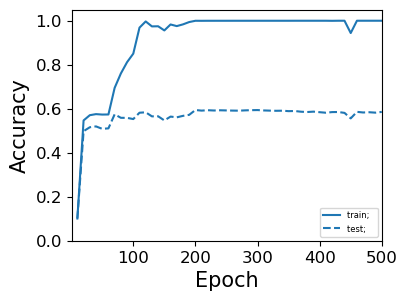

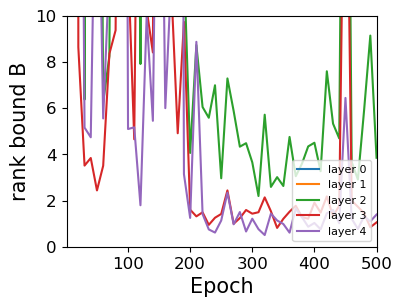

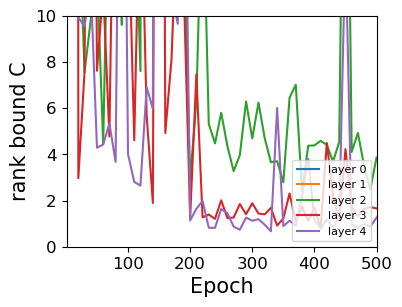


wd: 0.0008
lr: 0.1
bs: 16
xid: 7155


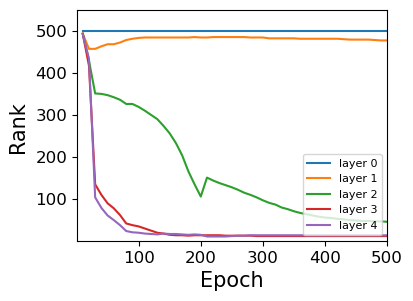

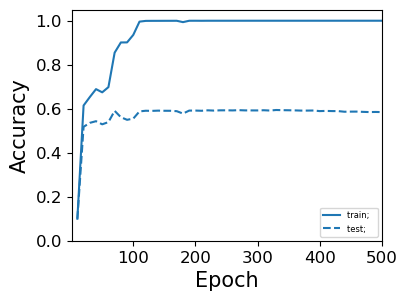

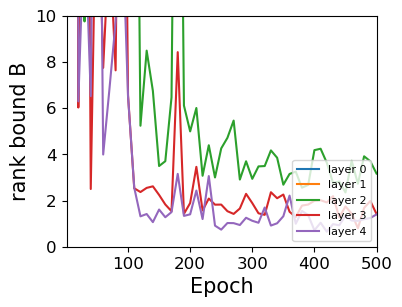

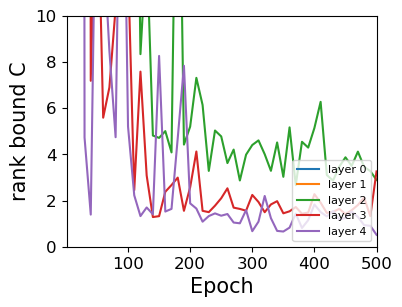


wd: 0.0008
lr: 0.1
bs: 32
xid: 7164


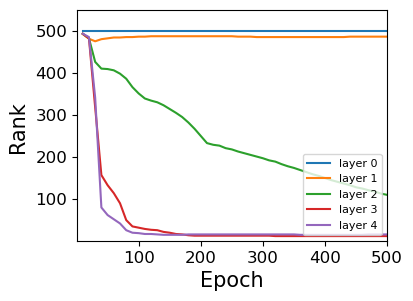

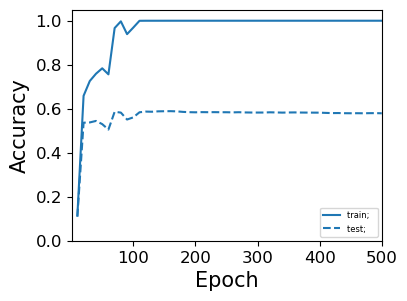

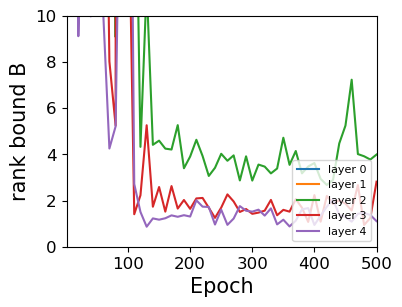

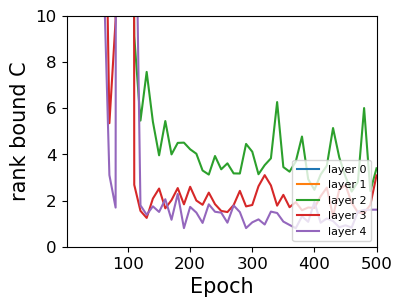


wd: 0.0008
lr: 0.5
bs: 4
early_stop xid 7140

wd: 0.0008
lr: 0.5
bs: 8
xid: 7149


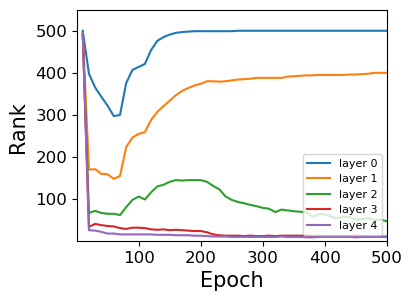

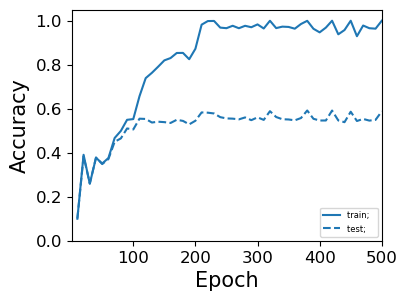

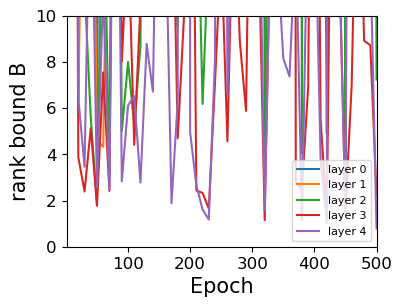

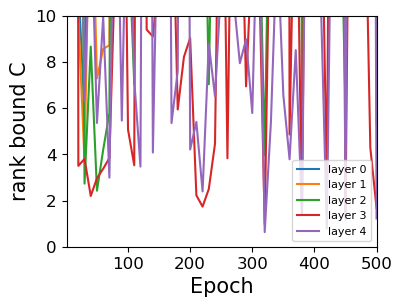


wd: 0.0008
lr: 0.5
bs: 16
xid: 7158


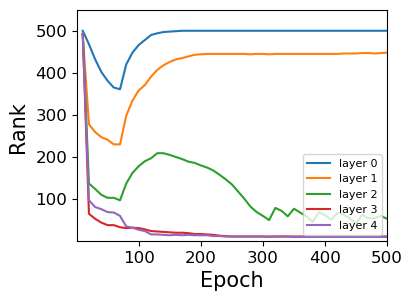

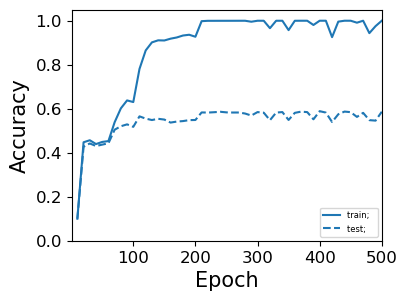

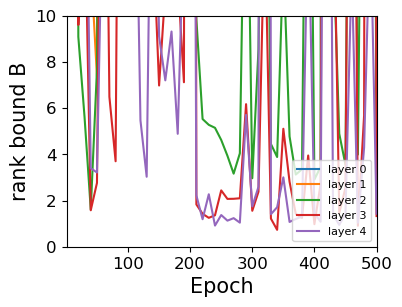

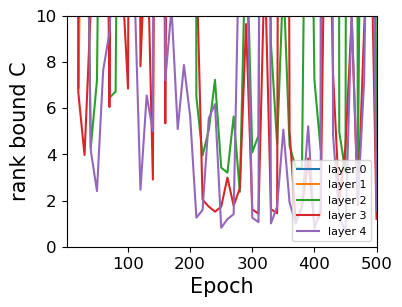


wd: 0.0008
lr: 0.5
bs: 32
xid: 7167


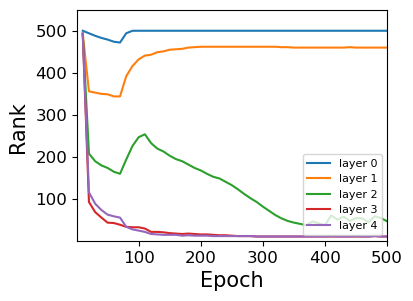

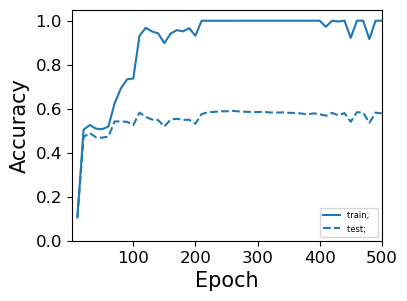

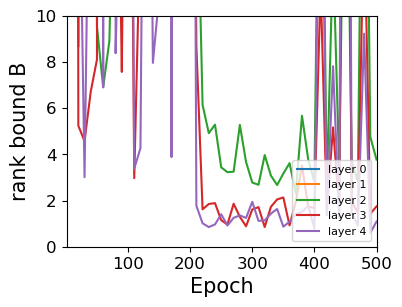

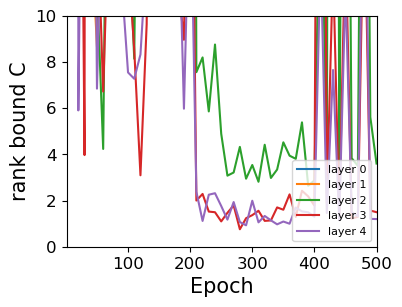

In [8]:
# Bound BC0, depth=5, width=500, weight decay on all layers
for weight_decay in [2e-4, 4e-4, 8e-4]:
    for lr in [0.01, 0.1, 0.5]:
        for batch_size in [4,8,16,32]:
            print("wd:", weight_decay)
            print("lr:", lr)
            print("bs:", batch_size)
            param_plot(
                net='mlp_wn',
                loss='CE', 
                batch_size=batch_size,
                weight_decay=weight_decay,
                lr=lr,
                depth=5,
                
                rank_bound_version='BC0',
                bound_batch_size=256,

                rank_bound=True,
                tol=0.001,
                rank_max=550,
                plot_types=['rank_bound_B','rank_bound_C'])
            print()

## Rank Bound C
$||\nabla_{V_k} L||*||V_k||/(|G_k * \nabla_{G_k} L|)$

lr: 0.001
wd: 0.0004
bs: 4
early_stop xid 5882

lr: 0.001
wd: 0.0004
bs: 8
early_stop xid 5932

lr: 0.001
wd: 0.0004
bs: 16
early_stop xid 5982

lr: 0.001
wd: 0.0004
bs: 32
early_stop xid 6032

lr: 0.001
wd: 0.0004
bs: 64
early_stop xid 6082

lr: 0.001
wd: 0.0004
bs: 128
early_stop xid 6132

lr: 0.01
wd: 0.0004
bs: 4
xid: 5892


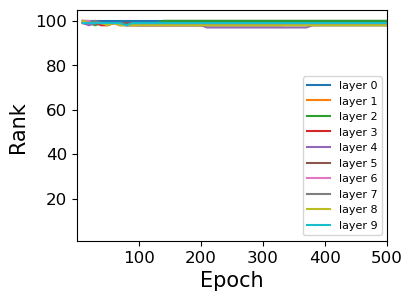

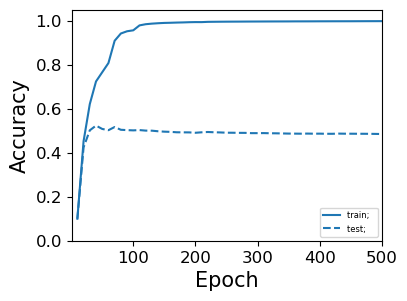

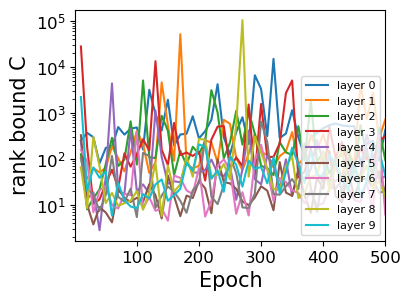


lr: 0.01
wd: 0.0004
bs: 8
xid: 5942


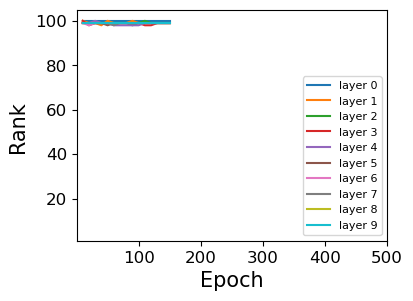

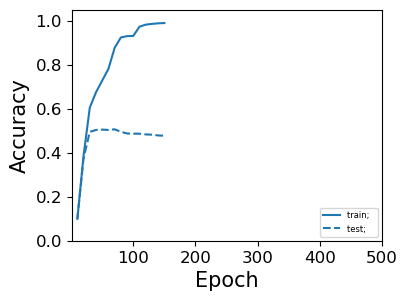

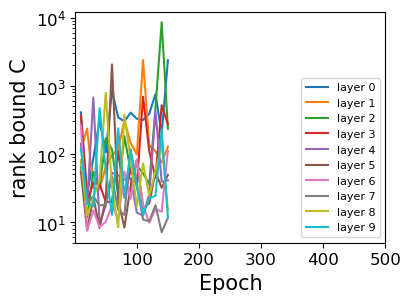


lr: 0.01
wd: 0.0004
bs: 16
xid: 5992


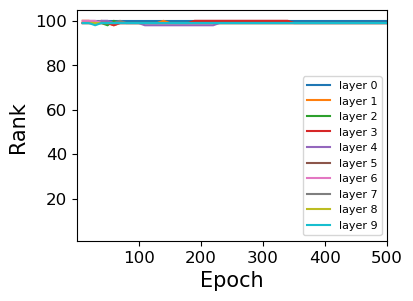

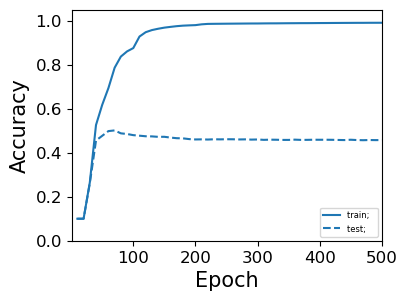

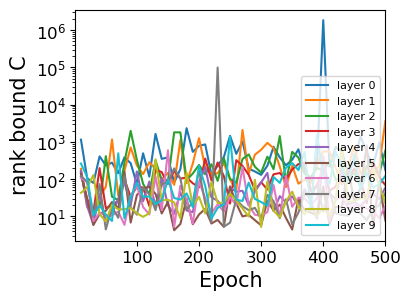


lr: 0.01
wd: 0.0004
bs: 32
xid: 6042


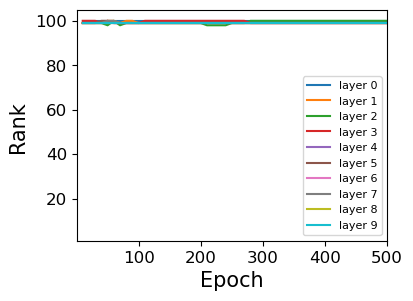

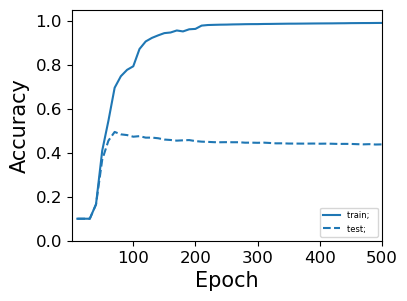

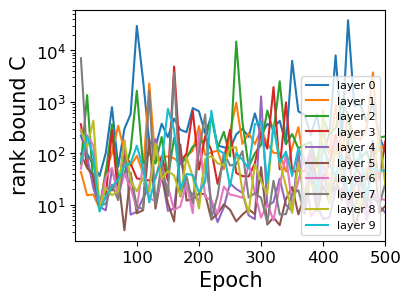


lr: 0.01
wd: 0.0004
bs: 64
early_stop xid 6092

lr: 0.01
wd: 0.0004
bs: 128
early_stop xid 6142

lr: 0.1
wd: 0.0004
bs: 4
early_stop xid 5902

lr: 0.1
wd: 0.0004
bs: 8
early_stop xid 5952

lr: 0.1
wd: 0.0004
bs: 16
xid: 6002


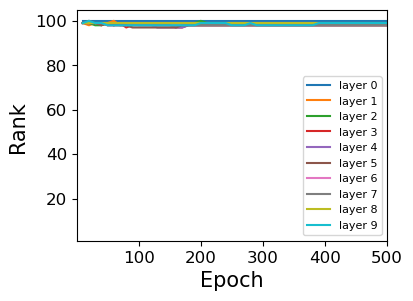

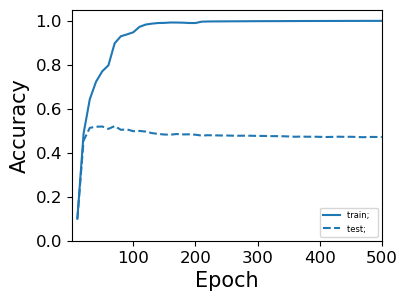

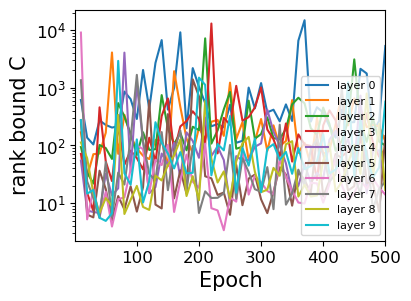


lr: 0.1
wd: 0.0004
bs: 32
xid: 6052


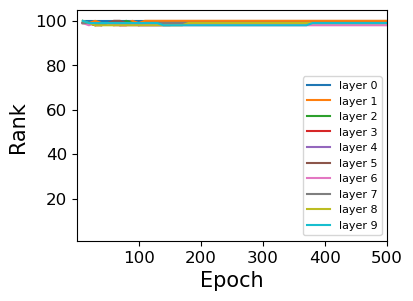

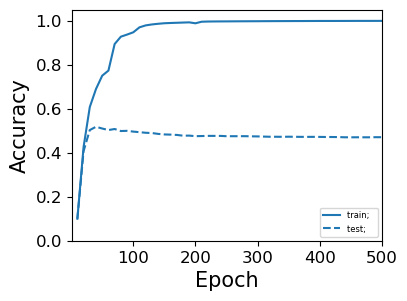

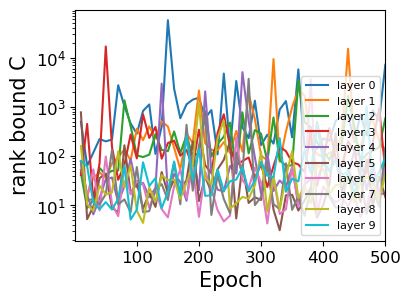


lr: 0.1
wd: 0.0004
bs: 64
xid: 6102


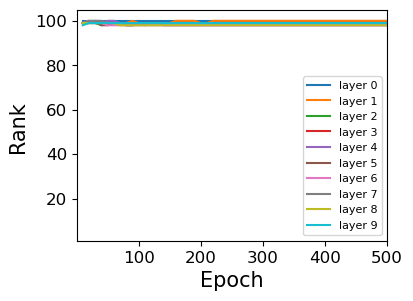

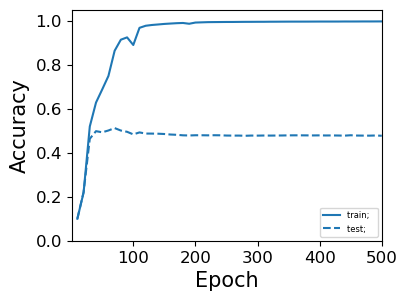

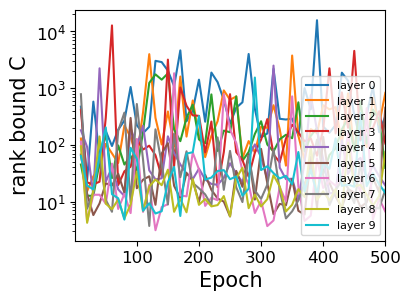


lr: 0.1
wd: 0.0004
bs: 128
xid: 6152


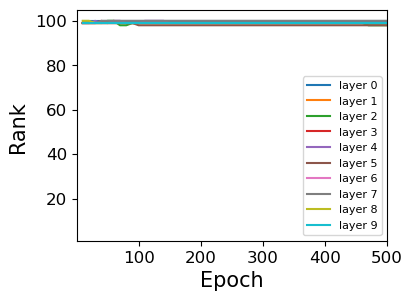

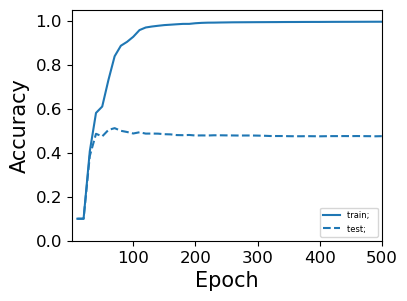

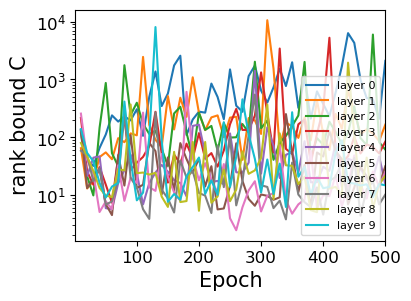


lr: 0.5
wd: 0.0004
bs: 4
early_stop xid 5912

lr: 0.5
wd: 0.0004
bs: 8
early_stop xid 5962

lr: 0.5
wd: 0.0004
bs: 16
early_stop xid 6012

lr: 0.5
wd: 0.0004
bs: 32
early_stop xid 6062

lr: 0.5
wd: 0.0004
bs: 64
xid: 6112


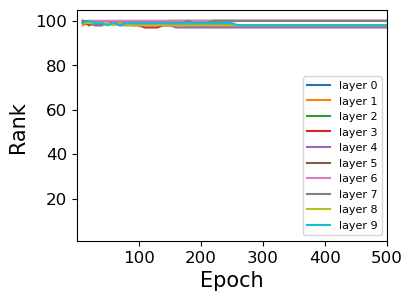

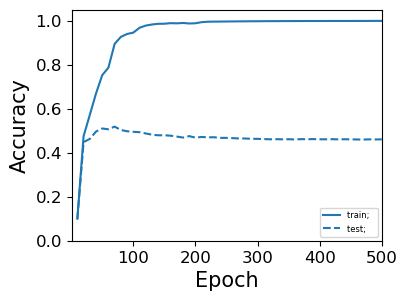

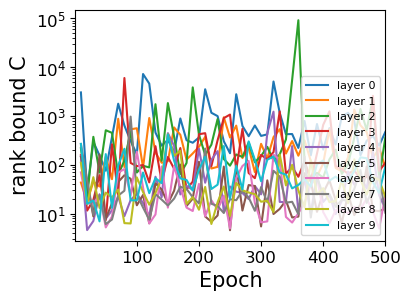


lr: 0.5
wd: 0.0004
bs: 128
xid: 6162


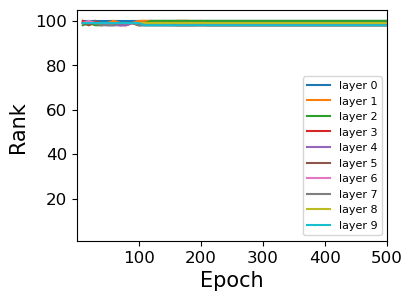

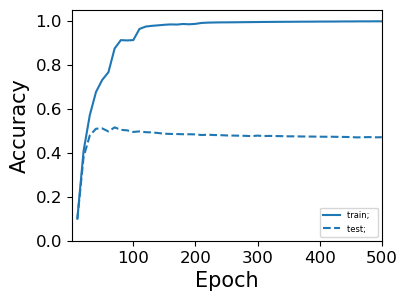

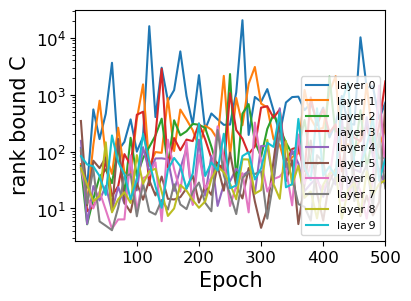


lr: 1.0
wd: 0.0004
bs: 4
early_stop xid 5922

lr: 1.0
wd: 0.0004
bs: 8
early_stop xid 5972

lr: 1.0
wd: 0.0004
bs: 16
early_stop xid 6022

lr: 1.0
wd: 0.0004
bs: 32
early_stop xid 6072

lr: 1.0
wd: 0.0004
bs: 64
early_stop xid 6122

lr: 1.0
wd: 0.0004
bs: 128
early_stop xid 6172

lr: 0.001
wd: 0.0008
bs: 4
xid: 5884


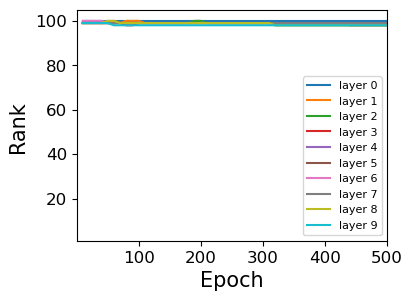

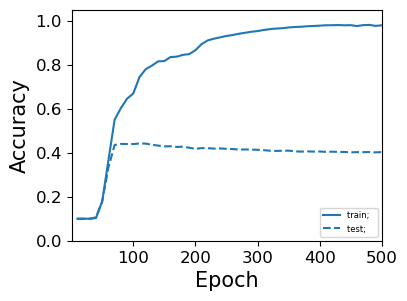

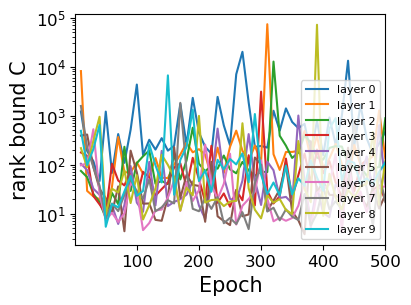


lr: 0.001
wd: 0.0008
bs: 8
early_stop xid 5934

lr: 0.001
wd: 0.0008
bs: 16
early_stop xid 5984

lr: 0.001
wd: 0.0008
bs: 32
early_stop xid 6034

lr: 0.001
wd: 0.0008
bs: 64
early_stop xid 6084

lr: 0.001
wd: 0.0008
bs: 128
early_stop xid 6134

lr: 0.01
wd: 0.0008
bs: 4
xid: 5894


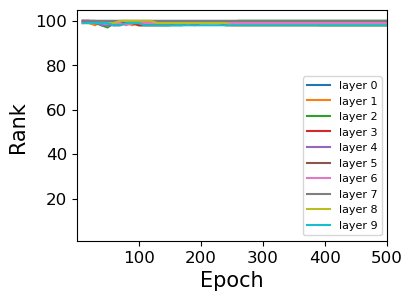

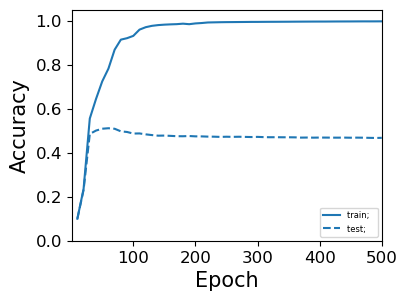

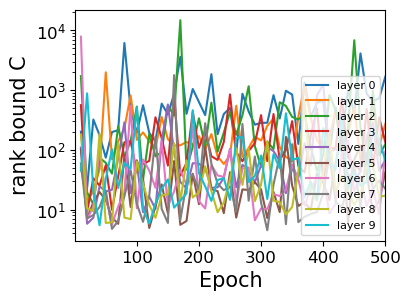


lr: 0.01
wd: 0.0008
bs: 8
xid: 5944


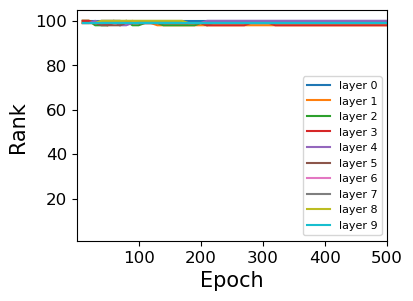

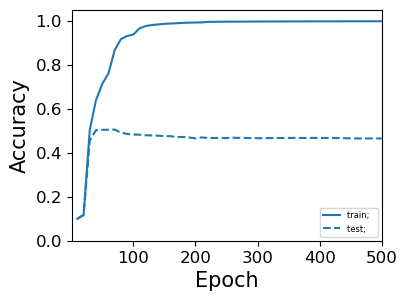

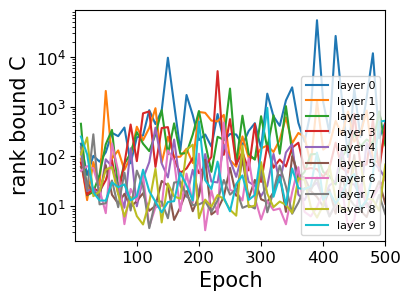


lr: 0.01
wd: 0.0008
bs: 16
xid: 5994


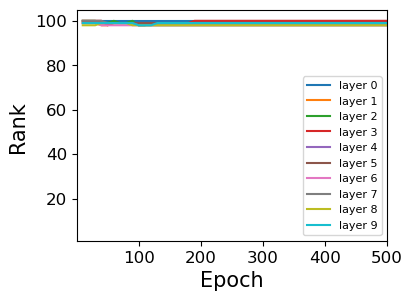

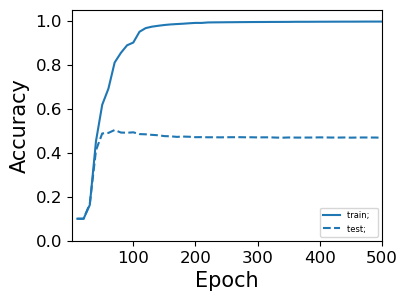

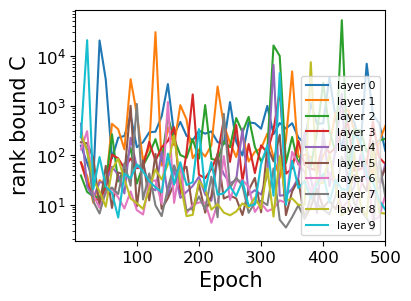


lr: 0.01
wd: 0.0008
bs: 32
xid: 6044


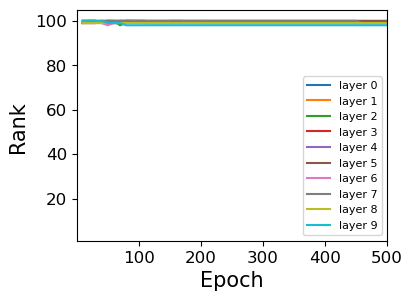

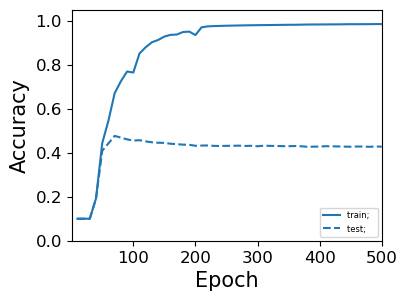

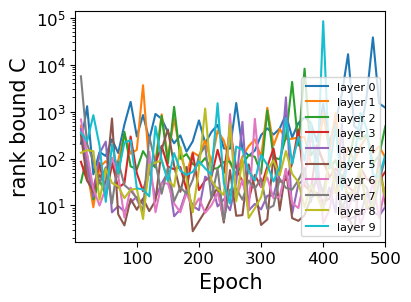


lr: 0.01
wd: 0.0008
bs: 64
early_stop xid 6094

lr: 0.01
wd: 0.0008
bs: 128
early_stop xid 6144

lr: 0.1
wd: 0.0008
bs: 4
early_stop xid 5904

lr: 0.1
wd: 0.0008
bs: 8
early_stop xid 5954

lr: 0.1
wd: 0.0008
bs: 16
xid: 6004


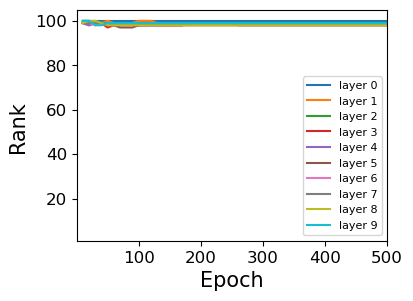

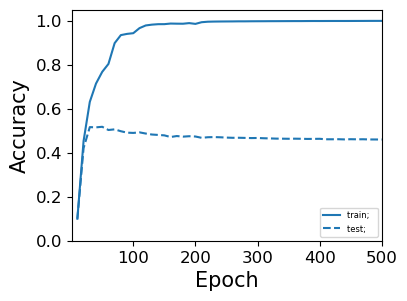

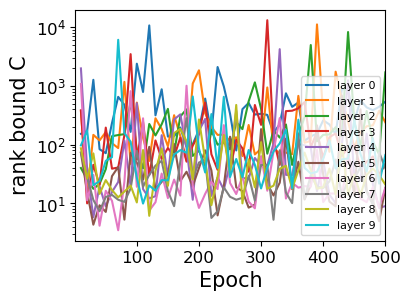


lr: 0.1
wd: 0.0008
bs: 32
xid: 6054


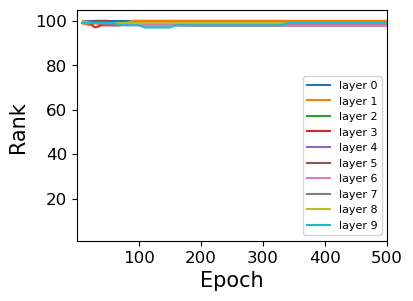

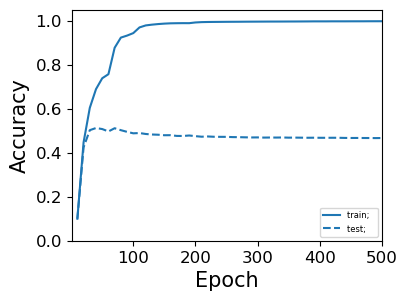

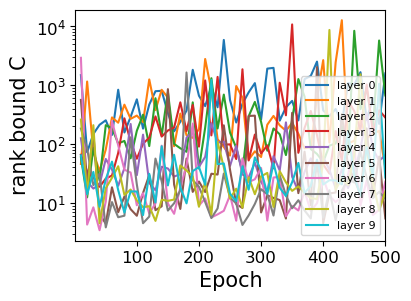


lr: 0.1
wd: 0.0008
bs: 64
xid: 6104


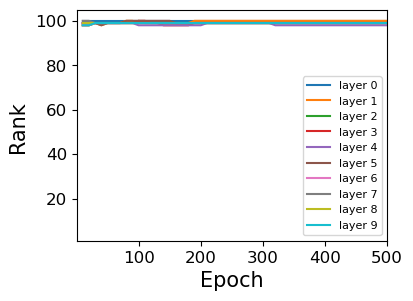

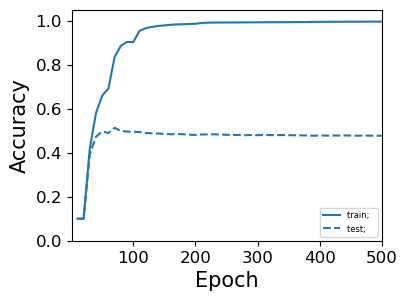

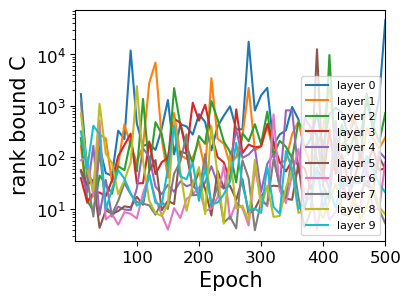


lr: 0.1
wd: 0.0008
bs: 128
xid: 6154


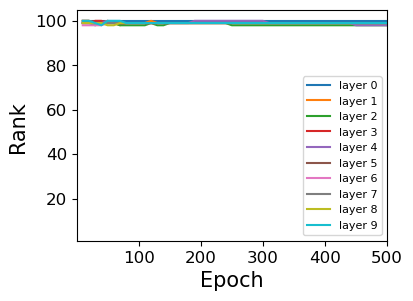

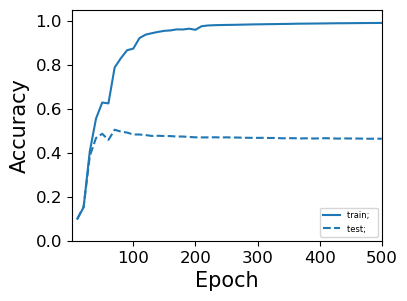

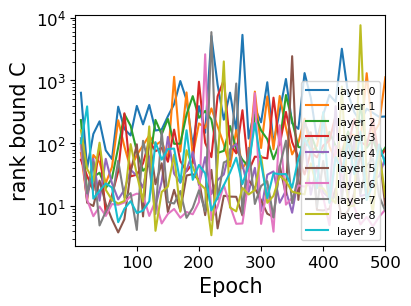


lr: 0.5
wd: 0.0008
bs: 4
early_stop xid 5914

lr: 0.5
wd: 0.0008
bs: 8
early_stop xid 5964

lr: 0.5
wd: 0.0008
bs: 16
early_stop xid 6014

lr: 0.5
wd: 0.0008
bs: 32
early_stop xid 6064

lr: 0.5
wd: 0.0008
bs: 64
early_stop xid 6114

lr: 0.5
wd: 0.0008
bs: 128
xid: 6164


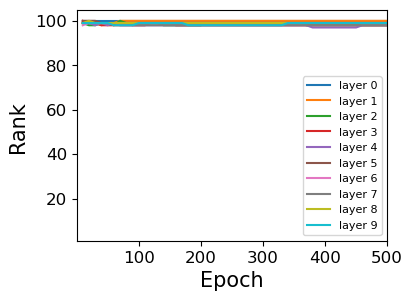

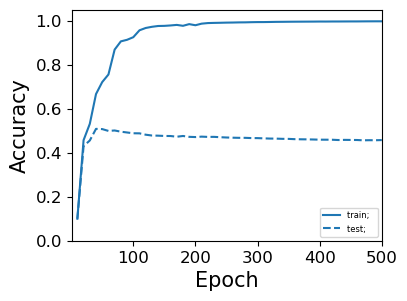

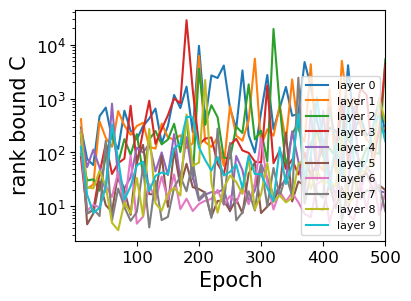


lr: 1.0
wd: 0.0008
bs: 4
early_stop xid 5924

lr: 1.0
wd: 0.0008
bs: 8
early_stop xid 5974

lr: 1.0
wd: 0.0008
bs: 16
early_stop xid 6024

lr: 1.0
wd: 0.0008
bs: 32
early_stop xid 6074

lr: 1.0
wd: 0.0008
bs: 64
early_stop xid 6124

lr: 1.0
wd: 0.0008
bs: 128
early_stop xid 6174

lr: 0.001
wd: 0.006
bs: 4
early_stop xid 6176

lr: 0.001
wd: 0.006
bs: 8
early_stop xid 6216

lr: 0.001
wd: 0.006
bs: 16
early_stop xid 6256

lr: 0.001
wd: 0.006
bs: 32
early_stop xid 6296

lr: 0.001
wd: 0.006
bs: 64
early_stop xid 6336

lr: 0.001
wd: 0.006
bs: 128
early_stop xid 6376

lr: 0.01
wd: 0.006
bs: 4
xid: 6184


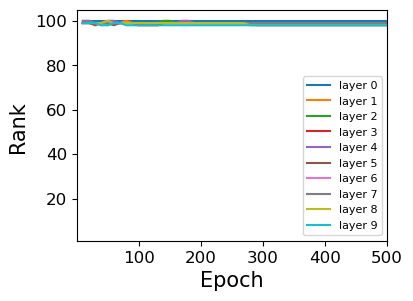

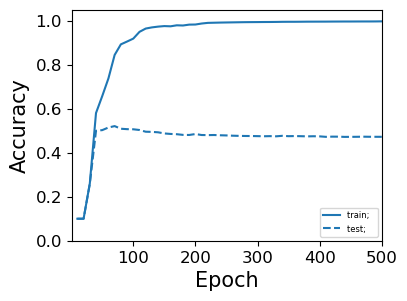

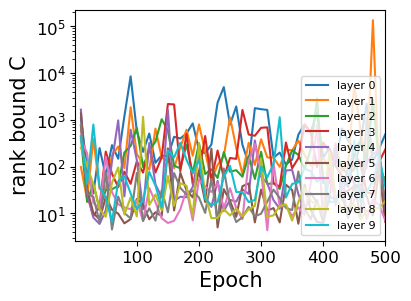


lr: 0.01
wd: 0.006
bs: 8
xid: 6224


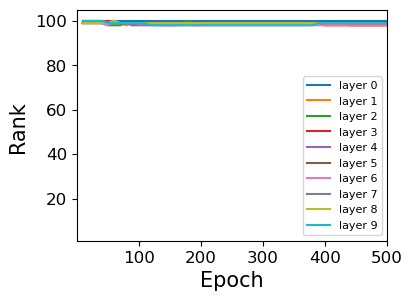

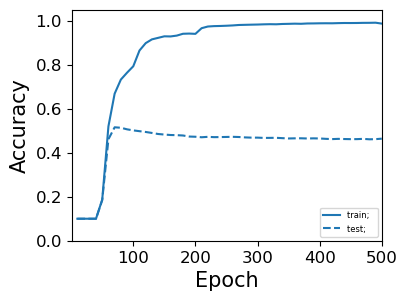

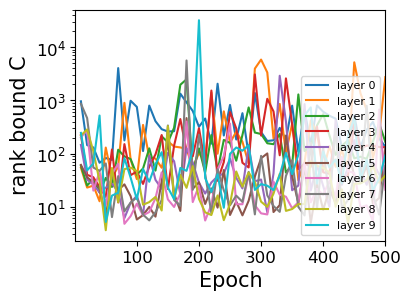


lr: 0.01
wd: 0.006
bs: 16
xid: 6264


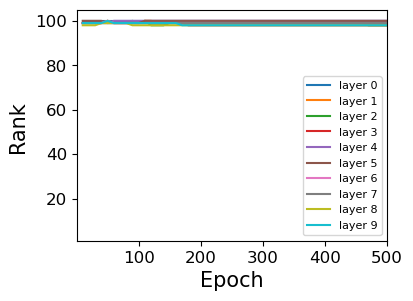

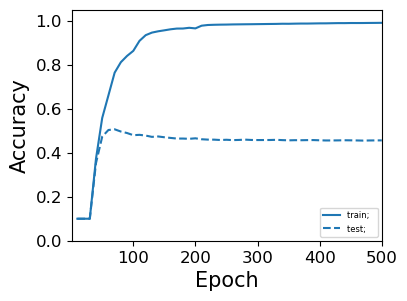

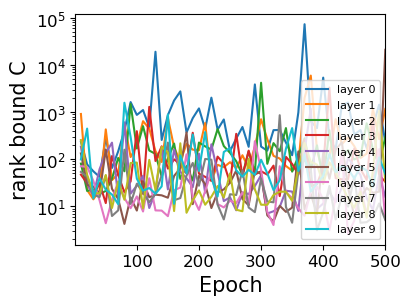


lr: 0.01
wd: 0.006
bs: 32
early_stop xid 6304

lr: 0.01
wd: 0.006
bs: 64
early_stop xid 6344

lr: 0.01
wd: 0.006
bs: 128
early_stop xid 6384

lr: 0.1
wd: 0.006
bs: 4
early_stop xid 6192

lr: 0.1
wd: 0.006
bs: 8
xid: 6232


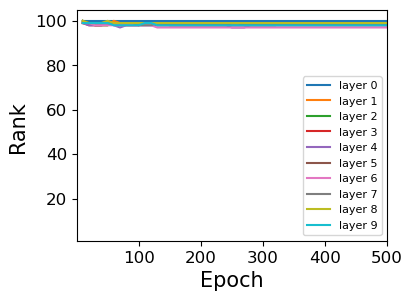

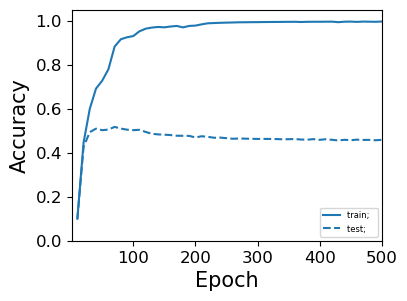

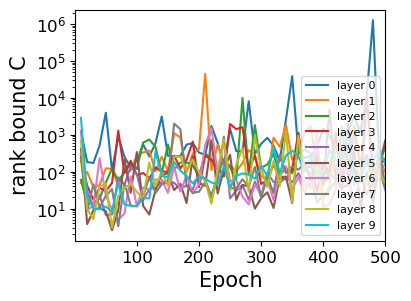


lr: 0.1
wd: 0.006
bs: 16
xid: 6272


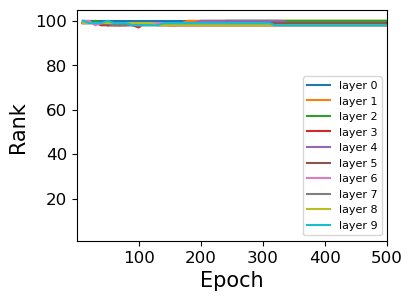

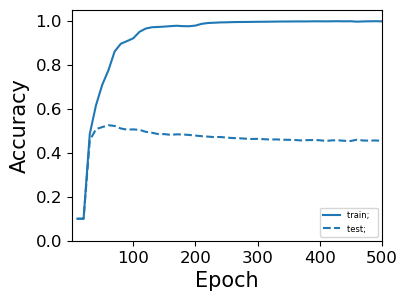

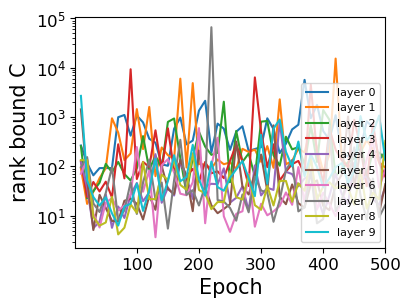


lr: 0.1
wd: 0.006
bs: 32
early_stop xid 6312

lr: 0.1
wd: 0.006
bs: 64
xid: 6352


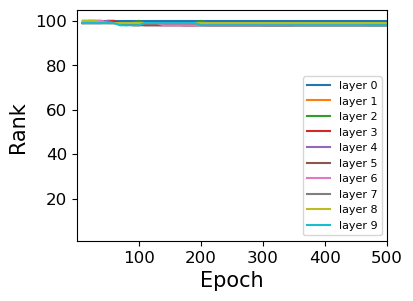

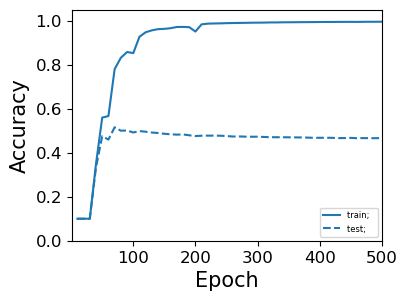

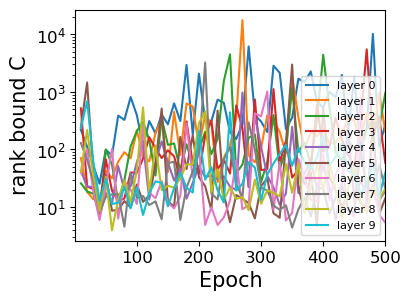


lr: 0.1
wd: 0.006
bs: 128
early_stop xid 6392

lr: 0.5
wd: 0.006
bs: 4
early_stop xid 6200

lr: 0.5
wd: 0.006
bs: 8
early_stop xid 6240

lr: 0.5
wd: 0.006
bs: 16
early_stop xid 6280

lr: 0.5
wd: 0.006
bs: 32
xid: 6320


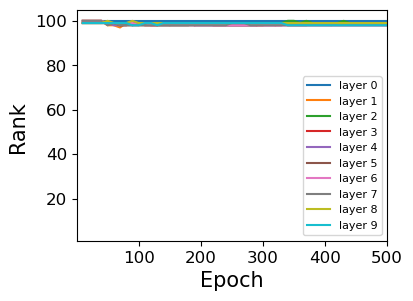

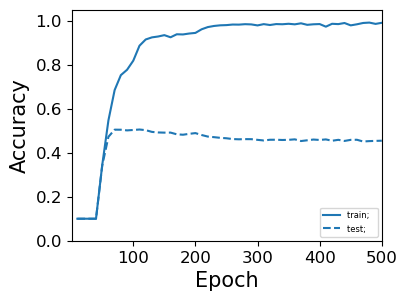

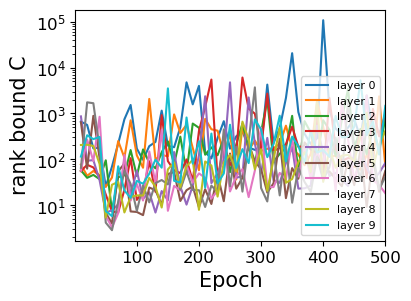


lr: 0.5
wd: 0.006
bs: 64
xid: 6360


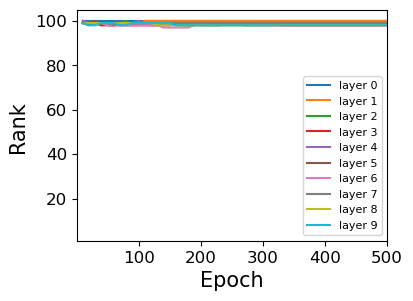

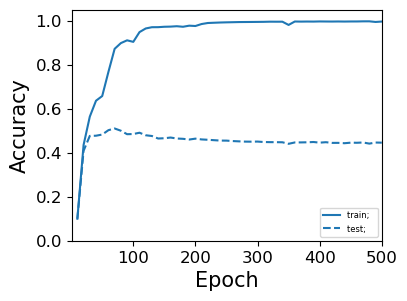

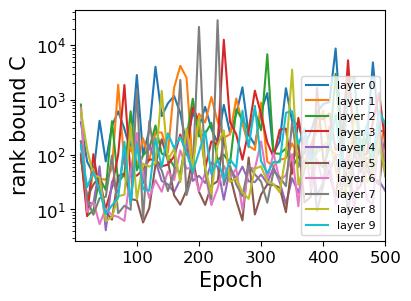


lr: 0.5
wd: 0.006
bs: 128
xid: 6400


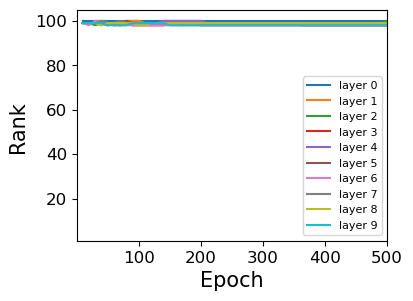

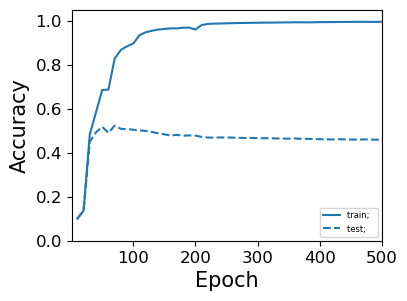

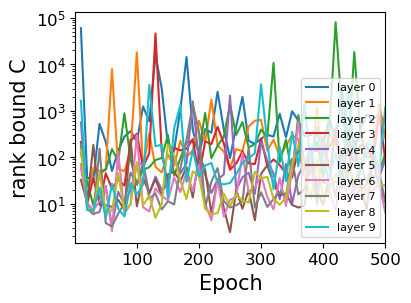


lr: 1.0
wd: 0.006
bs: 4
early_stop xid 6208

lr: 1.0
wd: 0.006
bs: 8
early_stop xid 6248

lr: 1.0
wd: 0.006
bs: 16
early_stop xid 6288

lr: 1.0
wd: 0.006
bs: 32
early_stop xid 6328

lr: 1.0
wd: 0.006
bs: 64
xid: 6368


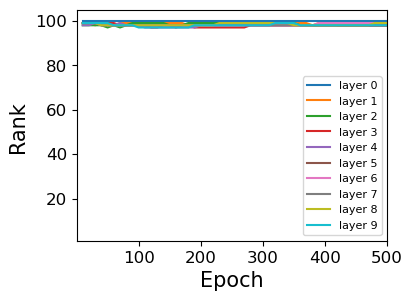

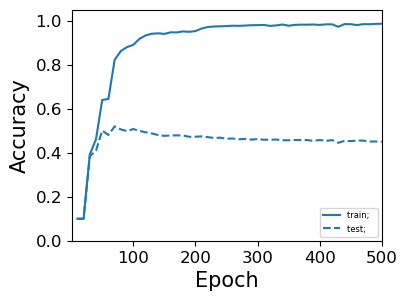

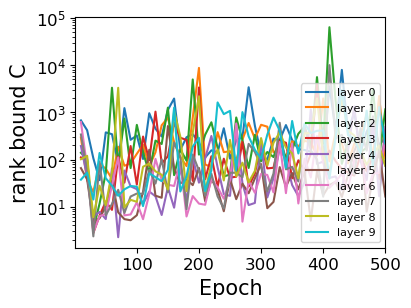


lr: 1.0
wd: 0.006
bs: 128


Exception: No experiments match the criteria.

In [5]:
# Bound C, depth=10, width=100, weight decay on last layer
for weight_decay in [4e-4, 8e-4, 6e-3, 12e-3, 24e-3, 48e-3]:
    for lr in [0.001, 0.01, 0.1, 0.5, 1.0]:
        for batch_size in [4,8,16,32,64,128]:
            print("wd:", weight_decay)
            print("lr:", lr)
            print("bs:", batch_size)
            param_plot(
                net='mlp_wn',
                loss='CE', 
                batch_size=batch_size,
                weight_decay=weight_decay,
                lr=lr,
                depth=10,
                
                rank_bound_version='C0',
                bound_batch_size=128,

                rank_bound=True,
                tol=0.001,
                rank_max=105,
                plot_types=['rank_bound_C'])
            print()

## Rank Bound B
$||\nabla_{V_i} L(f_W)|| * ||V_i|| / | (1/B) * \sum_{j} (<dloss_j/df_j, f_j>) |$

lr: 0.001
wd: 0.0004
bs: 4
early_stop xid 5582

lr: 0.001
wd: 0.0004
bs: 8
xid: 5632


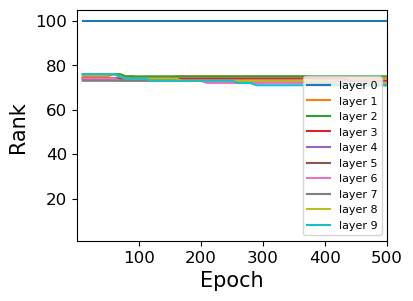

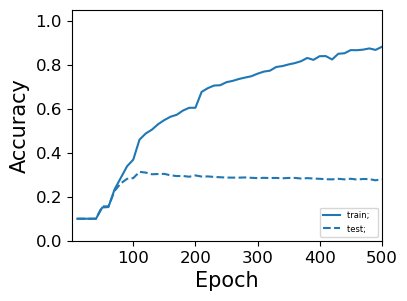

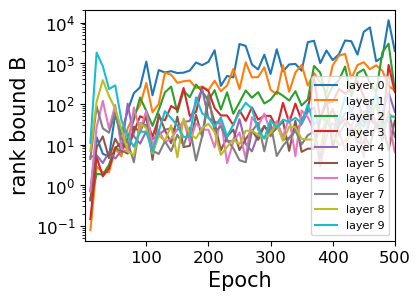

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



lr: 0.001
wd: 0.0004
bs: 16
early_stop xid 5682

lr: 0.001
wd: 0.0004
bs: 32
xid: 5732


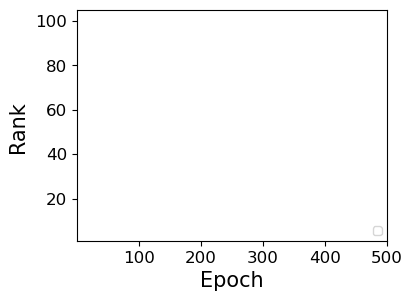

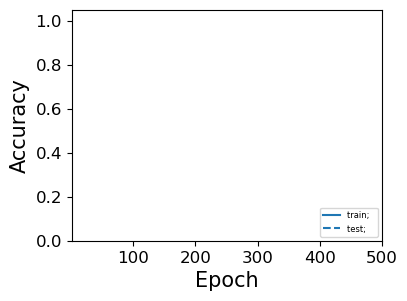

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


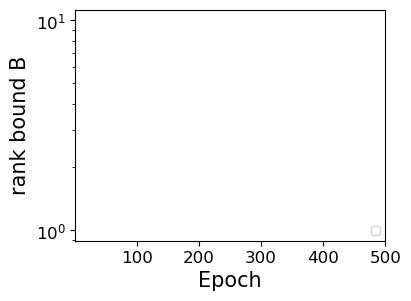


lr: 0.001
wd: 0.0004
bs: 64
early_stop xid 5782

lr: 0.001
wd: 0.0004
bs: 128
early_stop xid 5832

lr: 0.001
wd: 0.0008
bs: 4


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


xid: 5584


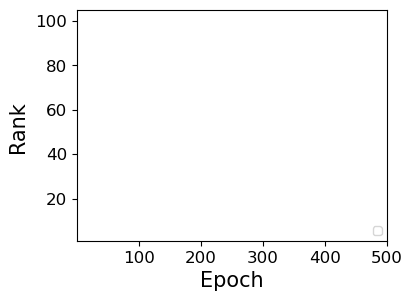

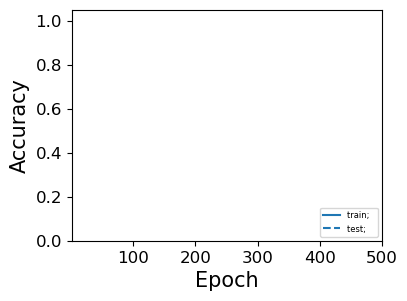

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


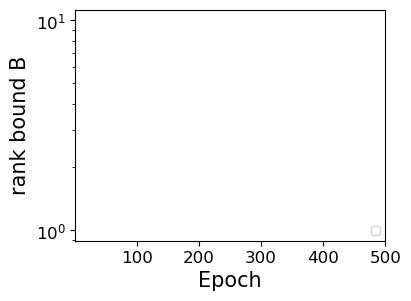


lr: 0.001
wd: 0.0008
bs: 8
early_stop xid 5634

lr: 0.001
wd: 0.0008
bs: 16
early_stop xid 5684

lr: 0.001
wd: 0.0008
bs: 32
early_stop xid 5734

lr: 0.001
wd: 0.0008
bs: 64
early_stop xid 5784

lr: 0.001
wd: 0.0008
bs: 128
early_stop xid 5834

lr: 0.01
wd: 0.0004
bs: 4
xid: 5592


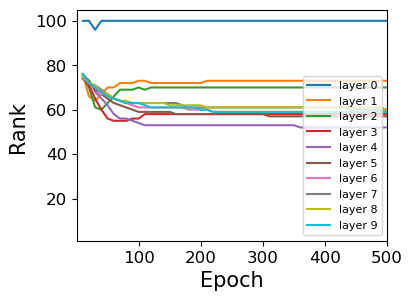

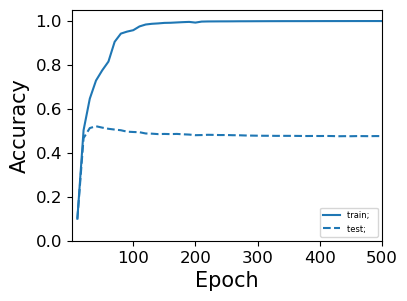

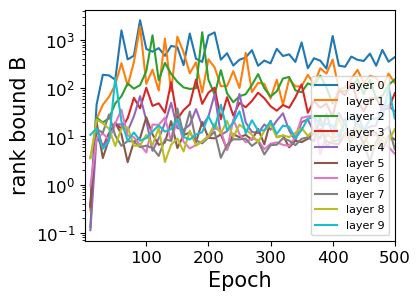


lr: 0.01
wd: 0.0004
bs: 8
xid: 5642


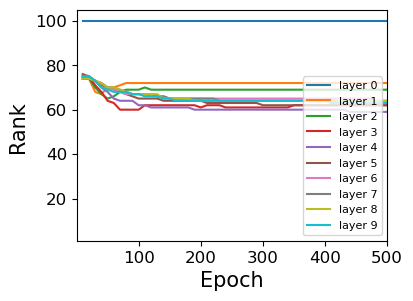

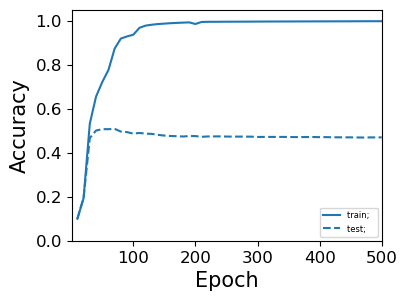

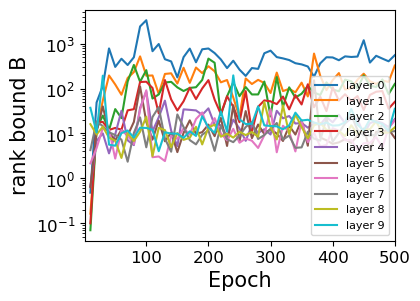


lr: 0.01
wd: 0.0004
bs: 16
xid: 5692


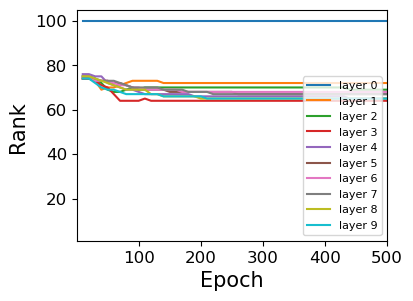

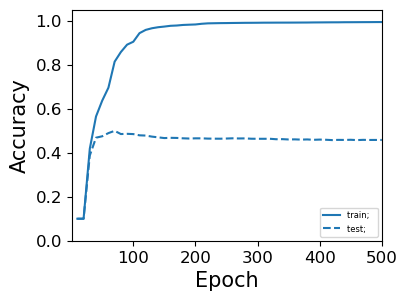

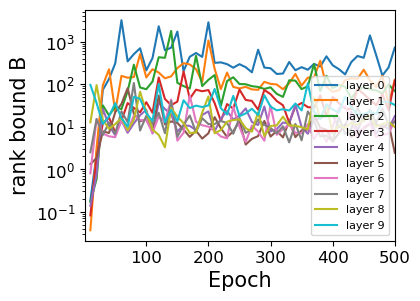


lr: 0.01
wd: 0.0004
bs: 32
xid: 5742


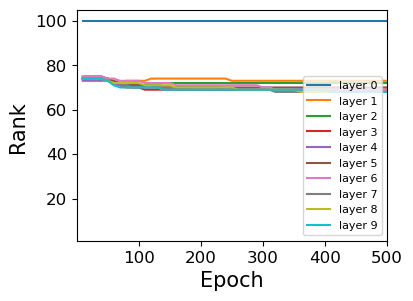

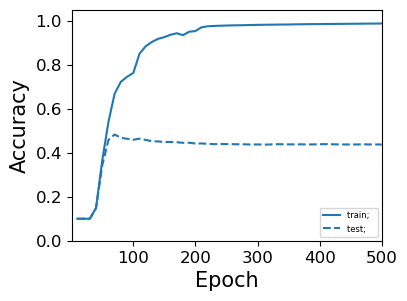

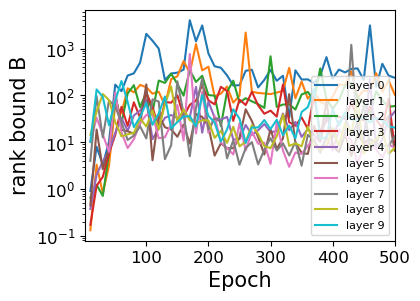


lr: 0.01
wd: 0.0004
bs: 64
early_stop xid 5792

lr: 0.01
wd: 0.0004
bs: 128
early_stop xid 5842

lr: 0.01
wd: 0.0008
bs: 4
xid: 5594


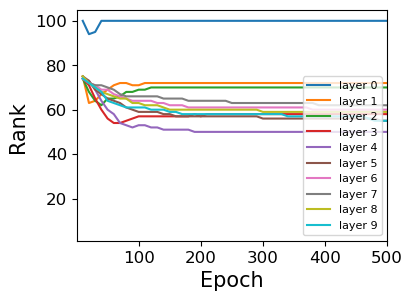

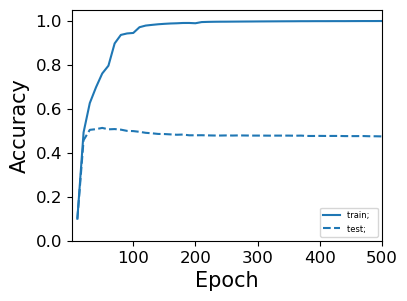

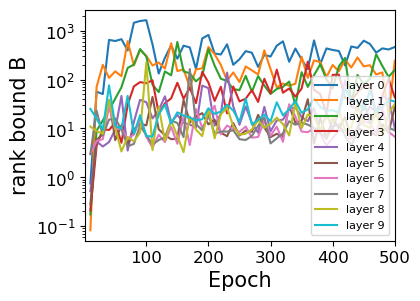


lr: 0.01
wd: 0.0008
bs: 8
xid: 5644


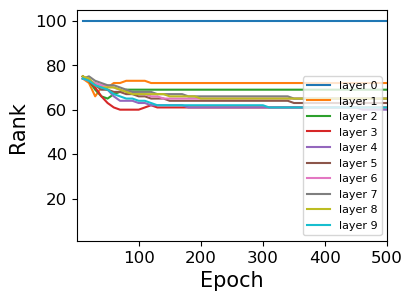

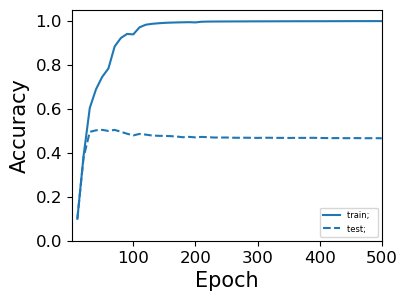

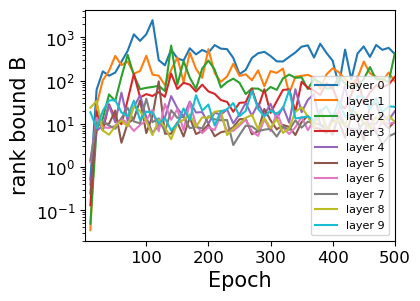


lr: 0.01
wd: 0.0008
bs: 16
xid: 5694


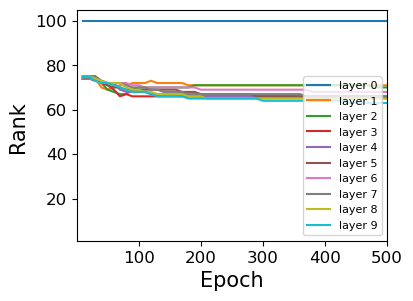

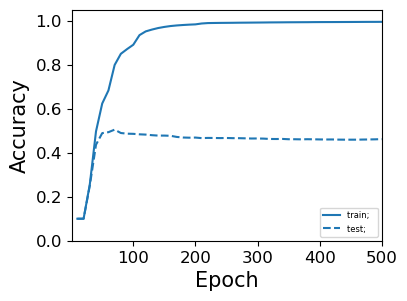

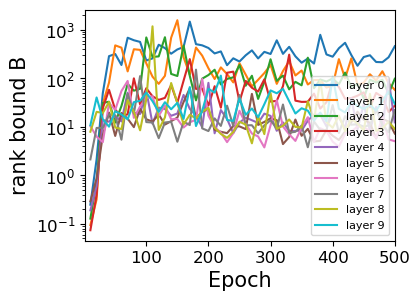

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



lr: 0.01
wd: 0.0008
bs: 32
xid: 5744


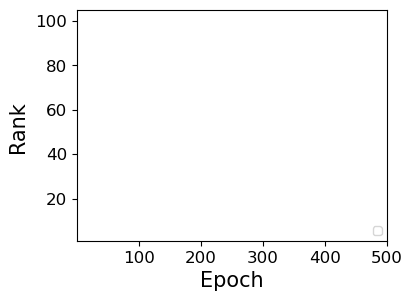

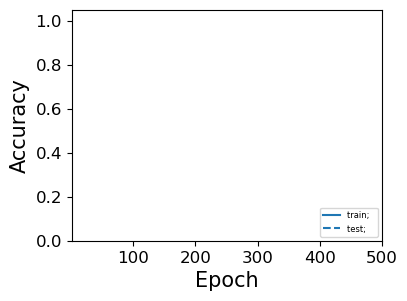

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


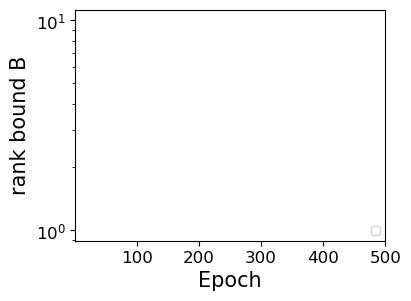


lr: 0.01
wd: 0.0008
bs: 64
early_stop xid 5794

lr: 0.01
wd: 0.0008
bs: 128
early_stop xid 5844

lr: 0.1
wd: 0.0004
bs: 4
early_stop xid 5602

lr: 0.1
wd: 0.0004
bs: 8
early_stop xid 5652

lr: 0.1
wd: 0.0004
bs: 16
early_stop xid 5702

lr: 0.1
wd: 0.0004
bs: 32
xid: 5752


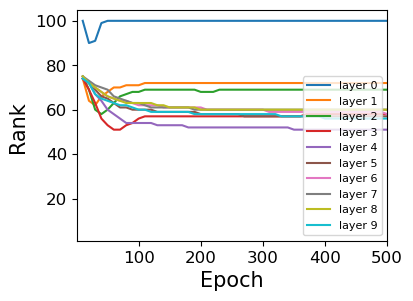

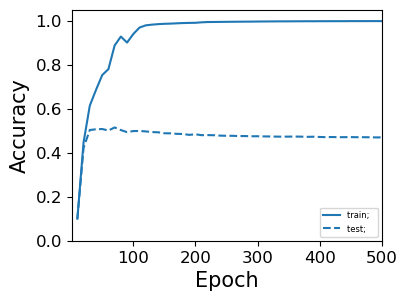

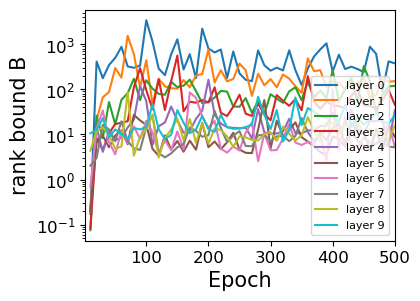


lr: 0.1
wd: 0.0004
bs: 64
xid: 5802


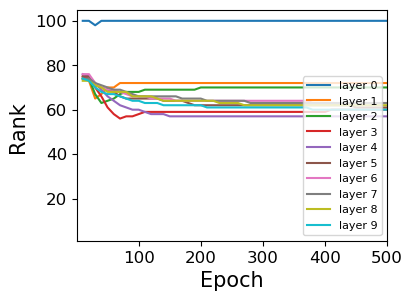

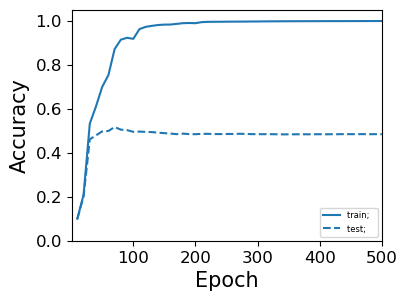

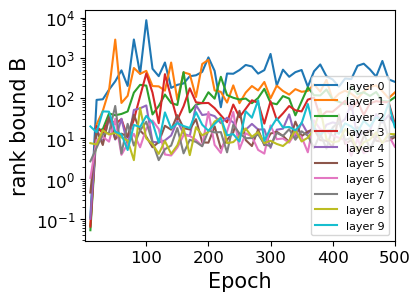


lr: 0.1
wd: 0.0004
bs: 128
xid: 5852


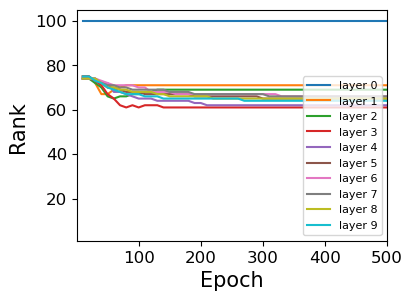

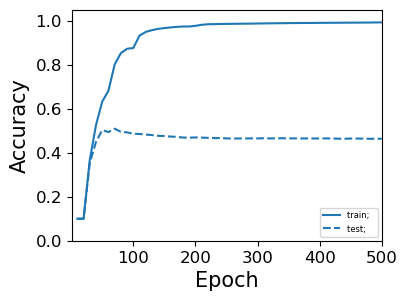

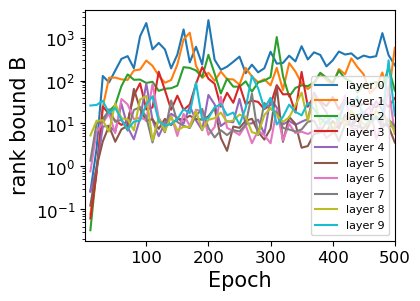


lr: 0.1
wd: 0.0008
bs: 4
early_stop xid 5604

lr: 0.1
wd: 0.0008
bs: 8
early_stop xid 5654

lr: 0.1
wd: 0.0008
bs: 16
xid: 5704


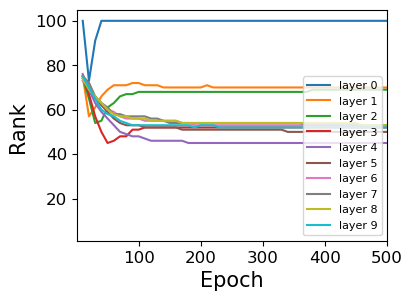

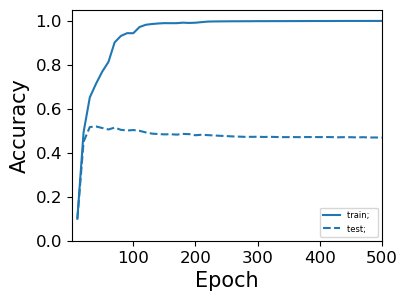

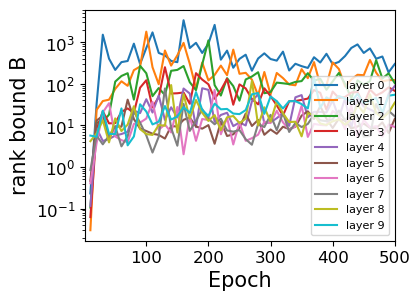


lr: 0.1
wd: 0.0008
bs: 32
xid: 5754


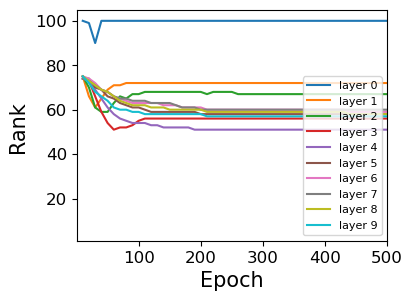

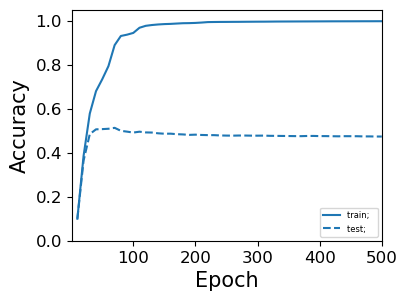

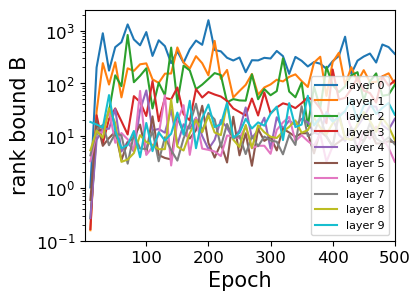


lr: 0.1
wd: 0.0008
bs: 64
xid: 5804


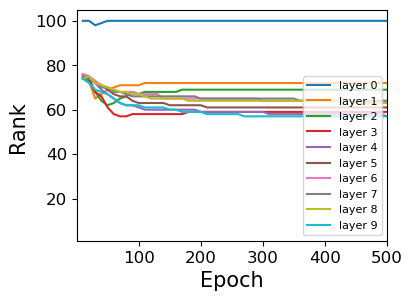

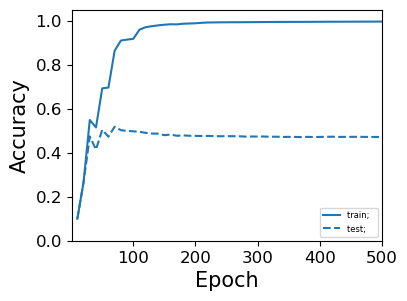

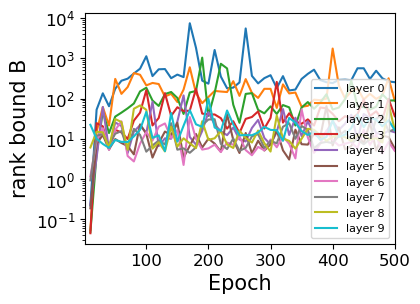

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



lr: 0.1
wd: 0.0008
bs: 128
xid: 5854


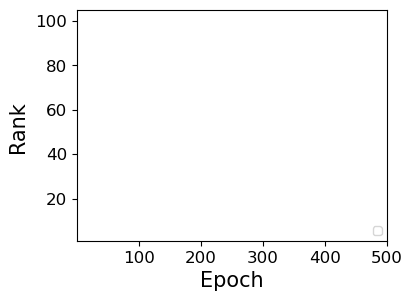

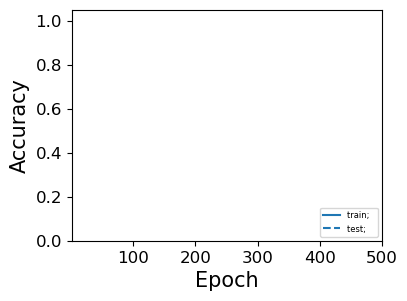

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


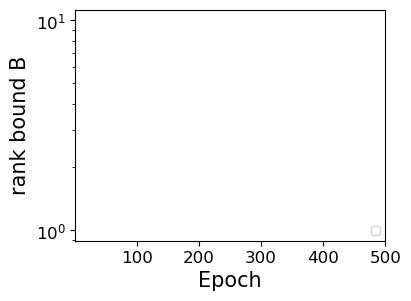


lr: 0.5
wd: 0.0004
bs: 4
early_stop xid 5612

lr: 0.5
wd: 0.0004
bs: 8
early_stop xid 5662

lr: 0.5
wd: 0.0004
bs: 16
early_stop xid 5712

lr: 0.5
wd: 0.0004
bs: 32
early_stop xid 5762

lr: 0.5
wd: 0.0004
bs: 64
early_stop xid 5812

lr: 0.5
wd: 0.0004
bs: 128
xid: 5862


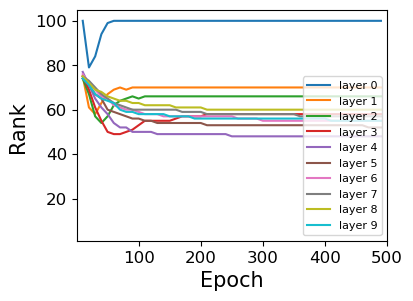

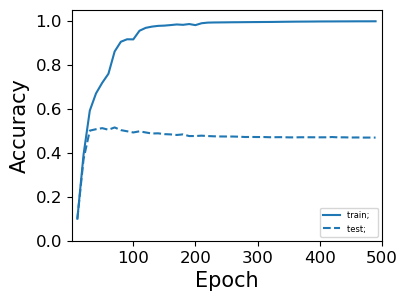

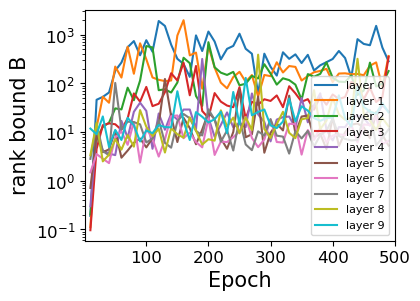


lr: 0.5
wd: 0.0008
bs: 4
early_stop xid 5614

lr: 0.5
wd: 0.0008
bs: 8
early_stop xid 5664

lr: 0.5
wd: 0.0008
bs: 16
early_stop xid 5714

lr: 0.5
wd: 0.0008
bs: 32
early_stop xid 5764

lr: 0.5
wd: 0.0008
bs: 64
xid: 5814


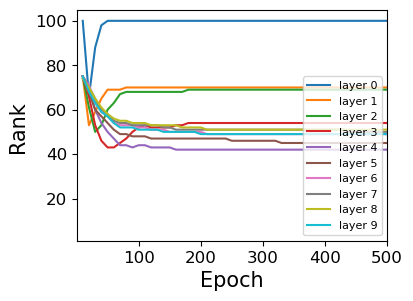

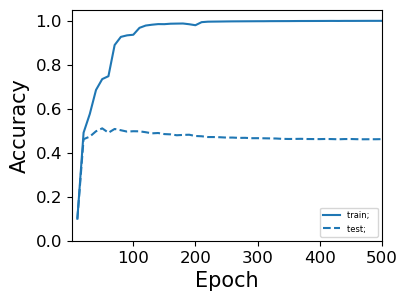

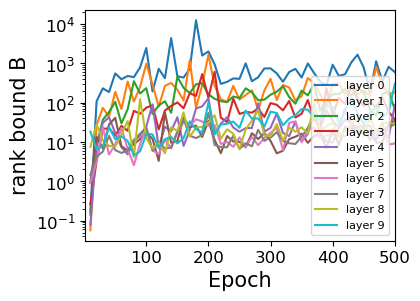


lr: 0.5
wd: 0.0008
bs: 128
xid: 5864


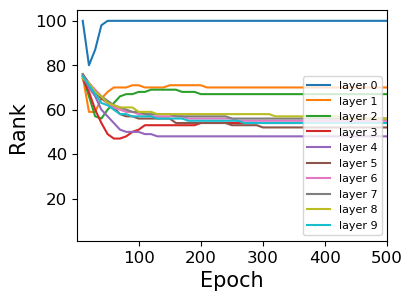

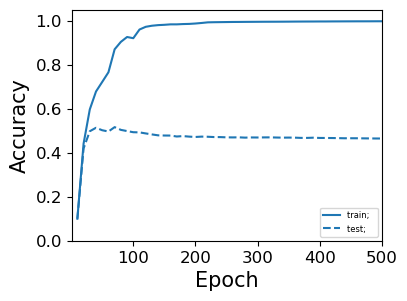

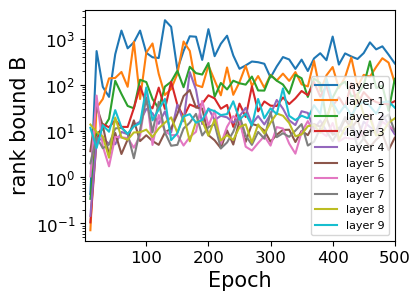


lr: 1.0
wd: 0.0004
bs: 4
early_stop xid 5622

lr: 1.0
wd: 0.0004
bs: 8
early_stop xid 5672

lr: 1.0
wd: 0.0004
bs: 16
early_stop xid 5722

lr: 1.0
wd: 0.0004
bs: 32
early_stop xid 5772

lr: 1.0
wd: 0.0004
bs: 64
early_stop xid 5822

lr: 1.0
wd: 0.0004
bs: 128
early_stop xid 5872

lr: 1.0
wd: 0.0008
bs: 4
early_stop xid 5624

lr: 1.0
wd: 0.0008
bs: 8
early_stop xid 5674

lr: 1.0
wd: 0.0008
bs: 16
early_stop xid 5724

lr: 1.0
wd: 0.0008
bs: 32
early_stop xid 5774

lr: 1.0
wd: 0.0008
bs: 64
early_stop xid 5824

lr: 1.0
wd: 0.0008
bs: 128
early_stop xid 5874



In [24]:
# Bound B, depth=10, width=100, weight decay on last layer
for lr in [0.001, 0.01, 0.1, 0.5, 1.0]:
    for weight_decay in [4e-4,8e-4]:
        for batch_size in [4,8,16,32,64,128]:
            print("lr:", lr)
            print("wd:", weight_decay)
            print("bs:", batch_size)
            param_plot(
                net='mlp_wn',
                loss='CE', 
                batch_size=batch_size,
                weight_decay=weight_decay,
                lr=lr,
                rank_bound_version='B4',
                bound_batch_size=64,

                rank_bound=True,
                tol=0.04,
                rank_max=105,
                bound_rank_max=10,
                plot_types=['rank_bound_B'])
            print()

lr: 0.001
wd: 0.0004
bs: 4
early_stop xid 5281

lr: 0.001
wd: 0.0004
bs: 8
early_stop xid 5331

lr: 0.001
wd: 0.0004
bs: 16


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


early_stop xid 5381

lr: 0.001
wd: 0.0004
bs: 32
early_stop xid 5431

lr: 0.001
wd: 0.0004
bs: 64
xid: 5481


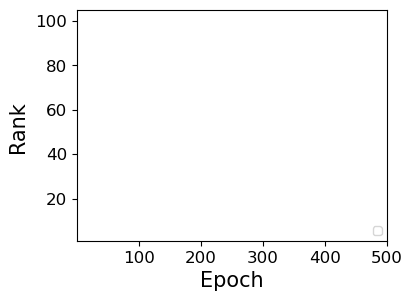

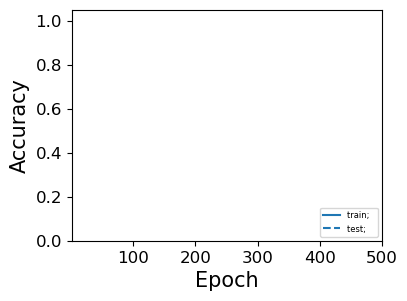

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


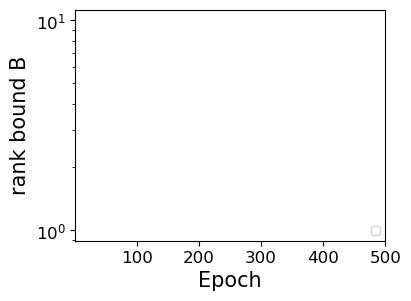


lr: 0.001
wd: 0.0004
bs: 128
early_stop xid 5531

lr: 0.001
wd: 0.0008
bs: 4
early_stop xid 5283

lr: 0.001
wd: 0.0008
bs: 8


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


early_stop xid 5333

lr: 0.001
wd: 0.0008
bs: 16
xid: 5383


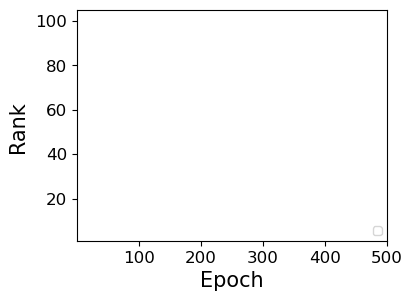

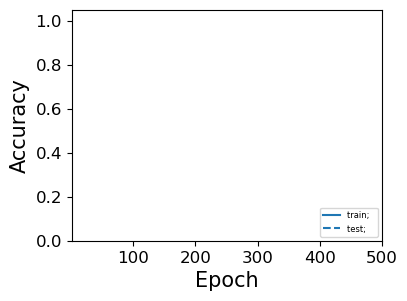

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


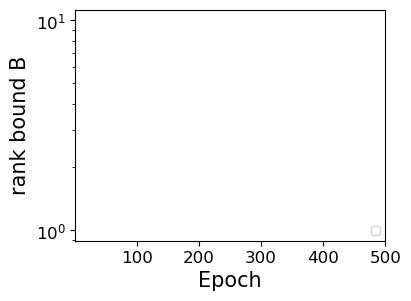


lr: 0.001
wd: 0.0008
bs: 32
early_stop xid 5433

lr: 0.001
wd: 0.0008
bs: 64
early_stop xid 5483

lr: 0.001
wd: 0.0008
bs: 128


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


early_stop xid 5533

lr: 0.01
wd: 0.0004
bs: 4
xid: 5291


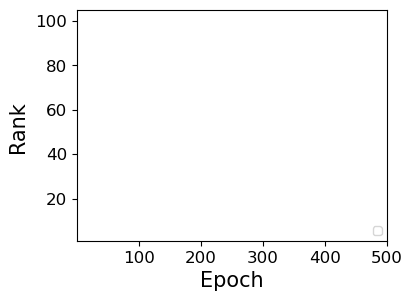

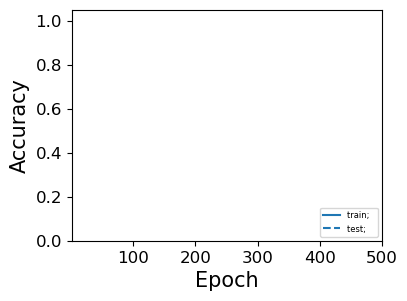

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


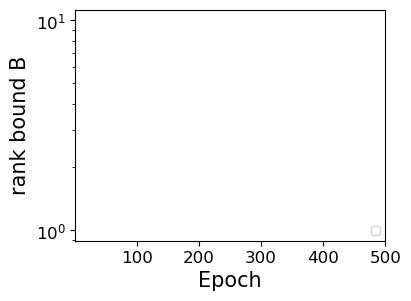


lr: 0.01
wd: 0.0004
bs: 8
early_stop xid 5341

lr: 0.01
wd: 0.0004
bs: 16
early_stop xid 5391

lr: 0.01
wd: 0.0004
bs: 32
early_stop xid 5441

lr: 0.01
wd: 0.0004
bs: 64
early_stop xid 5491

lr: 0.01
wd: 0.0004
bs: 128
early_stop xid 5541

lr: 0.01
wd: 0.0008
bs: 4
early_stop xid 5293

lr: 0.01
wd: 0.0008
bs: 8
early_stop xid 5343

lr: 0.01
wd: 0.0008
bs: 16
early_stop xid 5393

lr: 0.01
wd: 0.0008
bs: 32
early_stop xid 5443

lr: 0.01
wd: 0.0008
bs: 64
early_stop xid 5493

lr: 0.01
wd: 0.0008
bs: 128
early_stop xid 5543

lr: 0.1
wd: 0.0004
bs: 4
early_stop xid 5301

lr: 0.1
wd: 0.0004
bs: 8
early_stop xid 5351

lr: 0.1
wd: 0.0004
bs: 16
early_stop xid 5401

lr: 0.1
wd: 0.0004
bs: 32
early_stop xid 5451

lr: 0.1
wd: 0.0004
bs: 64
early_stop xid 5501

lr: 0.1
wd: 0.0004
bs: 128
early_stop xid 5551

lr: 0.1
wd: 0.0008
bs: 4
early_stop xid 5303

lr: 0.1
wd: 0.0008
bs: 8
early_stop xid 5353

lr: 0.1
wd: 0.0008
bs: 16
early_stop xid 5403

lr: 0.1
wd: 0.0008
bs: 32


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


xid: 5453


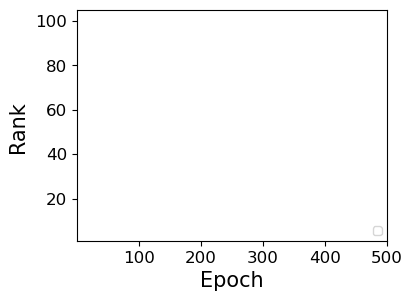

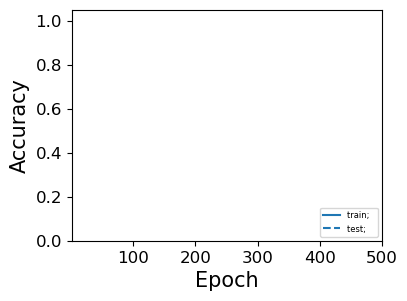

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


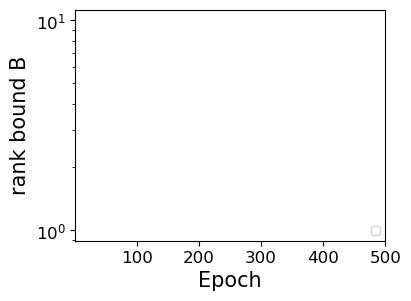


lr: 0.1
wd: 0.0008
bs: 64
early_stop xid 5503

lr: 0.1
wd: 0.0008
bs: 128
early_stop xid 5553

lr: 0.5
wd: 0.0004
bs: 4
early_stop xid 5311

lr: 0.5
wd: 0.0004
bs: 8
early_stop xid 5361

lr: 0.5
wd: 0.0004
bs: 16
early_stop xid 5411

lr: 0.5
wd: 0.0004
bs: 32
early_stop xid 5461

lr: 0.5
wd: 0.0004
bs: 64
early_stop xid 5511

lr: 0.5
wd: 0.0004
bs: 128
early_stop xid 5561

lr: 0.5
wd: 0.0008
bs: 4


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


xid: 5313


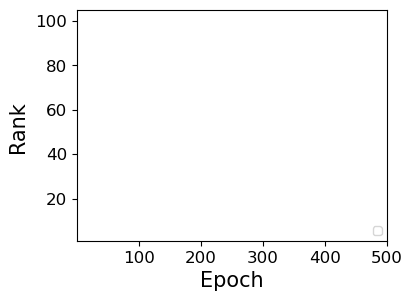

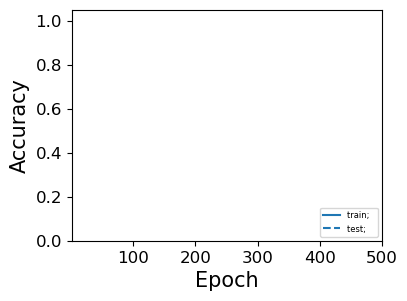

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


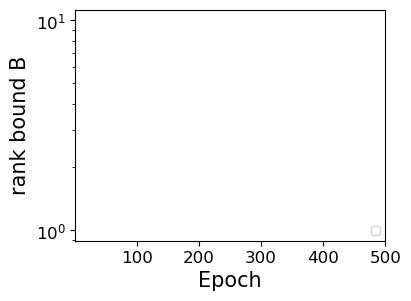


lr: 0.5
wd: 0.0008
bs: 8
early_stop xid 5363

lr: 0.5
wd: 0.0008
bs: 16
early_stop xid 5413

lr: 0.5
wd: 0.0008
bs: 32
early_stop xid 5463

lr: 0.5
wd: 0.0008
bs: 64
early_stop xid 5513

lr: 0.5
wd: 0.0008
bs: 128
early_stop xid 5563

lr: 1.0
wd: 0.0004
bs: 4
early_stop xid 5321

lr: 1.0
wd: 0.0004
bs: 8
early_stop xid 5371

lr: 1.0
wd: 0.0004
bs: 16
early_stop xid 5421

lr: 1.0
wd: 0.0004
bs: 32
early_stop xid 5471

lr: 1.0
wd: 0.0004
bs: 64
early_stop xid 5521

lr: 1.0
wd: 0.0004
bs: 128
early_stop xid 5571

lr: 1.0
wd: 0.0008
bs: 4
early_stop xid 5323

lr: 1.0
wd: 0.0008
bs: 8
early_stop xid 5373

lr: 1.0
wd: 0.0008
bs: 16
early_stop xid 5423

lr: 1.0
wd: 0.0008
bs: 32
early_stop xid 5473

lr: 1.0
wd: 0.0008
bs: 64
early_stop xid 5523

lr: 1.0
wd: 0.0008
bs: 128
early_stop xid 5573



In [23]:
# Bound B, weight decay on all layers
for lr in [0.001, 0.01, 0.1, 0.5, 1.0]:
    for weight_decay in [4e-4,8e-4]:
        for batch_size in [4,8,16,32,64,128]:
            print("lr:", lr)
            print("wd:", weight_decay)
            print("bs:", batch_size)
            param_plot(
                net='mlp_wn',
                loss='CE', 
                batch_size=batch_size,
                weight_decay=weight_decay,
                lr=lr,
                rank_bound_version='B3',
                bound_batch_size=64,

                rank_bound=True,
                tol=0.04,
                rank_max=105,
                bound_rank_max=10,
                plot_types=['rank_bound_B'])
            print()

5289


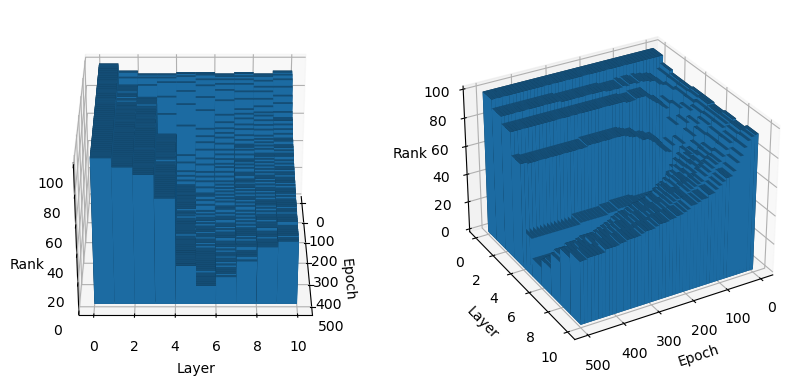

In [52]:
xid = find_matching_xids(
net='mlp_wn',
loss='CE', 
batch_size=4, # batch size used when training network
weight_decay=2e-4,
lr=0.01,
rank_bound_version='B3',
bound_batch_size=64)[0]

print(xid)
plot_rank_by_layer(plot_name='', xid=xid, pid=0, save_directory='', filetype='', tol=0.01)

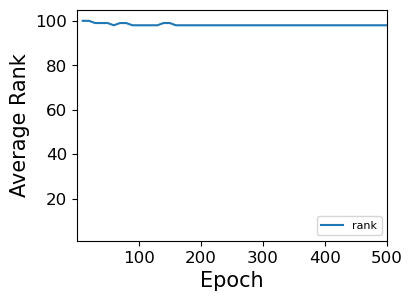

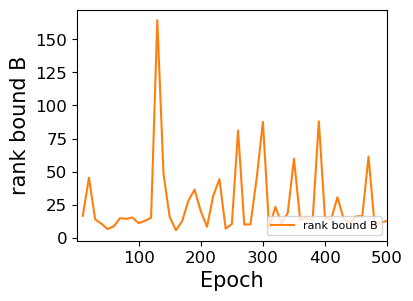

In [56]:
param_plot(
net='mlp_wn',
loss='CE', 
batch_size=16,
weight_decay=2e-4,
lr=0.01,
rank_bound_version='B3',
bound_batch_size=64,

layer=9,
tol=0.01,
rank_max=105,
bound_rank_max=1)

## Rank Bound A

batch_size 4


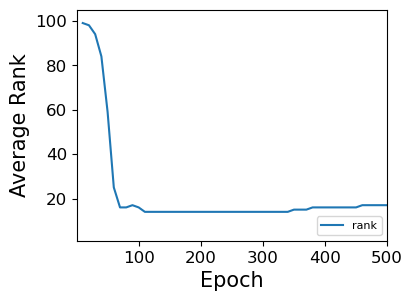

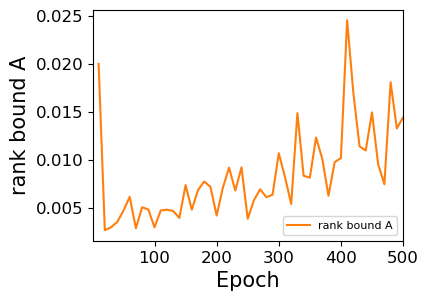

batch_size 8


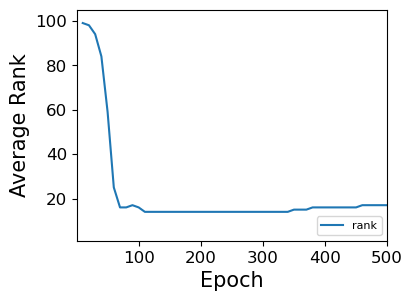

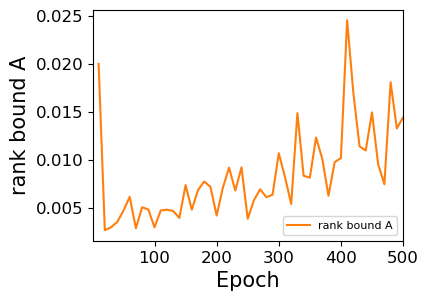

batch_size 16


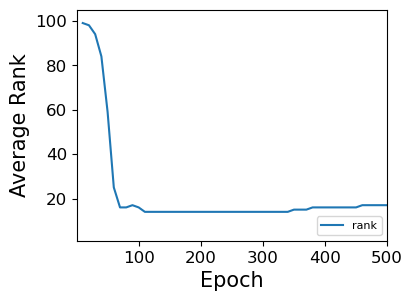

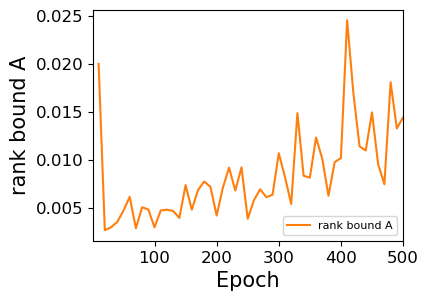

batch_size 32


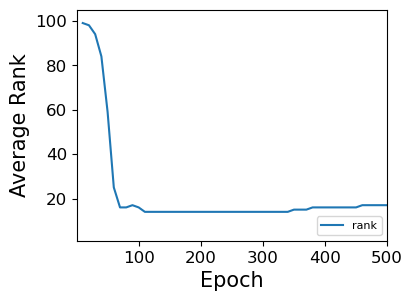

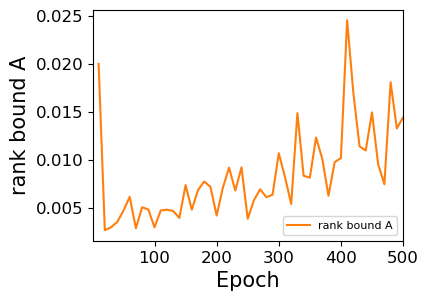

batch_size 64


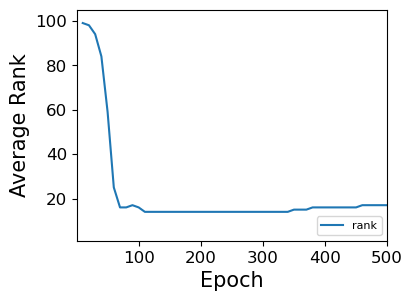

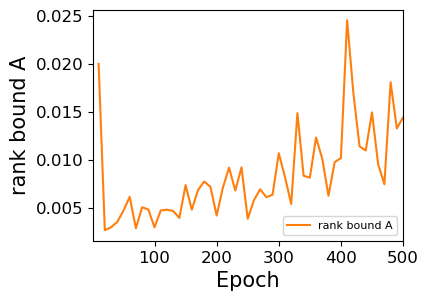

batch_size 128


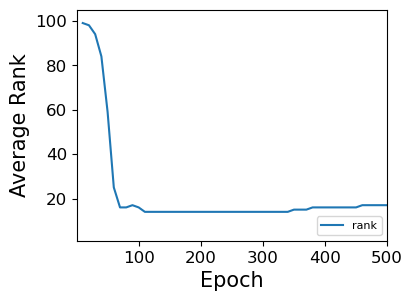

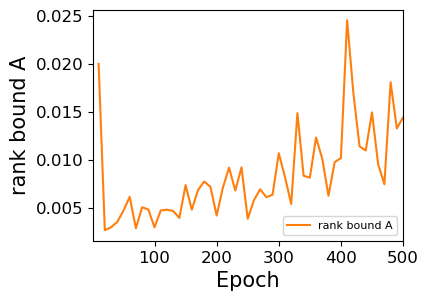

In [51]:
for batch_size in [4,8,16,32,64,128]:
    print("batch_size", batch_size)
    param_plot(
        net='mlp',
        loss='CE', 
        batch_size=4, # batch size used when training network
        bound_batch_size=4, # number of samples in each batch when calculating gradient norm
        weight_decay=1e-4,
        lr=0.1,
        rank_bound_version='A0',
        
        rank_max=105,
        bound_rank_max=1,
        layer=5)